In [896]:
import pandas as pd
import numpy as np
import geopandas as gpd
import plotly.express as px
import sweetviz as sv
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed
import datashader as ds
import hvplot.xarray
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import geopandas
import shapely
import math
import warnings
from copy import deepcopy

from sklearn import set_config
from sklearn.model_selection import GroupShuffleSplit 
from sklearn.preprocessing import FunctionTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MaxAbsScaler
#from sklearn.preprocessing import 
from sklearn.metrics import mean_absolute_error
from sklearn.compose import TransformedTargetRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import QuantileTransformer

In [897]:
%matplotlib inline

# Modelling Minimum Spend Venue Hire Prices
## Goals
The objectie of this notebook is: 
- To explore the minimum spend hire price data and identify useful predictors of the 'total_price' variable (which is the minimum spend required to book the venue). 
- Build a model to predict minimum spend hire fee prices of venues based on the characteristics of the venue. 

## Load Data
Below we load the data: 

In [898]:
# all ptice types data
all_prices = pd.read_csv('../data/datasets_for_modeling/all_hire_fee_and_min_spend_data_31_jul_22.csv')
# just minimum spend price type data
min_spend = pd.read_csv('../data/datasets_for_modeling/min_spend_data_31_jul_22.csv')

In [899]:
min_spend.head()

,space_url,time_period_desc_fixed,price_type,total_price,venue_url,venue_name,space_name,latitude,longitude,address,nearest_tube_station,tube_distance,max_seated,max_standing,max_seated_or_standing,min_area_per_person,area_in_m2,standing,dining,theatre,boardroom,classroom,cabaret,u_shaped,Dining_max,Theatre_max,Boardroom_max,Classroom_max,Cabaret_max,U-Shaped_max,supervenue,external_catering,in_house_kitchen,byo_alcohol,venue_provides_alcohol,alcohol_licence,extension_available,complimentary_water,complimentary_tea_and_coffee,Halal_menu,Kosher_menu,vegan_menu,gluten_free_menu,parking,Wi-Fi,Projector,Flipchart,Natural_light,Flatscreen_TV,Whiteboard,Conference_call_facilities,Air_conditioning,Storage_space,Accommodation_available,Own_music_allowed,Bring_your_own_DJ,PA_system_or_music_speakers_available,Wheelchair_accessible,Promoted_or_ticketed_events,Loud_music_or_events,Wedding_licence,Temporary_event_notices_(TENs)_available,Disabled_access_toilets,Ground_level,Lift_to_all_floors
0,https://www.tagvenue.com/rooms/bayswater/3064/...,Per day,min. spend,2500.0,https://www.tagvenue.com/venues/bayswater/1119...,queens skate dine bowl,the sinbin,51.510877,-0.187390,"17 Queensway, Bayswater, W24QP",Queensway Station,100.0,0,120,120,83.333333,10000.0,True,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,False,No External Catering,True,BYO alcohol not allowed,True,23:00,extension available,True,False,True,False,True,True,Paid Parking,True,False,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False
1,https://www.tagvenue.com/rooms/croydon/9082/mr...,Per evening,min. spend,500.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,the pink room,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,40,50,50,0.900000,45.0,True,True,False,False,False,False,True,40.0,0.0,0.0,0.0,0.0,30.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False
2,https://www.tagvenue.com/rooms/croydon/9306/mr...,Per evening,min. spend,2000.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,whole venue,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,100,300,300,0.896667,269.0,True,True,True,False,True,False,False,100.0,50.0,0.0,100.0,0.0,0.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,True,False,True,False,False,False,True,False,False,False,False,False,False,False,True,True,True,False,True,False
3,https://www.tagvenue.com/rooms/london-wc1e-6jl...,Per evening,min. spend,2000.0,https://www.tagvenue.com/venues/london-wc1e-6j...,simmons | euston square,whole venue,51.523498,-0.135484,"31 University Street, London WC1E 6JL, WC1E 6JL",Warren Street Station,250.0,0,150,150,5.660000,849.0,True,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,False,Any External Caterer - no fee - no kitchen for...,False,BYO alcohol not allowed,True,0:00,extension available,False,False,venue doesnt provide catering,venue doesnt provide catering,venue doesnt provide catering,venue doesnt provide catering,No Parking Available,False,False,False,True,False,False,False,True,False,False,True,True,True,False,False,True,False,True,False,False,False
4,https://www.tagvenue.com/rooms/london-wc1e-6jl...,Per evening,min. spend,500.0,https://www.tagvenue.com/venues/london-wc1e-6j...,simmons | euston square,function room,51.523498,-0.135484,"31 University Street, London WC1E 6JL, WC1E 6JL",Warren Street Station,250.0,0,60,60,3.683333,221.0,True,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,False,Any External Caterer - no fee - no kitchen for...,False,BYO alcohol not allowed,True,0:00,extension available,False,False,venue doesnt provide catering,

## Exploration
We will use the **sweetViz** and **dataprep** auto-EDA tools to quickly explore all the variables in our dataset. 
### SweetViz EDA Report

                                             |          | [  0%]   00:00 -> (? left)


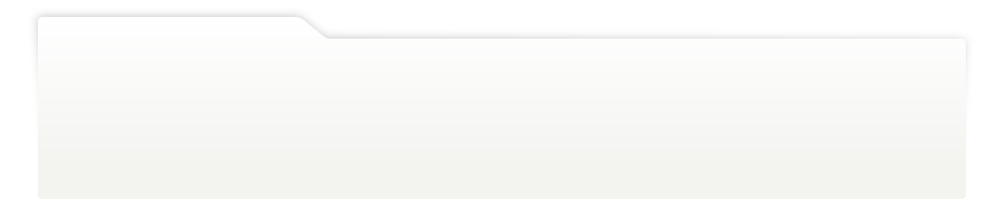
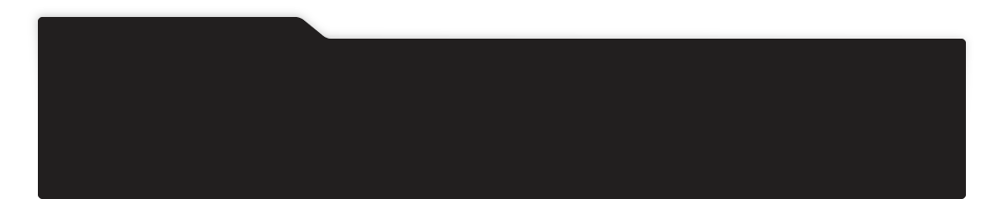
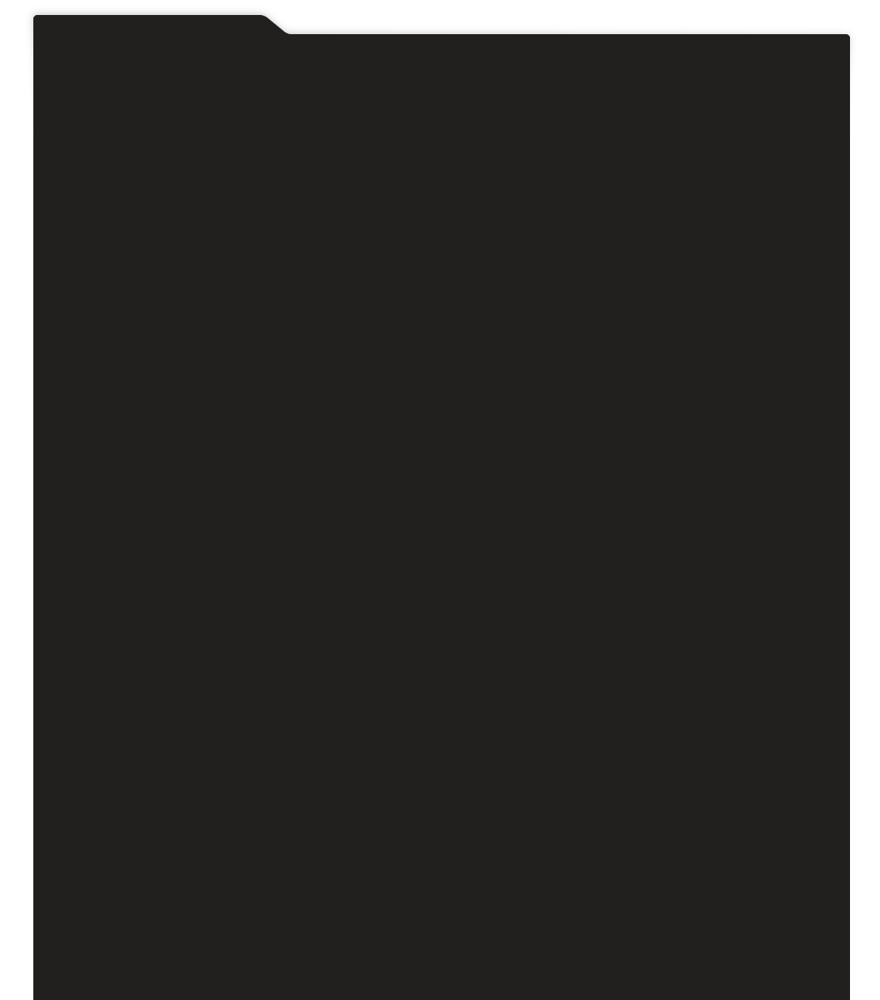
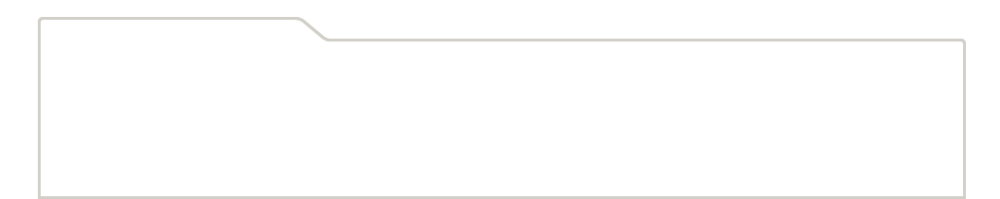
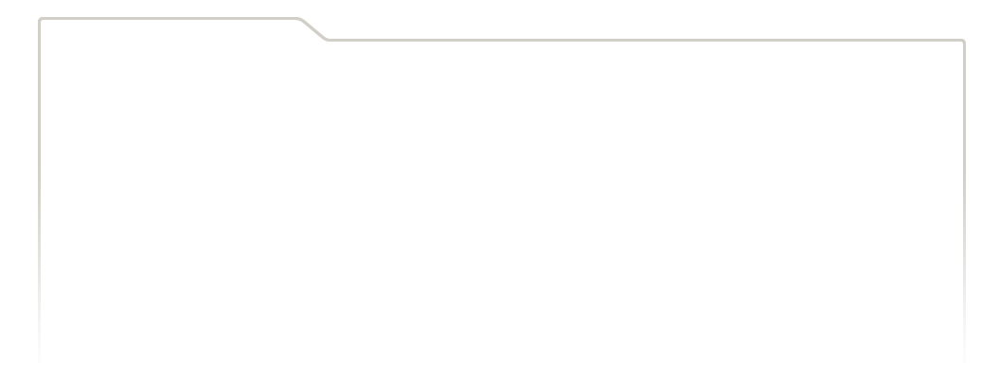
...
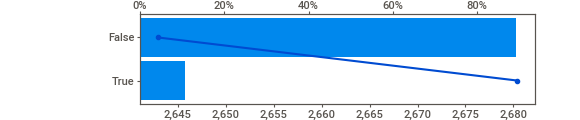
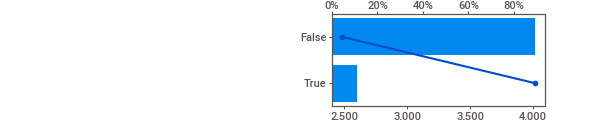
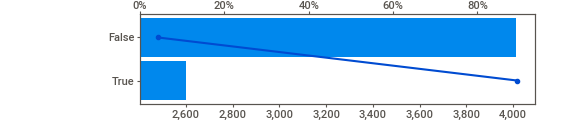
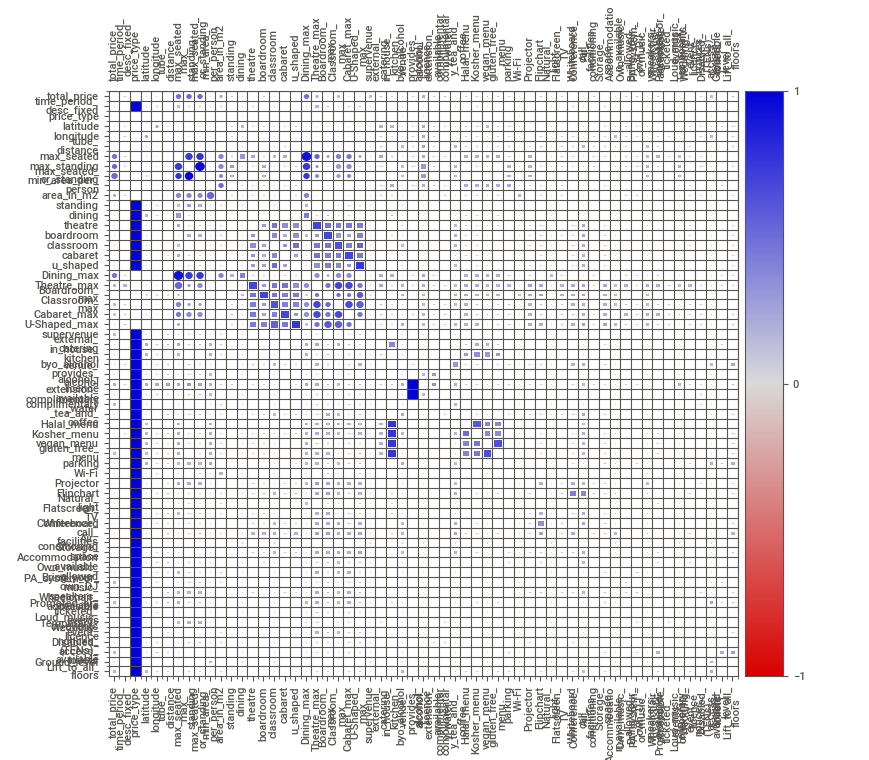
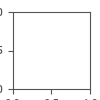

In [900]:
my_report = sv.analyze(source = min_spend, target_feat='total_price', 
                       pairwise_analysis = 'on')
my_report.show_notebook()

**Observations:**
- Our target variable ('total_price') has a mean value of 2647 and median value of 1500 - the discrepancy between them is reflective of the large outlying values beyond ~10,000 which have shifted the mean upwards. It is probably worth removing the over ~10,000 observations. 
- We also see some of the smaller values, up to 100 are quite infrequent, these may also be outliers. 
- Looking at the correlation of numerical associations with 'total_price' we see the largest values are different measures of max occupancy e.g. max_seated_or_standing, max_standing, Dining_max etc. They are all positive correlation coefficients of the order ~0.45. We think the maximum occupancy variables act as indicators for the size of the venue. Larger venues have higher prices, which is intuitive. The largest correlation is for max_seated_or_standing. Looking at the correlation matrix, you can see they have a lot of multicollinearity, as you would expect since they are all indicators of space. We are inclined to just take the max_seated_or_standing variable as a predictor to eliminate the multi-collinearity and because it has the largest correlation (0.5). We may experiment with including the other measures (e.g. with variable selection).
- area_in_m2 has a much lower correlation (0.2) than the previous variables. During data cleaning we found the area variable was unreliable, with implausible values. This confirms it is an unreliable measure of venue size, since it has a fairly poor correlation with total_price - we expected a stronger relationship between venue area and price. 
- tube_distance shows a surprisingly weak relationship with total_price - distance from the tube often has a significant influence over residential rent prices and we expected something similar with venue hire, perhaps seeing a higher rent price for a venue that is 'better' situated near a tube. But this does not come through very strongly in our venue prices. In the tube_distance histogram, we see the mean total_price overlaid, and there is a rough but not reliable decline in price for further distances from the nearest tube. Curiously, we see the total_price jump from the first histogram bar to the second, implying higher prices for further distances from the tube! We would like to explore this variable more, the mean may be a poor statistic to understand the underlying trend. 
- The categorical associations generally look quite weak, with a maximum correlation ratio of 0.15 for alcohol_license. We have a lot of weakly correlating categorical variables, so we plan to use PCA to try and extract some value from them. 
- Latitude looks to have a roughly normal shaped relationship with total_price i.e. maximum for middle range latitude values. This can be interpreted to mean that central London prices (i.e. mid range latitude values) are higher than prices for venues situated out from central London, which is what we might expect. The tails of the distribution have higher prices, which we did not expect. We suspect that outlying values such as massive event spaces like a stadium could be causing this. They are situated further out but cost a lot more. 
- Longitude - we expected this to show a similar relationship to latitude but it does not. The price appears to increase from left to right (West to East). This is a bit odd.
- There are a few bool variables such as 'boardroom' and 'standing' which indicate if the venue offers that type of seating / arrangement / facility. They are generally quite imbalanced e.g. typically 75% to 25% True / False which may make their conclusions unreliable / liable to overfitting. Some interesting trends are that having a boardroom actually lowers the price - probably because corporate room hire is a cheaper market - and having a theatre increases the price. They all have low correlation ratios with total_price, suggesting they are not particularly useful for predicting price. We would like to try PCA or variable selection on them. 
- supervenue is an interesting variable. It is effectively a badge bestowed on a venue by Tagvenue to indicate its a particularly good venue. We see that surprisingly, the mean price is lower for supervenues than for non-supervenues. This may indicate that supervenues keep their pricing up to data and accurate, and that other prices may be inflated / out of date / higher. 
- alcohol_license is a bit of a mess, we think the 30 mins granularity between times is splitting up the data into sparse groups. We would like to re-engineer this variable into 1 or 2 hour time periods and see how useful it becomes then. 
- Some of the menu variables like vegan_menu and gluten_free may be good categorical variables. They have quite even distributions. 
- Most of the remaining categorical variables such as air_conditioning or own_music_allowed are all seemingly not particularly strong predictors but may be useful. We think either PCA or a variable selection / regularisation algorithm will be essential for selecting out of these variables.  

### DataPrep EDA

**upload dataprep report to github and make viewable - easiset to create report in jupyter then save and open in browser** 

Installing the dataprep library into our virtual environment broke javascript which caused issues with of the exploration functionality / plotting. We saved the dataprep report as **report.html** in the same folder as this notebook. You can view the html file **add link** here. Below we outline our findings from this report: 


- max_seated_or_standing, latitude and longitude - From boxplot and distributions, you can see we have some outliers that we should probably remove. 
- tube distance - scatter plot with total_price shows the interesting relationship where total_price tends to increase up to about 200m then starts to decrease. We wonder if the initial strange behaviour is due to some other variables. We would like to test the relationship between tube_distance and total_price while controlling for other variables such as location.
- We noted previously that having certain room setups available such as 'boardrooms' decreases the average total_price. Looking at the scatter plot of board_room_max against 'total_price' we can see that although the typical price may be lower, it still shows a positive correlation i.e. larger boardrooms cost more. Perhaps we should consider some kind of interaction term between boardroom and boardroom_max etc.    
- missing values - we are only missing values in tube_distance, nearest_tube_station, min_area_per_person and area_in_m2. 
### Exploring Categorical Variables
We will now explore the relationship between the categorical variables and the target variable **total_price**. We have built a function that allows us to select categorical columns to explore using a dropdown. Upon selecting a column, several different plots are shown to visualise the relationship between that column and the target variable.

In [901]:
def explore_categorical_data(df, target, specific_columns = None, 
                             filter_on_categorical = False):
    """Visualise relationship between categorical variable and target.
    
    This is intended to help identify useful categorical predictors for a 
    regression model that is predicting a continous target variable.
    
    User selects categorical column to visualise from drop down menu. The 
    4 plots below are generated. All distribution plots are showing the 
    distribution of the target variable for each different category.  
       - Count of Observations in Each Category
       - Box Plot per Category
       - Violin Plot per Category
       - Histogram of Target Per Category. 
    
    A Check box allows you to choose whether to overlay the violin plots 
    on top of one another. Another check box allows you to toggle whether 
    separate histogram plots are made per category.
    
    It is strongly recommended that you try to filter out columns that do not 
    show useful categorical variables by using either the specific_columns or 
    filter_on_categorical arguments. 
    
    Args: 
        df (dataframe): Dataframe of observations containing predictors and 
            target variable for regression model.
        target (string): Name of target variable column in df. 
        specific_columns (list of strings): List of strings defining the 
            categorical variable columns in df you wish to explore. You 
            will only see these columns in the drop down. 
        filter_on_categorical (bool): Set True if you want the function to 
            attempt to identify categorical columns in df. This will limit 
            the columns in the drop down to whatever is identified as a 
            categorical column with low cardinalilty (fewer than 30 
            categories). The 'specific_columns' argument supersedes 
            this argument.  
    """
    
    categorical_cols = df.columns
    if specific_columns != None:
        # Use specified_columns as categorical columns that will be plotted
        categorical_cols = specific_columns
    elif filter_on_categorical:
        # Select all df columns that are likely to contain 
        # categorical variables
        categorical_cols = df.select_dtypes(['object', 'bool', 
                                             'string', 'category']).columns
        # Calculate bool of if each categorical column has fewer than 30 
        # unique values
        cat_cols_low_cardinality = df[categorical_cols].nunique() < 30
        # Filter out columns with over 30 unique values
        categorical_cols = [col for col, include 
                    in zip(categorical_cols,cat_cols_low_cardinality) 
                    if include]
        
    interact(create_categorical_plots, col_selected = categorical_cols, 
         target = fixed(target), df = fixed(df),
         violin_overlay = False, separate_histogram_plots = False)

def create_categorical_plots(df, target, col_selected, 
                             violin_overlay = False, 
                             separate_histogram_plots = False):
    """Generate plots to explore selected categorical columns of data. 
    
    Generates 4 plots:
    - Count of Observations in Each Category
    - Box Plot per Category
    - Violin Plot per Category
    - Histogram of Target Per Category
    
    Arguments:
        df (pandas datafram): The dataframe whose categorical variables
            you wish to plot / explore.
        target (string): The name of the column containing the target 
            variable i.e. variable you wish to model e.g. 'price'.
        col_selected (string): The name of the column whose categorical 
            variables you wish to explore e.g. 'gender'. 
        violin_overlay (bool): Set True to make the violin plot use 
            'overlay' mode which plots viiolin plots directly on top of 
            one another.
        separate_histogram_plots (bool): Set True to plot each category 
            from the column col_selected as a separte plot (one 
            underneath the next).
    Returns:
        None: Nothing Returned, just creates and displays plots."""

    bar = px.histogram(df, x = col_selected, color = col_selected, 
                      title = 'Count of Observations in Each Category')
    
    box_plot = px.box(df, y = target, color = col_selected, 
                      height = 400, title = 'Box Plot per Category')

    violinmode = 'group'
    # Change violinmode to 'overlay' if violin_overlay is True
    if violin_overlay:
        violinmode = 'overlay'
    
    violin_plot = px.violin(df, y = target, color = col_selected, 
                            height = 400, violinmode=violinmode, 
                            points='all', 
                            title = 'Violin Plot per Category')
    
    facet_row = None
    barmode = 'overlay'
    height = 400
    # If separate_histogram_plots is True, changes facet_row to plot 
    # a new histogram per category in col_selected column of df 
    if separate_histogram_plots:
        facet_row = col_selected
        num_categories = len(df[col_selected].unique())
        # Adjust height of plot to be 200 per category
        height = 200 * num_categories
        barmode = 'relative'
    
    hist = px.histogram(df, x = target, color = col_selected, 
                        title = 'Histogram of Target Per Category', 
                        facet_row = facet_row, height = height, 
                        barmode = barmode)
    
    bar.show()
    box_plot.show()
    violin_plot.show()
    hist.show()

In [902]:
explore_categorical_data(min_spend, 'total_price', filter_on_categorical=True)

interactive(children=(Dropdown(description='col_selected', options=('time_period_desc_fixed', 'price_type', 's…

**Observations:**
- Unfortunately, none of the categorical variables look particularly useful for predicting the **total_price**. The different categories within each column (e.g. 'own_music_allowed - True or False) tend to have very similar distributions in **total_price** with only subtle differences, typically within the tails of the distributions. The median / most common values (around the peak of the distributions) occur around the same place with very little variation between them. 
- Based on this, we feel the best approach to dealing with use categorical variables is to use either PCA or regularised regression to select and or combine the categorical variables together.  
- Any interesting differences in mean target value we saw in the SweetViz report effectively disappear when you look at the underlying distributions / medians - this shows how unreliable means can be. 
- We may still re-engineer the alcohol_license column to see whether it provides some more useful predictive power with fewer categories.  

### Longitude & Latitude Engineering
The sweetViz report hinted that there may be a bell shaped relationship between latitude / longitude and **total_price**. This would be the equivalent of saying points closer the the center of London have higher prices than points further out. This would be an intuitive relationship. Below we review the relationship between **total_price** and latitude and longitude by plotting scatter plots. We added a rolling median line to try and verify if prices do indeed tend to increase towards the center (bell shaped relationship):    

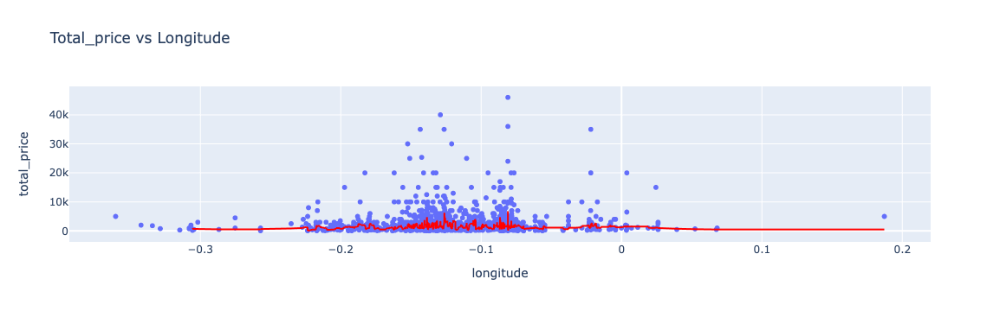

In [903]:
fig = px.scatter(min_spend, x = 'longitude', y = 'total_price', 
                 trendline = 'rolling', 
                 trendline_options=dict(function="median", window=10), 
                 trendline_color_override = 'red', 
                 title = 'Total_price vs Longitude')
fig.show()

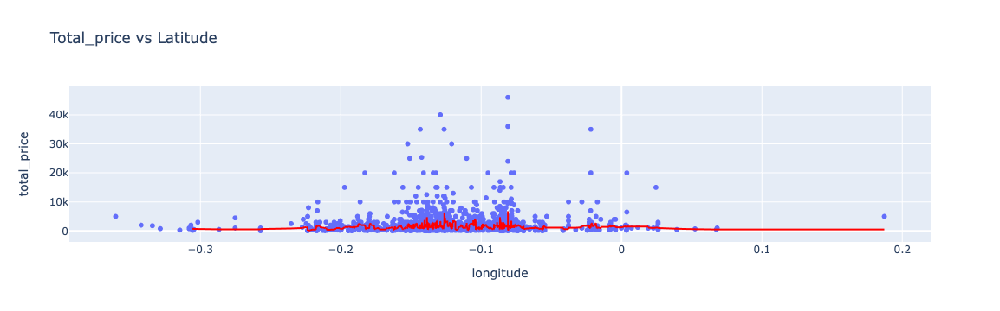

In [904]:
fig = px.scatter(min_spend, x = 'longitude', y = 'total_price', 
                 trendline = 'rolling', 
                 trendline_options=dict(function="median", window=10), 
                 trendline_color_override = 'red', 
                 title = 'Total_price vs Latitude')
fig.show()

**Observations**:
- These plots show there is in fact no clear and simple bell shaped relationship between latitude / longitude and **total_price**. Clearly the prices do tend to increase in central london (middle section of lat / long plots) but it is not a straightforward bell shaped curve. We suspect that specific areas of London are hot spots i.e. have higher prices, which is a more complex / nuanced pricing model.

### A Better Latitude / Longitude Model
We would like to try and use a simple method to identify / categorise the price variation of venues with location. We will use the datashader library to quickly convert aggregate lat long coordinates to a density grid. Below we create simple functions to generate a canvas with the correct pixel resolution for the data provided to it (e.g. if the latitude extent is twice the longitude extent, we will get twice as many grid squares along the latitude direction than the longitude direction). 

In [905]:
def create_canvas(plot_height, x_range = 0, y_range = 0):
    """Create datashader canvas object.
    
    Auto-scales the Y and X pixel resolution (plot_height and plot_width 
    arguments of Canvas method) so that non-symettrical areas (i.e. 
    plotting larger X extent than Y or vice versa by using the x_range 
    and y_range arguments). 
    
    Args: 
        plot_height (int): Number of vertical pixels for canvas. 
        x_range (tuple): Min and max x values to accept in canvas.
        y_range (tuple): Min and max y values to accept in canvas.
    
    Returns:
        canvas: Canvas with pixel resolution set according to ratio of 
        x_range to y_range 
    """     
    
    # Calculate total range of x and y
    len_x = x_range[1] - x_range[0]
    len_y = y_range[1] - y_range[0]
    # Calculate ratio of x range to y range
    ratio_xy = len_x / len_y
    # Calculate x pixel width required for the x y ratio defined by
    # range_x and range_y 
    plot_width = int(round(plot_height * ratio_xy))
    
    print(f"X width = {plot_width} pixels")
    print(f"Y height = {plot_height} pixels")
    print(f"Ratio of X Width / Y Height = {ratio_xy}")
    return ds.Canvas(plot_width=plot_width, 
                    plot_height=plot_height, 
                    x_range = x_range, 
                    y_range = y_range)

Now we create a grid that counts the number of venues in each grid square. Note that the x coordinate is longitude and the y coordinate is latitude. We kept adjusting the plot_height variable (number of latitude grid squares) until we had a what looked like a good amount of detail within central london (i.e. not all averaged into one large square) but retained high number of venues per square to average over. 

**Note** - we use **\_geo** to append the name of this canvas and xarray to indicate we are using geographical coordinates (latitude and longitude). We will try repeating the analysis with projected coordinates because aggregating over areas using geographic coordinates will lead to errors (you should use projected equal area coordinates). 

In [906]:
cvs_geo = create_canvas(x_range = (min_spend.longitude.min(),
                                   min_spend.longitude.max()), 
                        y_range = (min_spend.latitude.min(),
                                   min_spend.latitude.max()), 
                        plot_height =40)

X width = 67 pixels
Y height = 40 pixels
Ratio of X Width / Y Height = 1.6869602854445642


In [907]:
count_geo = cvs_geo.points(min_spend, 'longitude', 'latitude')

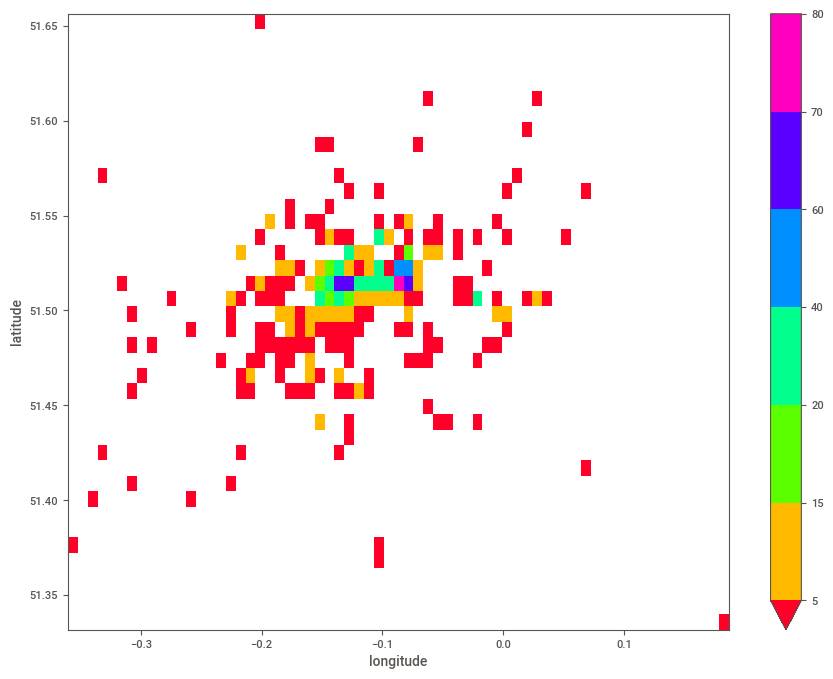

In [908]:
count_geo.where(count_geo > 0).plot(aspect = 'auto', size = 8, 
                                    levels=[5,15,20,40,60,70,80], 
                                    cmap = 'gist_rainbow',
                                    vmin = 20)

**Observations**: 
- We have large areas with very few points (red squares) and a small number of very popular locations (green, blue and pink / purple colours). 
- We will probably exclude the red points from the analysis, we can give them an averaged total_price across all of them. 
- The large outlying red squares should potentially be treated as outliers and be removed.

Below we plot the same density grid but as a contour plot i.e. identifying areas of high and low density. 

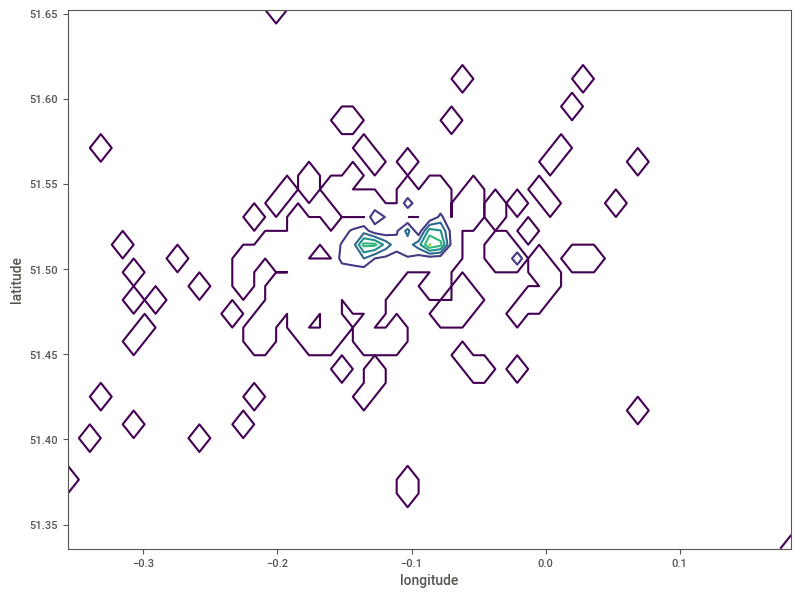

In [909]:
count_geo.plot.contour(size = 7, aspect = 'auto')

We will now repeat the same analysis using projected coordinates and see what impact correcting the coordinates has: 

<Axes: >

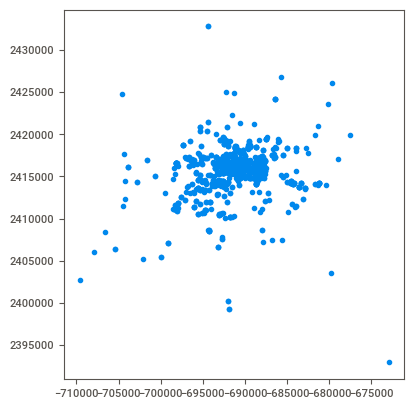

In [910]:
# Convert min_spend to GeoDataFrame
gdf = gpd.GeoDataFrame(min_spend, 
                      geometry=gpd.points_from_xy(min_spend.longitude,
                                                  min_spend.latitude), 
                      crs='WGS84')
# Project to equal area projection for Europe
gdf_proj = gdf.to_crs('ESRI:102013')
gdf_proj.plot()

Note that the projection has warped the location / spread of the locations relative to the lat / long representation and the units have changed. We will now recreate the density plot but using the projected coordinates:   

X width = 55 pixels
Y height = 60 pixels
Ratio of X Width / Y Height = 0.9190843936066809


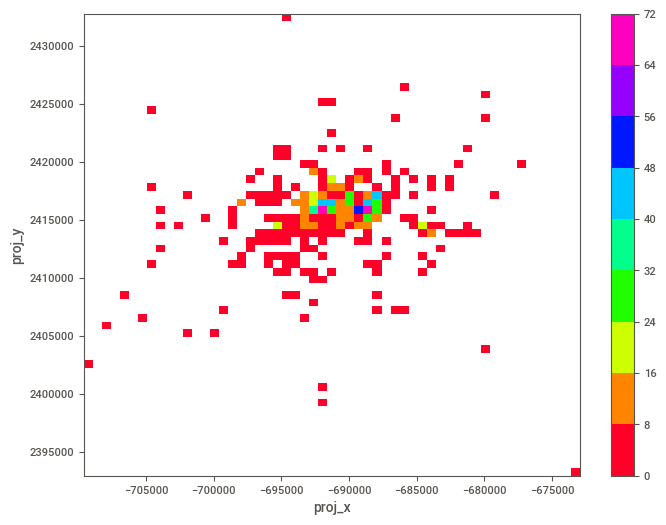

In [911]:
# Create canvas for projected coordinates
cvs_proj = create_canvas(plot_height = 60, 
              x_range = (gdf_proj.geometry.x.min(), gdf_proj.geometry.x.max()),
              y_range = (gdf_proj.geometry.y.min(), gdf_proj.geometry.y.max()))
# Add columns with x and y projected coordinates (currently both are 
# stored in geometry 
gdf_proj['proj_x'] = gdf_proj.geometry.x
gdf_proj['proj_y'] = gdf_proj.geometry.y
# Create density array for projected coordinates (count of venues per pixel)
count_proj = cvs_proj.points(gdf_proj, 'proj_x', 'proj_y')

count_proj.where(count_proj > 0).plot(aspect = 'auto', size = 6, 
                                    #levels=[5,15,20,40,60,70,80, 90], 
                                    levels = 10,
                                      cmap = 'gist_rainbow',
                                    #vmin = 20
                                     )

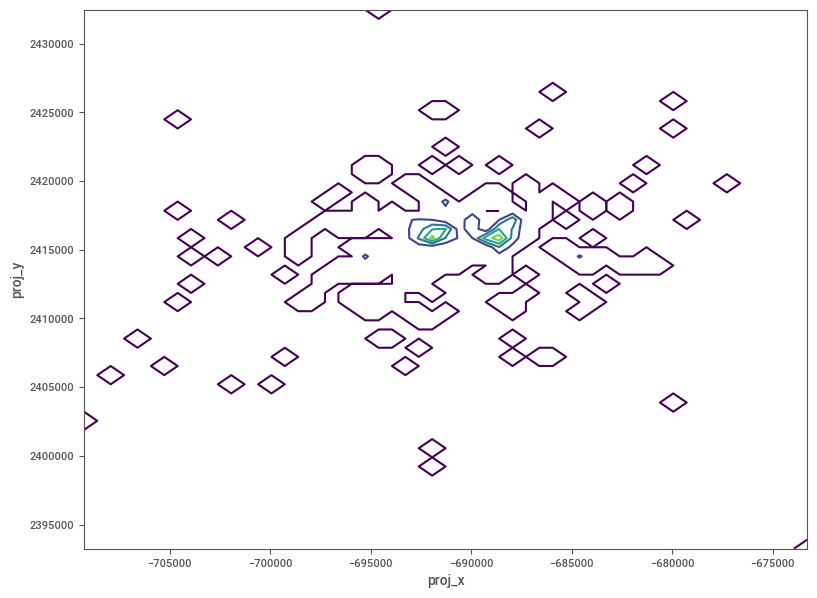

In [912]:
count_proj.plot.contour(size = 7, aspect = 'auto')

**Observations:**
- The projected coordinates have warped / shifted / rotated the distribution of venues, but the basic picture is the same. Venues are mainly concentrated in central London, with 2 very popular areas. Venues are largely concentrated in these 2 areas, with few venues outside them, even in central London. 

We will now calculate the mean **total_price** per pixel using both the projected and geographic coordinates. Ideally, we would use the median, but unfortunately the datashader package does not offer this functionality. 

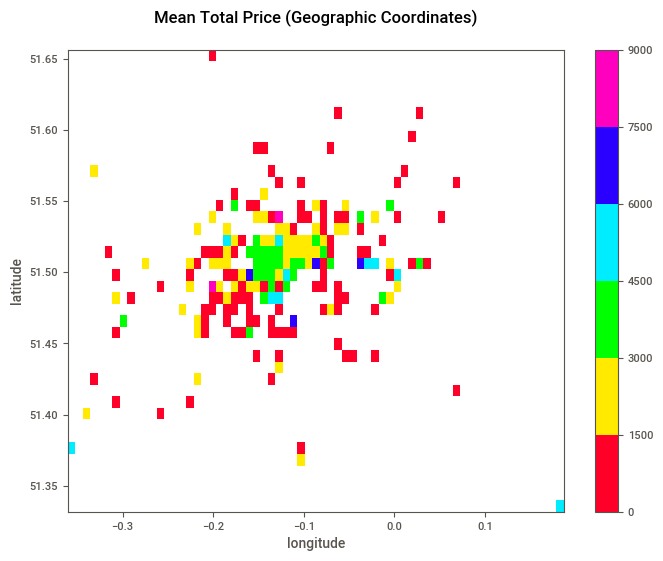

In [913]:
avg_geo = cvs_geo.points(min_spend, 'longitude', 'latitude', 
                         agg = ds.mean('total_price'))
avg_geo.where(avg_geo > 0).plot(aspect = 'auto', size = 6, 
                                levels = 7, cmap = 'gist_rainbow')
plt.title('Mean Total Price (Geographic Coordinates)\n')
plt.show()

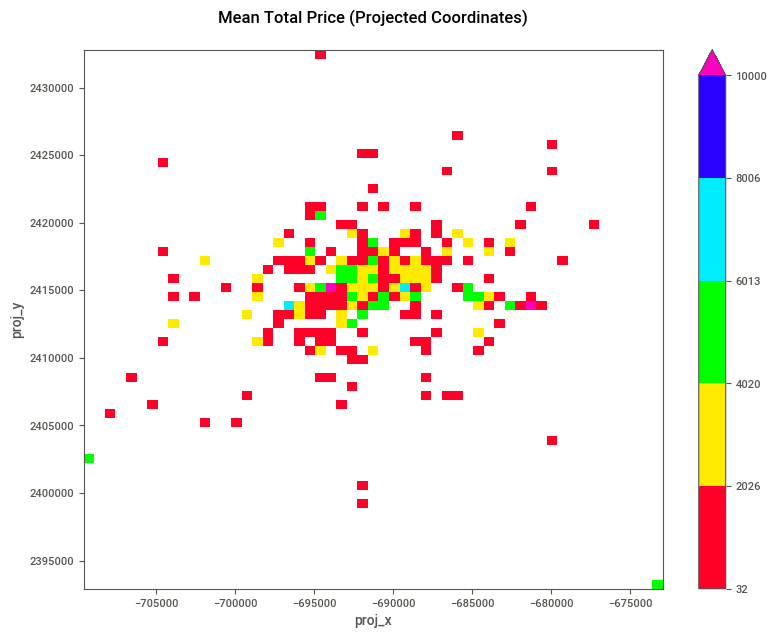

In [914]:
avg_proj = cvs_proj.points(gdf_proj, 'proj_x', 'proj_y', 
                           agg = ds.mean('total_price'))
avg_proj.where(avg_proj > 0).plot(vmax = 10000, aspect = 'auto', 
                                  size = 7, levels = 6,
                                  cmap = 'gist_rainbow')

plt.title('Mean Total Price (Projected Coordinates)\n')
plt.show()

**Observations**: 
- Similar spread of average total price in both plots - a center with more expensive prices surrounded by generally less expensive venues (red or yellow coloured) spreading out wide from the central area. In both plots there are a handful of pixels with particularly high prices (purple / blue / cyan).
- Its hard to take much more from the plots - we think a lot would be learned / verified by adding interactive functionality and map tiles so we can understand where the cheap or expensive areas are geographically and if they make sense. 
- The projected coordinates plot had a very high outlying pixel that suppressed all the other colours. We set a maximum of 10,000 on the color bar to stop this outlyer from hiding the rest of the pricing detail / distribution.

We will quickly plot histograms for the projected and geographic mean venue price to see if we have any outliers:  

(array([109.,  57.,  27.,  15.,   1.,   1.,   0.,   0.,   1.,   1.]),
 array([   32.5 ,  1529.25,  3026.  ,  4522.75,  6019.5 ,  7516.25,
         9013.  , 10509.75, 12006.5 , 13503.25, 15000.  ]),
 <BarContainer object of 10 artists>)

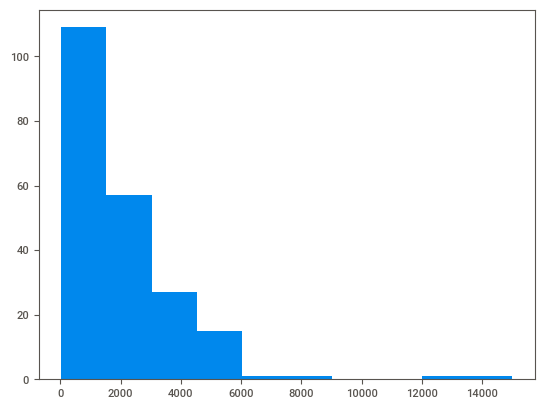

In [915]:
avg_proj.plot.hist()

(array([56., 59., 31., 21., 16.,  9.,  6.,  1.,  2.,  1.]),
 array([  32.5 ,  896.75, 1761.  , 2625.25, 3489.5 , 4353.75, 5218.  ,
        6082.25, 6946.5 , 7810.75, 8675.  ]),
 <BarContainer object of 10 artists>)

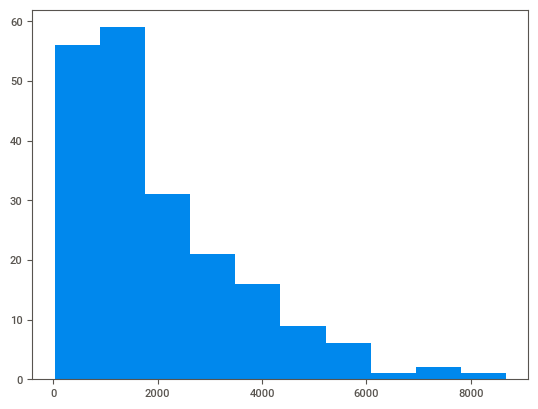

In [916]:
avg_geo.plot.hist()

**Observations:**
- We see that using projected coordinates, we have some large outlying prices. This shows how using different coordinate system has made quite a significant difference to the aggregated prices - perhaps this reflects the sensitivity of the mean to variations in price or simply shows how defining different arbitrary areas to aggregate creates quite a different picture. 

#### Interactive Map Plots
From our analysis above, we have identified a number of different plots and analysis that we would like to be able to see:
- Want to be able to see the pixel data overlaid on a city map to do sense checks and get some more insight i.e. seeing where in London are the more or less expensive venues. 
- Want to be able to filter out what we see based on the count in each square e.g. may not want to include squares with only a handful of data averaged over because it may cause overfitting / be misleading. 
- Want to understand how much data is included or excluded when selecting different counts per pixel e.g. if we only view squares with at least 10 venues, what percentage of all venues will we be seeing? 
- Want to be able to set the color bar limits to prevent outliers from squeezing most of the price variation into the bottom section of color bar - this stops us seeing important price trends.

The below functions take the counts and averaged grid data and optionally any projection used and will create an interactive map plot with the functionality described above. 

In [917]:
def plot_map(ds_count, ds_avg, crs = None):
    """Create interactive map plot. 
    
    Creates map plot using hvplot library. Includes interactive sliders to 
    set the color bar limit and to set the minimum and maximum number of 
    venues a pixel must have to be displayed.
    
    args: 
        ds_count (xarray): Array showing the Count of venues in each pixel.
        ds_avg (xarray): Array showing the Average price of venues per pixel. 
        crs (Cartopy Projection): Indicate the crs used by the data (optional, 
            only required if using a non geometric projection).
            
    Returns:
        hvplot: Interactive hvplot with sliders to set the color bar limits (for
            average price) and to set minimum and maximum counts of venues to 
            include in plot). 
    """
    max_count = ds_count.max()
    # define max min count slider
    selected_data = widgets.IntRangeSlider(value=[0, max_count], 
                                           min=0, max=max_count, 
                                           step=1, description='Min & max Count')
    
    max_average = int(ds_avg.max())
    # Define color bar max slider
    max_color = widgets.IntSlider(min=0, max=max_average, step=100, 
                                  value=max_average, description= 'col_bar max')
    # Returns interactive hvplot with sliders where changing the sliders will 
    # update the plot. 
    return interact(map_plot_auto, ds_count = fixed(ds_count), ds_avg = fixed(ds_avg), 
                    max_color = max_color, 
                    crs = fixed(crs), selected_data = selected_data)

def map_plot_auto(ds_count, ds_avg, max_color, crs, selected_data):
    """Create hvplot based on slider inputs and count array.
    
    args: 
        selected_data (tuple): Tuple showing the max and minimum count to 
            include in plot (min, max). It is intended to be set via an 
            interactive slider.
        max_color (int): Maximum value of the color bar used in the plot. 
            Intended to be set via an interactive slider.
        ds_count (xarray): Array showing the Count of venues in each pixel.
        ds_avg (xarray): Array showing the Average price of venues per pixel. 
        crs (Cartopy Projection): Indicate the crs used by the data (optional, 
            only required if using a non geometric projection).
            
    Returns: 
        hvplot: A map plot of the average venue price per pixel, with a color 
            bar maximum value set by max_color and including only the pixels with
            a count from ds_count within the maximum and minimum range defined by
            selected_data. 
    """

    max_count = selected_data[1]
    min_count = selected_data[0]
    # Select only average venue price data whose count of venues is within the max
    # and min counts
    selected_data = ds_avg.where((ds_count >= min_count) 
                                 &(ds_count <= max_count))
    # Count the number of venues included in the selection above 
    included = ds_count.where((ds_count >= min_count) 
                                &(ds_count <= max_count)).sum().values
    # Calculate total venues in data
    total = ds_count.sum().values
    # Display percentage of total venues being plotted 
    print(f"{included} out of {total} -> {included / total: .0%}")
    # Create title clearly showing the minimum and maximum counts included in plot
    title = f"Average Price for areas that contain between {min_count} and {max_count} venues"
    # Extract name of x and y variables
    y_col = ds_avg.dims[0]
    x_col = ds_avg.dims[1]
    
    max_average = int(selected_data.max())
    print(f"Maximum Price = {max_average}")
    # If the max_color set by the slider is larger than the maximum value in 
    # the data, then we will ignore the slider value and instead take the 
    # maximum data value. This allows us to still set the max color range, 
    # but to avoid constantly having to manually re-adjust it when we select 
    # different ranges of data with smaller maximum values.  
    if max_color > max_average:
        max_color = max_average

    # Convert max_color to tuple format expected by hvplot
    max_color = (0,max_color)
    # Return plot
    return selected_data.hvplot.quadmesh(width = 500,x=x_col, y=y_col, crs = crs, 
                                         tiles = 'OSM', alpha = 0.6, cmap = 'gist_rainbow', 
                                         clim = max_color, geo = True, title = title)

In [918]:
projection = ccrs.AlbersEqualArea(central_longitude=10, central_latitude=30, 
                            false_easting=0.0, false_northing=0.0, 
                            standard_parallels=(43.0, 62.0), 
                            globe=None)

plot_map(count_proj, avg_proj, projection)

interactive(children=(IntSlider(value=15000, description='col_bar max', max=15000, step=100), IntRangeSlider(v…

<function __main__.map_plot_auto(ds_count, ds_avg, max_color, crs, selected_data)>

**Observations:**

Set **col_bar max** to *10,000* to stop outliers from suppressing the other variations.  
- We see 2 pink squares (most expensive, £10,000 plus). One is around Knightsbridge, a very expensive area of London. The other is to the East, outside the center of London. It is on the location of a massive corporate event space called the Excel center. Both squares make sense as places that would have unusually high prices associated with them.
- We see a dark blue square (next most expensive location) around Earls Court. We are less sure of why this might be so expensive, but we think it may have a few corporate exhibition spaces that would be expensive. 

Set **min & max** to *12 - 70*
- We have lost the above mentioned pink and blue outliers - they had fewer than 12 (typically actually about 4 or fewer) venues whose prices were averaged together. 
- There is a new pink box in East London again but this is not the Excel center - it is sitting just above / over the tip of Canary Wharf. It is probably the pubs and bars at the top of canary wharf. 
- We see quite a variation in prices within the central London area, with prices ranging from about £4000 to just over £1000. These may be useful predictors in prices of venues in different areas of London.
- There are some interesting outlying hotspots (areas with 12 or more venues) such as Shepherds Bush or just North of Kings Cross. 
- The minimum number of venues per square being set to 12 is ultimately arbitrary. We felt 12 was a decent minimum number to average over, and allows us to include 61% of venues within the 'prices per area' map.

Set **min & max** to *0 - 11* and Set **col_bar max** to *8,000* to stop outliers from suppressing the other variations. 
- We cannot see any clear patterns / trends for squares with fewer than 12 venues. 
- We will initially aggregate across all these venues, which account for 39% of venues e.g. by calculating a median or mean and we will use this as the predictor. 
- Other options include trying to create larger squares for these venues such that you can still aggregate over 12 or more venues. This would enable us to get more location specific variation data but it might be a bit of work to create this different set of squares. 

In [919]:
plot_map(count_geo, avg_geo)

interactive(children=(IntSlider(value=8675, description='col_bar max', max=8675, step=100), IntRangeSlider(val…

<function __main__.map_plot_auto(ds_count, ds_avg, max_color, crs, selected_data)>

**Observations:**

Set **min & max** to *12 - 70*
- When we filter on squares with 12 or more venues, the same areas are included for projected coordinates. 
- The typical price range is also the same, between about £4000 and £1000. 
- The difference between geographic and projected results is clearly not significant. This suggests the minor errors from using geographic coordinates do not really matter. 

Set **min & max** to *0 - 11*
- When we filter on squares with 11 or fewer venues, we see broadly the same patterns as with projected coordinates. It is interesting that the outlying values, e.g. at the Excel center in East London or in knightsbridge have much lower values of about £8000. As suggested before, this is probably due to the different coordinate systems defining slightly different areas and thus aggregating over different venues, leading to different means.  

### Create New Location Variable
We have decided to use the geographic count / mean price data and to use that to form our new location variable. We chose this because the above analysis showed it had very similar behavior to the projected coordinates data and is a bit simpler. 

To create our new variable, we will first remove any averaged squares from avg_geo that were made from fewer than 12 spaces (We will only include squares where the averaged figure was made by averaging 12 or more prices): 

In [84]:
avg_geo_12_plus = avg_geo.where(count_geo >=12)

Next, we will match every space's location (latitude and longitude) to a square in **avg_geo_12_plus**. Where there is no corresponding square (because it had fewer than 12 venues in it) the value will be nan. 

In [85]:
min_spend['area_value'] = avg_geo_12_plus.sel(
    latitude = min_spend.latitude.to_xarray(), 
    longitude = min_spend.longitude.to_xarray(), 
    method = 'nearest').values

Now we will fill the nan values. We will find the median price of all spaces that were assigned a nan value: 

In [86]:
# Filter on spaces that were given nan value for area_value
less_than_12_counts = min_spend[min_spend['area_value'].isna()]

mean_price_less_than_12 = less_than_12_counts.total_price.mean()
median_price_less_than_12 = less_than_12_counts.total_price.median()


print(f"{mean_price_less_than_12 =}\n{median_price_less_than_12 =}")

mean_price_less_than_12 =2054.842209072978
median_price_less_than_12 =1000.0


We assign this median price as the area_value for nan spaces: 

In [87]:
min_spend.area_value.fillna(median_price_less_than_12, inplace=True)

Finally, we plot a scatter of total_price against are new variable area_price and caluclate the Pearon correlation:

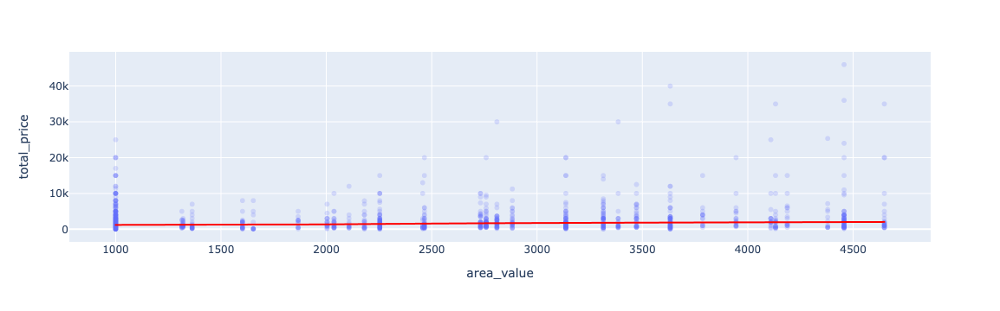

In [88]:
fig = px.scatter(min_spend, x = 'area_value', y = 'total_price', trendline = 'lowess', 
                  
                 trendline_color_override = 'red', opacity=0.2)
fig.show()

In [89]:
min_spend[['total_price', 'area_value']].corr()

,total_price,area_value
total_price,1.000000,0.193141
area_value,0.193141,1.000000


**Conclusion:**
- This is a disappointing result - we have a Pearson correlation of 0.19, slightly worse than the area_per_m2 variable which had Pearson of 0.2. 
- Looking at the scatter plot, you must zoom in a lot to see a gradient along the lowess line. It is there but it is not very significant.
- Each vertical line of points in the plot represents a single area averaged price (on x axis) i.e. this is one pixel from avg_geo and the spread along y axis shows the variation of prices within this pixel. There appears to be significant variation in pricing per pixel, which could mean that the prices are not strongly determined by location. It could also mean the pixels we have identified do a poor job of capturing price variation with location (perhaps they are too big or need a more tailored shape etc. 

**Possible improvements:**
- Use Median rather than mean when aggregating spaces together in raster plot.  
- Tuning the number of pixels for the model.
- Removing outlying values. 
- Using a different, more advanced method of regionalization / spatial correlation. 

### Tube Distance
Below we plot the scatter of tube_distance and total_price.  

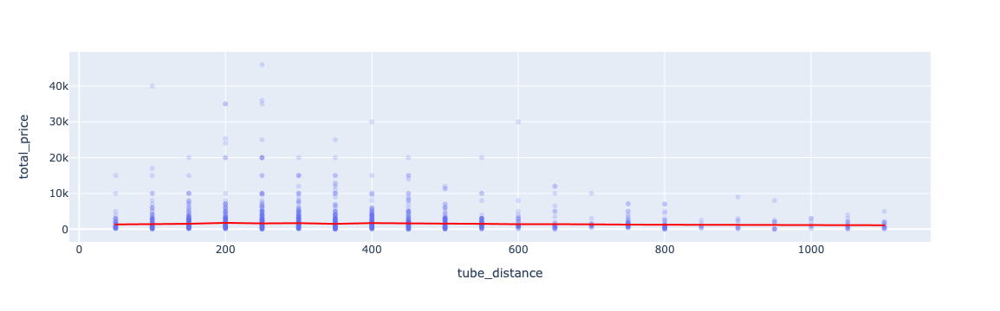

In [90]:
fig = px.scatter(min_spend, x = 'tube_distance', y = 'total_price', 
                     trendline = 'lowess',trendline_color_override = 'red',
                     opacity=0.2, trendline_options=dict(frac=0.2))

fig.show()

**Observations**: 
- Price does not significantly vary based on tube distance. 
- When you zoom in, you see the same trend as shown in the EDA reports above, that as tube distance increases the price increases slightly then plateaus and starts to decrease with tube distance. 
- This is somewhat un-intuitive. In general, we expected that a venue being closer to a tube station would increase its price (this is a typical behaviour in London for the house market).

### nearest_tube_station
There are a lot of different values for nearest_tube_station. To make this a useful value, we need to find ways to combine categories together to get fewer unique categories. Below we will show the value count of this column:  

In [91]:
station_counts = min_spend.nearest_tube_station.value_counts()
station_counts

Liverpool Street Station        79
Old Street Station              73
Piccadilly Circus Station       59
Farringdon Station              40
Tottenham Court Road Station    38
                                ..
Regent's Park Station            1
Denmark Hill Station             1
Pudding Mill Lane Station        1
Westminster Station              1
South Woodford Station           1
Name: nearest_tube_station, Length: 145, dtype: int64

We can see that for the majority of values there is a count of less than 10. These are not going to be very useful (they are averaged over too few observations and so are prone to over-fitting). We will filter on stattions with a count of 20 or more and see if this data would be a useful predictor:  

In [92]:
stations = [station for station, status in 
            zip(station_counts.index, (station_counts > 20)) if status]
stations

['Liverpool Street Station',
 'Old Street Station',
 'Piccadilly Circus Station',
 'Farringdon Station',
 'Tottenham Court Road Station',
 'Oxford Circus Station',
 "King's Cross St. Pancras Station",
 'Holborn Station',
 'Angel Station',
 'Leicester Square Station',
 'Green Park Station',
 'Bank Station',
 'Bond Street Station',
 'Monument Station',
 'Aldgate Station']

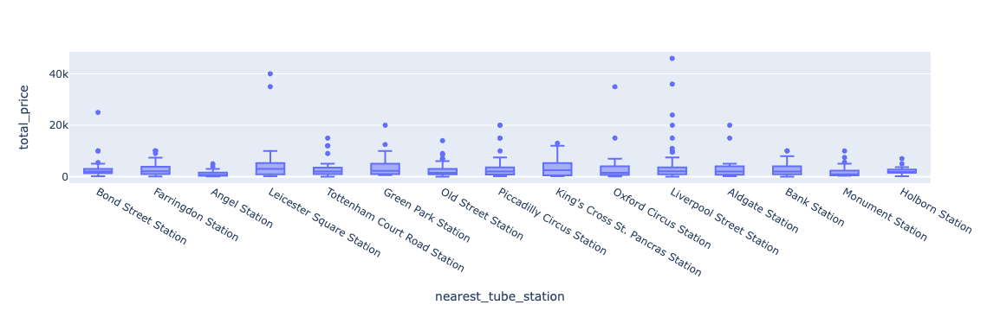

In [93]:
plot_data = min_spend[min_spend.nearest_tube_station.isin(stations)]

px.box(plot_data, x = 'nearest_tube_station', y = 'total_price')

**Observations:**
- The price distribution for each station looks quite similar. The price does not seem to vary strongly with tube station. 
- This, combined with the fact most stations have fewer than 20 observations means we do not think this is a useful variable for predicting price.  
### Checking time_period_desc_fixed Assumptions 
In the **price exploration** notebook, we decided to create the **min_spend** data by taking only minimum spend prices with a **time_period_desc_fixed** of 'per day' or 'per evening'. We made this decision because these time periods had similar shaped box plots and the other time periods ('per morning' and 'per afternoon') had slightly different box plots. 

Here, we wish to validate this assumption - we want to see if the 'per day' and 'per evening' prices do indeed appear to follow the same price trends and whether the 'per morning' and 'per afternoon' prices follow different ones and thus cannot be combined.

Below, we filter on just the 'min spend' prices in the all_prices data: 

In [94]:
all_min_spend = all_prices[all_prices.price_type == 'min. spend']
all_min_spend.head()

,space_url,time_period_desc_fixed,price_type,total_price,venue_url,venue_name,space_name,latitude,longitude,address,nearest_tube_station,tube_distance,max_seated,max_standing,max_seated_or_standing,min_area_per_person,area_in_m2,standing,dining,theatre,boardroom,classroom,cabaret,u_shaped,Dining_max,Theatre_max,Boardroom_max,Classroom_max,Cabaret_max,U-Shaped_max,supervenue,external_catering,in_house_kitchen,byo_alcohol,venue_provides_alcohol,alcohol_licence,extension_available,complimentary_water,complimentary_tea_and_coffee,Halal_menu,Kosher_menu,vegan_menu,gluten_free_menu,parking,Wi-Fi,Projector,Flipchart,Natural_light,Flatscreen_TV,Whiteboard,Conference_call_facilities,Air_conditioning,Storage_space,Accommodation_available,Own_music_allowed,Bring_your_own_DJ,PA_system_or_music_speakers_available,Wheelchair_accessible,Promoted_or_ticketed_events,Loud_music_or_events,Wedding_licence,Temporary_event_notices_(TENs)_available,Disabled_access_toilets,Ground_level,Lift_to_all_floors
0,https://www.tagvenue.com/rooms/bayswater/3064/...,Per day,min. spend,2500.0,https://www.tagvenue.com/venues/bayswater/1119...,queens skate dine bowl,the sinbin,51.510877,-0.187390,"17 Queensway, Bayswater, W24QP",Queensway Station,100.0,0,120,120,83.333333,10000.0,True,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,False,No External Catering,True,BYO alcohol not allowed,True,23:00,extension available,True,False,True,False,True,True,Paid Parking,True,False,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False
6,https://www.tagvenue.com/rooms/croydon/9082/mr...,Per evening,min. spend,500.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,the pink room,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,40,50,50,0.900000,45.0,True,True,False,False,False,False,True,40.0,0.0,0.0,0.0,0.0,30.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False
7,https://www.tagvenue.com/rooms/croydon/9082/mr...,Per morning,min. spend,500.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,the pink room,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,40,50,50,0.900000,45.0,True,True,False,False,False,False,True,40.0,0.0,0.0,0.0,0.0,30.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False
8,https://www.tagvenue.com/rooms/croydon/9083/mr...,Per morning,min. spend,500.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,the skylight,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,80,80,80,1.062500,85.0,True,True,True,True,True,True,False,60.0,60.0,40.0,60.0,80.0,0.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,True,True,True,False,False,False
9,https://www.tagvenue.com/rooms/croydon/9306/mr...,Per evening,min. spend,2000.0,https://www.tagvenue.com/venues/croydon/4422/m...,mr fox,whole venue,51.373377,-0.101337,"Surrey Street, 34, Croydon, CR0 1RJ",West Croydon Station,550.0,100,300,300,0.896667,269.0,True,True,True,False,True,False,False,100.0,50.0,0.0,100.0,0.0,0.0,False,No External Catering,True,BYO alcohol not allowed,True,3:00,extension available,True,False,False,False,False,False,Paid Parking,True,True,False,True,False,False,False,True,False,False,False,False,False,False,False,True,True,True,False,True,False


The **all_min_spend** data has all minimum spend prices for all **time_period_desc_fixed** available. Note that the same space url (and therefore the same space) sometimes has multiple prices for different time period descriptions e.g. a space may have a 'per evening' price and a 'per morning' price. 

Below, we plot the scatter of **total_price** against **max_seated_or_standing**, where we have made a separate plot per **time_period_desc_fixed**. A lowess line has been fitted to try and convey the trend.

In our previous exploring, we found the max_seated_or_standing variable has the strongest correlation with **total_price** and therefore it would be interesting to see if different time periods show different price relationships: 

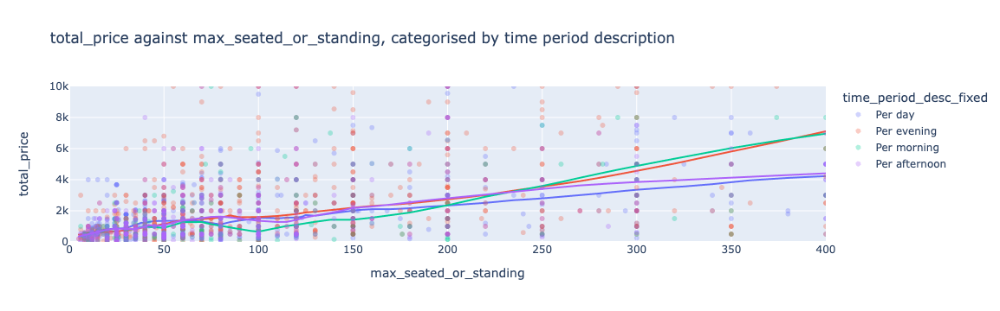

In [95]:
px.scatter(all_min_spend, y = 'total_price', x = 'max_seated_or_standing', 
           opacity = 0.3, color = 'time_period_desc_fixed', 
           trendline = 'lowess', trendline_options=dict(frac=0.2), 
           range_x=(0, 400), range_y=(0, 10000), 
          title = 'total_price against max_seated_or_standing, categorised by time period description')

**Observations**: 
- Broadly, the different time period descriptions show a similar approx linear trend of price against max_seated_or_standing. 
- Around a venue capacity of about 100 the 'per morning' prices seem to drop noticeably when the others do not. 
- For larger venue capacities (more than. 250) Per evening and per morning split from per afternoon and per day. This may be due to their being fewer observations for higher venue sizes and thus we are seeing some over-fitting affects.  


In conclusion, we think it may be worth combining the 'per afternoon' data with the per day and per evening data to see if it improves the model.   

## Modelling
### Defining Datasets
Several times during this project we have wondered how to deal with situations where the same space has multiple prices for different time periods. How should we deal with this in modelling? We have decided to test 3 different options: 

- **Raw Data** - We will take all minimum spend prices (including multiple rows of the same space with a different price for different time periods). We expect this to perform poorly because the data will over-train on spaces that have multiple rows. 
- **Minimum Price Data** - We will take all minimum spend prices and will select only the minimum price for each space (regardless of time period). This means each space will only appear once in the data. Our justification for taking the minimum price is that it is likely that a space with only a single price will be showing the minimum price to be competitive and attract customers. We expect this data to perform best. 
- **Per Evening Only** - Perhaps we should model the prices for each time period separately. This will reduce the overall number of observations used in training but may fit the data better if there are separate trends for different time periods. We will test this by training using only the **per evening** time period prices (which have the most observations ~1000). 

### Final Pre-Processing
Before we create our train test splits, we need to apply some minor re-formatting to the data so its ready for modelling. 

Below, we update the categorical columns (like 'wifi') to be in binary (i.e. 1 or 0) rather than bool (True / False).  

In [96]:
cat_cols = all_min_spend.loc[:,'Wi-Fi':].columns.to_list()
fixed_cat_cols = all_min_spend[cat_cols].applymap(lambda x: int(x))
all_min_spend.loc[:,cat_cols] = fixed_cat_cols.values

/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/pandas/core/indexing.py:1835: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Train Test Split
Below we build the training and test sets for each of the 3 datasets defined above. 

**Note** - below we split the all_min_spend prices into an approximately 70 - 30 train test split. We need to be careful of data leakage, we dont want any spaces in the test data to be in the training data and as noted before we know the same space has multiple rows in some cases. We also know that the same venue may have multiple spaces and this could also cause data leakage. We will use a Group train test split class from Sklearn to perform train test split whilst preserving groupings. There is no simple class for splitting data that also uses groups in Sklearn so we have adapted one of the Cross Validation classes which does have this functionality below:    

In [97]:
splitter = GroupShuffleSplit(test_size=.30, n_splits=3, random_state = 7)
split = splitter.split(all_min_spend, groups=all_min_spend['venue_url'])
train_inds, test_inds = next(split)

train_raw = all_min_spend.iloc[train_inds]
test_raw = all_min_spend.iloc[test_inds]

Below we print size of train and test split for raw data: 

In [98]:
train_raw_size = train_raw.shape[0]
test_raw_size = test_raw.shape[0]

print(train_raw_size, test_raw_size, 
      (test_raw_size / (train_raw_size + test_raw_size)))

1781 799 0.30968992248062016


We perform a test to confirm that no **space urls** in the test set are found in the training set (no data leakage): 

In [99]:
test_urls = test_raw.space_url.unique()
# Note we use tilda to reverse all False i.e. url not found to all True
all(~train_raw.space_url.isin(test_urls))

True

We perform a test to confirm that no **venue urls** in the test set are found in the training set (no data leakage): 

In [100]:
test_urls = test_raw.venue_url.unique()
# Note we use tilda to reverse all False i.e. url not found to all True
all(~train_raw.venue_url.isin(test_urls))

True

Now we create minimum price dataset: 

In [101]:
# Find min price per space 
min_train_price = train_raw.groupby('space_url')['total_price'].transform('min')
train_min = train_raw.copy()
# replace price data (that may vary on different rows) with minimum price per space
train_min['total_price'] = min_train_price
train_min.drop_duplicates('space_url', inplace= True)

train_size = train_min.shape[0]

In [102]:
# Find min price per space 
min_test_price = test_raw.groupby('space_url')['total_price'].transform('min')
test_min = test_raw.copy()
# replace price data (that may vary on different rows) with minimum price per space
test_min['total_price'] = min_test_price
test_min.drop_duplicates('space_url', inplace= True)

test_size = test_min.shape[0]

Below we print out the size of train and test split for minimum price data: 

In [103]:
print(train_size, test_size, test_size/(test_size+train_size))

1227 535 0.3036322360953462


Finally, we build the 'per evening' only datasets: 

In [104]:
train_evening = train_raw.copy()
train_evening = train_evening[train_evening.time_period_desc_fixed == 'Per evening']

test_evening = test_raw.copy()
test_evening = test_evening[test_evening.time_period_desc_fixed == 'Per evening']

In [105]:
train_size = train_evening.shape[0]
test_size = test_evening.shape[0]

print(train_size, test_size, test_size/(test_size+train_size))

711 336 0.3209169054441261


**conclusion** - We have built our 3 different train test sets and for each we have an approximately 70 - 30 train test split. 

### Remove Training Outliers
During exploration, we saw some massive total_price outliers and we would like to remove them from the training data. We will drop from training anything with a total price over £10,000. We assume that these massive price outliers are probably for large stadiums and huge event spaces which do not reflect the pricing trends of smaller venues:

In [106]:
price_outliers_raw = train_raw[train_raw.total_price > 10000].index
train_raw.drop(price_outliers_raw, inplace = True)

price_outliers_min = train_min[train_min.total_price > 10000].index
train_min.drop(price_outliers_min, inplace = True)

price_outliers_evening = train_evening[train_evening.total_price > 10000].index
train_evening.drop(price_outliers_evening, inplace = True)

/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Simple OLS Model
We will start by building a simple OLS model that only uses the variables that we identified as being useful predictors for price. The variables we will use and pre-processing options we will test are detailed below: 

- Variables to use: 
  - max_seated_or_standing
  - area_in_m2
  - area_value (created from latitude and longitude info)
  - Categorical variables e.g. 'vegan menu' 
- Pre-processing to test: 
  - Does PCA make the categorical variables useful? 
  - Should we bother including area_in_m2 in model?
  - Should we bother using area_value in model? Can we tune this to get better results?
  
#### Create Custom Transformers
We need to create some custom transformers. 

The first transgformer is to re-create the geographic based pricing - this means taking latitude and longitude values and returning an averaged price for that area. Below we define a class that inherits the BaseEstimator and TransformerMixin classes to create our geo_price transformer. This transformer allows you to define whether to use median or mean to aggregate prices, what the minimum number of venues per square is required for an average to be taken and the number of horizontal grids we will use (this defines the size of the grids). The fit method uses aggregates the values per square and calculates the average value of the points in squares with too few points to aggregate. The transform method matches provided latitude and longitude values to the averaged prices in their area.  

In [107]:
class geo_price(BaseEstimator, TransformerMixin):
    '''
    Transformer that returns typical area price of latitude longitude coord. 

    Args:
        min_count (int): Defines minimum number of spaces per square to 
            aggregate prices within the square. If a square has fewer than 
            this number of venues, then an average value across all such 
            venues is provided for that square. 
        agg_func (string): Set as 'median' to aggregate using median or 
            set as 'mean' to aggregate using mean. 
        n_grids (int): The number of horizontal squares the whole area is 
            divided into. A larger number means smaller squares with fewer 
            points in each. 

    '''
    def __init__(self, min_count = 10, agg_func = 'mean', n_grids = 67):
        # save the features list internally in the class
        self.min_count = min_count
        self.agg_func = agg_func 
        self.n_grids = n_grids
        self.grid = np.nan
        self.low_count_price = np.nan
    # Fit method, expects X to be 'latitude' and 'longitude' columns    
    def fit(self, X, y):
        data = X
        data['price'] = y
        # Convert dataframe to geo pandas dataframe 
        space_gdf = geopandas.GeoDataFrame(data, 
                                           geometry=geopandas.points_from_xy(
                                               data.longitude, 
                                               data.latitude),
                                           crs="WGS84")
        # Get bounds of grid area
        xmin, ymin, xmax, ymax = space_gdf.total_bounds
        # Number of grid cells horizontally 
        num_cells_hor = self.n_grids
        # grid Cell width
        width = (xmax - xmin) / num_cells_hor
        # Calculate vertical number of cells (based on cell width)
        num_cells_vert = (ymax - ymin) / width
        # Round up
        num_cells_vert = math.ceil(num_cells_vert)
        
        y0 = ymax
        grids = []
        # Create grid of boxes around entire area
        for y_pos in range(num_cells_vert):
            x0 = xmin
            y0 = y0 - width
            for x_pos in range(num_cells_hor):
                x1 = x0 + width
                y1 = y0 - width

                grid = shapely.geometry.box(x0, y1, x1, y0)
                grids.append(grid)

                x0 = x0 + width     
        # Convert grid og box polygons to a geo pandas dataframe
        grid = geopandas.GeoDataFrame(geometry=grids, crs='WGS84')
        # Merge grid with data to assign each observation to a single grid cell
        merged = geopandas.sjoin(space_gdf, grid, 
                                 how='left', predicate='within')
        
        # Group price by the grid cell group
        group_by_grid = merged.groupby('index_right')['price']
        
        count_per_grid = group_by_grid.transform('count')
        agg_price_per_grid = group_by_grid.transform(self.agg_func)
        
        merged['agg_price'] = agg_price_per_grid
        merged['count'] = count_per_grid
        
        below_count_bool = merged['count'] <=self.min_count
        below_count_rows = merged[below_count_bool]
        # calculate aggregation of all points that are ina grid cell with fewer 
        # than the min_count points 
        self.low_count_price = below_count_rows.agg(self.agg_func)['agg_price']
        
        merged = merged.drop(below_count_rows.index)
        # Get unique aggregated price per grid cell (except for those with a 
        # count less than min_count, they were dropped above)
        price_per_grid = merged[['index_right', 'agg_price']].drop_duplicates()
        price_per_grid = price_per_grid.dropna(axis = 'rows', subset=['agg_price'])
        grid.loc[price_per_grid.index_right.astype(int), 'agg_price'] = price_per_grid.agg_price.values

        self.grid = grid
        return self
    def transform(self, X, y = None):
        
        space_gdf = geopandas.GeoDataFrame(X, 
                                           geometry=geopandas.points_from_xy(
                                               X.longitude, 
                                               X.latitude),
                                           crs="WGS84")
        
        merged = geopandas.sjoin(space_gdf, self.grid, 
                                 how='left', predicate='within')
        
        merged = merged.fillna(self.low_count_price)
        
        # return the dataframe with the specified features
        return merged[['agg_price']]
    def get_feature_names_out(self, names):
        return ['agg_price']

Below we test using our transformer: 

<ipython-input-107-6413fdb784b6>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



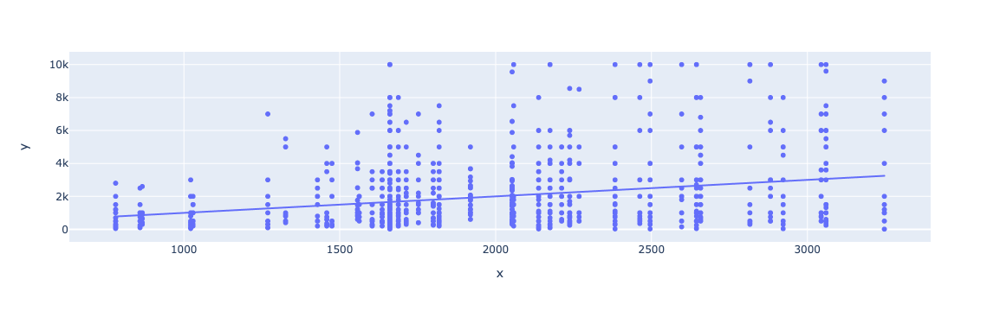

In [108]:
geo = geo_price(agg_func='mean', n_grids=70, min_count = 11)


geo.fit(train_raw[['latitude', 'longitude']], train_raw['total_price'])

test = geo.transform(train_raw[['latitude', 'longitude']], train_raw['total_price'])

px.scatter(x = test['agg_price'], y = train_raw['total_price'], trendline='ols')

The second transformer we want to make is a simple function that accepts a dataframe and applies simple transforms like square, log and square root to specific columns so we can experiment with applying these transforms. We will use the Sklearn FunctionTransformer to convert this into an Sklearn transformer. 

In [109]:
def simple_trans(X, transforms={}):
    """Applies simply transforms to specified columns of dataframe.
    
    args: 
        X (dataframe): The dataframe you wish to transform. 
        transforms (dictionary): Keys define the transform you wish to apply
            and values is a list of column names to apply transform to. If a 
            column is not assigned a specific transform, it will be 
            returned unchanged. 
            
            The followisng tranforms are available: 
                'log' - applies log transform
                'square' - squares column values
                'sqrt' - square root of column values. 
                
            e.g. {'log': ['colA', 'colB'], 'square': ['colC']}
            
            A column name must not appear twice. If a named column is not present 
            in X, it will not raise an error and will be ignored.
            
    Returns:
        (dataframe): X dataframe with transforms applied to specified columns.
    """
    # Flattened list of all columns named in transforms
    all_named_columns = [column 
                         for columns in transforms.values() 
                         for column in columns]
    # Raise error if column name appears twice in transforms 
    if len(all_named_columns) != len(set(all_named_columns)):
        raise ValueError('column name appears multiple times in transforms dictionary')

    functions = {'log':np.log, 
                 'square':np.square, 
                 'sqrt':np.sqrt}
    
    data_cols = set(X.columns)
    # Apply each transform in functions to specified list of columns
    for function, columns in transforms.items():
        columns = set(columns)
        # remove column names that do not exist in X
        columns = list(columns.intersection(data_cols))
        func = functions[function]

        X.loc[:, columns] = func(X[columns])

    return X

Below we test the transformer: 

In [110]:
X = train_raw[['max_standing', 'max_seated_or_standing','area_in_m2', 'total_price']]   

transforms = {'sqrt':['max_standing', 'area_in_m2'],
              'square':['max_seated_or_standing']} 

simple_trans(X, transforms)

/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/pandas/core/indexing.py:1884: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,max_standing,max_seated_or_standing,area_in_m2,total_price
0,10.954451,14400,100.000000,2500.0
6,7.071068,2500,6.708204,500.0
7,7.071068,2500,6.708204,500.0
8,8.944272,6400,9.219544,500.0
9,17.320508,90000,16.401219,2000.0
...,...,...,...,...
5185,5.477226,900,5.477226,300.0
5186,12.247449,22500,NaN,2500.0
5187,10.000000,10000,NaN,500.0
5191,10.000000,10000,8.366600,1000.0


The final transformer is a column selector transformer i.e. to choose what columns to use: 

In [111]:
def select_columns(X, columns=[]):
    if columns == []:
        return None
    return X[columns]

select_columns(train_raw, ['total_price', 'max_seated_or_standing'])
select_columns(train_raw)

#### Create Pipeline
We will now create the pipeline that will be optimised via a grid search. Below we define some column selections and paramaters that will be used in the pipeline and grid search: 

In [651]:
cat_cols = train_raw.loc[:,'Wi-Fi':].columns.to_list()

num_cols_A = ['max_seated_or_standing', 'area_in_m2']
num_cols_B = ['max_seated_or_standing']

coord_cols = ['latitude', 'longitude']

transforms_A = {'sqrt':['max_seated_or_standing']}

Our custom transformers up Pandas dataframe functionality like accessing and using column names, so we need to set sklearn to use pandas rather than numpy arrays when transforming data: 

In [652]:
set_config(transform_output = "pandas")

Below, we use a ColumnTransformer to separately transform the Geographic (lat and long), Numerical and Categorical columns. 

The different pipelines for each type of variable are detailed below:
- **Numerical** - Select Columns -> Median Imputation -> Simple Transform of Specified columns 
- **Categorical** - PCA
- **Geo** - Get Local Area Price -> Log price

Our Pipeline ends with an OLS regressor. 

In [653]:
num_transformer = Pipeline(
    steps=[('select_cols', FunctionTransformer(select_columns, 
                                               kw_args={'columns':num_cols_A})),
           ('impute', SimpleImputer(strategy='median')), 
           ('simple_trans', FunctionTransformer(simple_trans))])

cat_transformer = Pipeline(steps=[('PCA', PCA(3))])

geo_transformer = Pipeline(steps=[('geo_price', geo_price()), 
                                  ('log', FunctionTransformer(np.log))])

preprocessor = ColumnTransformer(
    transformers=[('num', num_transformer, num_cols_A), 
                  ('cat', cat_transformer, cat_cols),
                  ('geo', geo_transformer, coord_cols)],
    verbose_feature_names_out = False)

pipe_ols = Pipeline(steps=[('preprocessor', preprocessor), 
                           ('regressor', LinearRegression())])

We now fit and transform our data to check our Pipeline works: 

In [654]:
pipe_ols[:-1].fit_transform(train_raw, train_raw['total_price'])

,max_seated_or_standing,area_in_m2,pca0,pca1,pca2,agg_price
0,120.0,10000.0,-0.798813,0.500727,-0.233555,7.389850
6,50.0,45.0,-1.076436,0.090256,-0.069607,7.389850
7,50.0,45.0,-1.076436,0.090256,-0.069607,7.389850
8,80.0,85.0,-0.938378,0.165684,-0.155681,7.389850
9,300.0,269.0,-0.571421,0.225169,-0.107061,7.389850
...,...,...,...,...,...,...
5185,30.0,30.0,0.178511,0.164638,-0.089285,7.389850
5186,150.0,72.5,-0.421258,0.073235,-0.458462,7.950679
5187,100.0,72.5,0.113333,-0.482263,0.010944,7.389850
5191,100.0,70.0,-0.095551,0.331711,-0.438860,7.389850


#### Parameter Grid Search
We will use gridsearchCV to tune our OLS model. We will vary the following parameters and find the best performing model: 

**Numerical Column Parameters:**
- Use just 'max_seated_or_standing' **or** use both 'max_seated_or_standing' and 'area_in_m2'
- Square root the 'max_seated_or_standing' column

**Categorical Parameterss**
- Use PCA (taking no components **or** taking 1, 2 or 3 components)

**Geographical Parameters:**
  - Using 'mean' or 'median' in aggregation
  - Varying the minimum count of spaces in a square to find local aggregation (varied between 10, 11 and 12)
  - Varying the size of the squares by setting the horizontal number of squares (varied between 65, 67 and 69)
  - Take log of geographic price **or** not
  - Removing the geographical variable altogether
  
Below we define the gridsearch CV, including: 
- Using 5 CV splits 
- Using Group K fold for the splits - as with the train test split, we will need to ensure spaces with the same venue url are not across splits to avoid data leakage. 
- Score using R2 and Mean Absolute Error (MAE) 
- Rank estimators by Mean Absolute Error (MAE) - **Note** We chose to use MAE to score and rank our models because our data has quite large outliers and we are not particularly confident in the quality of the data. As such, we want our models to aim to minimise the typical error and not to focus on outliers. An alternative is Root Mean Squared Error scores which put more emphasis on fitting outliers well.  

In [655]:
kw_args_A = {'columns':num_cols_A}
kw_args_B = {'columns':num_cols_B}

# Note, we use the list of dictionaries to remove the geo transformer 
# section using 'drop' whilst performing the same parameter search as before 
parameters = [{'preprocessor__num__select_cols__kw_args':[kw_args_A, kw_args_B],
               'preprocessor__num__simple_trans__kw_args': [None, {'transforms':transforms_A}],
               'preprocessor__cat__PCA':[PCA(0), PCA(1),PCA(2),PCA(3), PCA(6), PCA(9)],
               'preprocessor__geo__geo_price__agg_func': ['median','mean'],
               'preprocessor__geo__geo_price__min_count': [10,11,12],
               'preprocessor__geo__geo_price__n_grids':[65, 67, 69],
               'preprocessor__geo__log':['passthrough', FunctionTransformer(np.log)]},
              {'preprocessor__num__select_cols__kw_args':[kw_args_A, kw_args_B],
               'preprocessor__num__simple_trans__kw_args': [None, {'transforms':transforms_A}],
               'preprocessor__cat__PCA':[PCA(0), PCA(1),PCA(2),PCA(3), PCA(6), PCA(9)],
               'preprocessor__geo':['drop']}]

gkf=GroupKFold(n_splits=5)

ols = GridSearchCV(pipe_ols, parameters, 
                   scoring = ['r2', 'neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

We prepare the 3 datasets for training by separating into X (predictors) and y (target) datasets. We will label the different dataset defined above using a, b and c as defined below: 

- **(a) train_raw** -> X_a, y_a
- **(b) train_min** -> X_b, y_b
- **(c) train_evening** -> X_c, y_c

In [656]:
# Ignore future deprecation warnings from Pandas
warnings.filterwarnings('ignore', category=FutureWarning)

X_a = train_raw.loc[:,train_raw.columns != 'total_price']
y_a = train_raw.total_price

X_b = train_min.loc[:,train_min.columns != 'total_price']
y_b = train_min.total_price

X_c = train_evening.loc[:,train_evening.columns != 'total_price']
y_c = train_evening.total_price

In [657]:
pd.set_option('display.max_columns', None)

We now run the GridSearchCV for each of the 3 datasets (a, b and c) and store the results: 

In [658]:
ols.fit(X_a, y_a, groups = X_a['venue_url'])
results_a = pd.DataFrame(ols.cv_results_)

Fitting 5 folds for each of 888 candidates, totalling 4440 fits


In [659]:
ols.fit(X_b, y_b, groups = X_b['venue_url'])
results_b = pd.DataFrame(ols.cv_results_)

Fitting 5 folds for each of 888 candidates, totalling 4440 fits


In [660]:
ols.fit(X_c, y_c, groups = X_c['venue_url'])
results_c = pd.DataFrame(ols.cv_results_)

Fitting 5 folds for each of 888 candidates, totalling 4440 fits


We will now preview the top 5 parameter configurations for each dataset: 

In [836]:
plot_data_a = results_a.sort_values('rank_test_neg_mean_absolute_error')
plot_data_a.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__geo__log,param_preprocessor__num__select_cols__kw_args,param_preprocessor__num__simple_trans__kw_args,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
887,0.007103,0.000306,0.003182,0.000149,PCA(n_components=9),NaN,NaN,NaN,NaN,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,drop,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.188249,0.347556,0.114839,0.309404,0.283913,0.248792,0.085171,1,-1126.180492,-1121.662818,-1112.928409,-1304.729503,-1210.426050,-1175.185454,73.709780,1
771,0.466614,0.022004,0.175514,0.015321,PCA(n_components=9),median,12,65,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.213094,0.355109,0.056633,0.294233,0.290282,0.241870,0.103004,3,-1100.923960,-1118.559812,-1161.556626,-1302.834053,-1197.814846,-1176.337859,71.702987,2
747,0.478783,0.020052,0.167488,0.019163,PCA(n_components=9),median,11,65,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.192706,0.354472,0.063596,0.293896,0.290450,0.239024,0.101886,7,-1101.885144,-1120.133452,-1164.219405,-1304.128176,-1197.916140,-1177.656463,71.604878,3
885,0.007633,0.000413,0.003593,0.000432,PCA(n_components=9),NaN,NaN,NaN,NaN,"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,drop,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.187123,0.347143,0.114833,0.301435,0.283910,0.246889,0.084152,2,-1127.754599,-1121.883233,-1112.924713,-1316.325253,-1210.412798,-1177.860119,77.579446,4
723,0.456169,0.035731,0.172493,0.017553,PCA(n_components=9),median,10,65,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.189139,0.354397,0.063436,0.292375,0.290691,0.238008,0.102119,12,-1101.370686,-1120.217926,-1163.863023,-1306.838187,-1198.044747,-1178.066914,72.679738,5


In [837]:
plot_data_b = results_b.sort_values('rank_test_neg_mean_absolute_error')
plot_data_b.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__geo__log,param_preprocessor__num__select_cols__kw_args,param_preprocessor__num__simple_trans__kw_args,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
749,0.426931,0.022869,0.152185,0.015428,PCA(n_components=9),median,11,65,FunctionTransformer(func=<ufunc 'log'>),"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.196172,0.284525,0.310700,0.363700,0.296692,0.290358,0.054292,10,-1045.185060,-1183.310546,-1136.907323,-1007.050550,-1027.339520,-1079.958600,68.144453,1
751,0.415912,0.033558,0.157121,0.013606,PCA(n_components=9),median,11,65,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.195442,0.284085,0.310993,0.366400,0.298076,0.290999,0.055343,8,-1046.123777,-1184.356913,-1137.982576,-1004.494697,-1027.522688,-1080.096130,69.072159,2
745,0.416195,0.029581,0.160895,0.017296,PCA(n_components=9),median,11,65,passthrough,"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.195001,0.283817,0.310385,0.362968,0.294017,0.289237,0.054436,12,-1043.867608,-1184.277134,-1138.260154,-1007.381592,-1027.822701,-1080.321838,68.656976,3
725,0.409560,0.023796,0.173733,0.025288,PCA(n_components=9),median,10,65,FunctionTransformer(func=<ufunc 'log'>),"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.212204,0.284425,0.310057,0.365536,0.296728,0.293790,0.049325,3,-1051.064807,-1183.428690,-1137.441911,-1002.527326,-1027.281847,-1080.348916,68.723973,4
747,0.411994,0.024829,0.156828,0.009542,PCA(n_components=9),median,11,65,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.194411,0.283251,0.310644,0.365814,0.295798,0.289984,0.055480,11,-1044.676200,-1185.499984,-1139.283688,-1004.758774,-1027.769634,-1080.397656,69.686492,5


In [838]:
plot_data_c = results_c.sort_values('rank_test_neg_mean_absolute_error')
plot_data_c.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__geo__log,param_preprocessor__num__select_cols__kw_args,param_preprocessor__num__simple_trans__kw_args,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
447,0.452011,0.022362,0.186923,0.013646,PCA(n_components=3),median,10,67,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.153869,0.125563,0.288706,0.338982,0.149026,0.211229,0.085815,24,-1160.519275,-1258.999480,-1108.667510,-1392.743543,-1393.028322,-1262.791626,116.685351,1
445,0.427878,0.031661,0.178169,0.012678,PCA(n_components=3),median,10,67,FunctionTransformer(func=<ufunc 'log'>),"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.154210,0.123687,0.289331,0.336249,0.149249,0.210545,0.085421,33,-1160.943371,-1259.675240,-1107.172924,-1396.890966,-1392.663743,-1263.469249,117.853352,2
443,0.423424,0.031053,0.168537,0.012795,PCA(n_components=3),median,10,67,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.146298,0.139657,0.287854,0.336243,0.144807,0.210972,0.083964,26,-1168.626969,-1253.523791,-1106.857651,-1393.415623,-1397.614824,-1264.007772,117.047690,3
441,0.430392,0.014196,0.178877,0.011440,PCA(n_components=3),median,10,67,passthrough,"{'columns': ['max_seated_or_standing', 'area_i...",{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.146774,0.137968,0.288257,0.333144,0.144963,0.210221,0.083312,38,-1169.138027,-1254.456284,-1105.778250,-1397.856620,-1397.401822,-1264.926201,118.180667,4
467,0.450866,0.040645,0.177959,0.017162,PCA(n_components=3),median,11,67,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.159885,0.126469,0.286250,0.337568,0.166897,0.215414,0.081594,13,-1168.344140,-1260.157488,-1106.220933,-1399.992625,-1402.599573,-1267.462952,119.752176,5


We will now visualise the results of the GridsearchCV to understand the best performing models and to identify the best dataset. 

Firstly, we will combine the 3 different results data into a single dataframe so we can easily plot all the data together:  

In [839]:
# Add new 'data' column to record which dataset each line of data comes 
# from after it is merged
plot_data_a['data'] = 'a'
plot_data_b['data'] = 'b'
plot_data_c['data'] = 'c'
# define columns we will combine (only taking MSE, data columns and rank column) 
cols = ['data', 'split0_test_neg_mean_absolute_error', 'split1_test_neg_mean_absolute_error',
        'split2_test_neg_mean_absolute_error', 'split3_test_neg_mean_absolute_error', 
        'split4_test_neg_mean_absolute_error', 'rank_test_neg_mean_absolute_error']

plot_data = pd.concat([plot_data_a[cols], plot_data_b[cols], plot_data_c[cols]])

plot_data

,data,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
887,a,-1126.180492,-1121.662818,-1112.928409,-1304.729503,-1210.426050,1
771,a,-1100.923960,-1118.559812,-1161.556626,-1302.834053,-1197.814846,2
747,a,-1101.885144,-1120.133452,-1164.219405,-1304.128176,-1197.916140,3
885,a,-1127.754599,-1121.883233,-1112.924713,-1316.325253,-1210.412798,4
723,a,-1101.370686,-1120.217926,-1163.863023,-1306.838187,-1198.044747,5
...,...,...,...,...,...,...,...
216,c,-1217.465857,-1373.675110,-1236.535303,-1504.565347,-1495.740862,884
268,c,-1214.637972,-1385.880665,-1217.528480,-1532.325134,-1478.944186,885
220,c,-1209.738799,-1381.584036,-1232.815738,-1508.546582,-1497.526069,886
174,c,-1221.284238,-1380.632757,-1235.269988,-1518.593013,-1476.332011,887


We need to unpivot the MAE columns for plotting with pandas: 

In [840]:
plot_data = plot_data.melt(id_vars=['data', 'rank_test_neg_mean_absolute_error'])
plot_data

,data,rank_test_neg_mean_absolute_error,variable,value
0,a,1,split0_test_neg_mean_absolute_error,-1126.180492
1,a,2,split0_test_neg_mean_absolute_error,-1100.923960
2,a,3,split0_test_neg_mean_absolute_error,-1101.885144
3,a,4,split0_test_neg_mean_absolute_error,-1127.754599
4,a,5,split0_test_neg_mean_absolute_error,-1101.370686
...,...,...,...,...
13315,c,884,split4_test_neg_mean_absolute_error,-1495.740862
13316,c,885,split4_test_neg_mean_absolute_error,-1478.944186
13317,c,886,split4_test_neg_mean_absolute_error,-1497.526069
13318,c,887,split4_test_neg_mean_absolute_error,-1476.332011


Below, we create a box plot for each of the 3 datsets (a, b and c). Each box plot shows the distribution of the MAE for all 5 folds of every parameter configuration tested. This allows us to see how well each dataset performs across thousands of models, giving us a good measure of how good each dataset is for modelling:

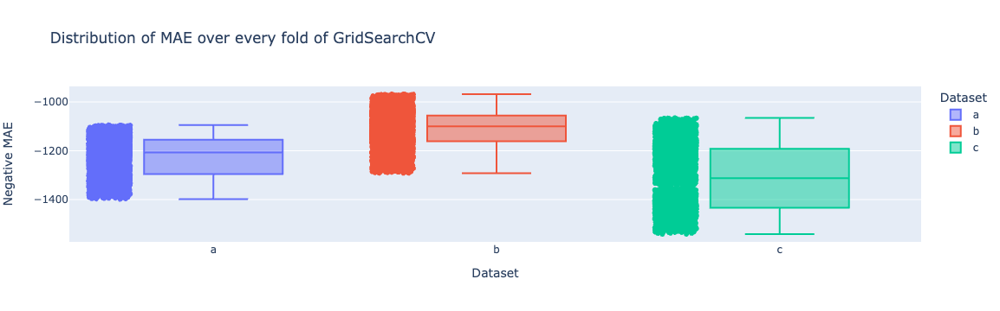

In [843]:
px.box(plot_data, y = 'value',  x = 'data', color = 'data', points='all', 
       labels = {'data':'Dataset', 'value': 'Negative MAE'}, 
       title = 'Distribution of MAE over every fold of GridSearchCV ')

**Observations:**
- Note, the plot shows **negative** MAE so a larger, closer to 0 value on the plot is a smaller MAE score. 
- Dataset **b** is the best performing dataset. Its best MAE scores (highest on plot) are lower than the other 2 datasets best scores and its worst scores (lowest on plot) are not as bad as the other datasets worst scores. Its median and Upper and Lower quartiles sit above the other 2 datasets - it consistently performs better than the other 2 datasets most of the time. 
- This suggests that our assumption was correct and taking the lowest price when a space offers multiple prices for different time periods was a good way to remove these semi-duplicates and make the data more consistent i.e. always predicting for lowest price. We will use this dataset (b) going forwards for all other models.
- Dataset **a** is the next best dataset. It sits a bit lower on the plot than dataset **b** and thus performs worse but with a similar spread. We suspect it performs worse due to overfitting from duplicated prices when the same space has multiple prices for different time periods. It is a relatively small drop in performance. 
- Dataset **c** is the worst performing. It has a much larger spread than the other datasets, suggesting that certain CV folds or parameter configurations result in a big drop in MAE. This may be due to overfitting from there being much less data available when we accepted only 'per evening' time period prices. Interestingly, the best MAE scores for this dataset are slightly better than the best scores for dataset **a**. 

We now want to visualise the GridsearchCV results for the top 5 performing configurations of each dataset. Below we plot the distribution of MAE values over the 5 cross validation folds for the top 5 models:   

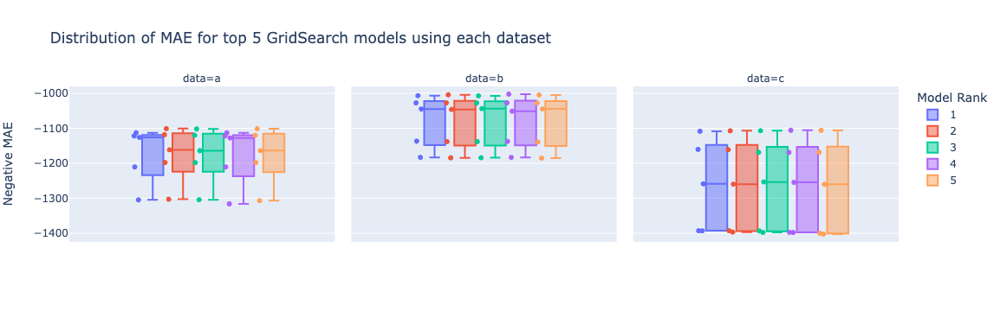

In [844]:
px.box(plot_data[plot_data.rank_test_neg_mean_absolute_error < 6], y = 'value',
       facet_col = 'data',
       color = 'rank_test_neg_mean_absolute_error',
       points='all', labels = {'rank_test_neg_mean_absolute_error':'Model Rank', 
                              'value':'Negative MAE'},
      title = 'Distribution of MAE for top 5 GridSearch models using each dataset')

**Observations:**
- Reflecting our conclusions about the 3 datasets above, we see that dataset **b** has the best performing models, with better MSE values across the 5 folds than the other 2 datasets. 
- Within each dataset, we can see very little variation in MSE between the top 5 models. This suggests the differences in Model Parameter Configurations between these models has basically no effect, and they differ in random chance more than anything else. 
- The dataset **c** models show wide variation, suggesting a tendency to overfit and thus poorer generalisation. 

**Dataset b Optimal Parameters**

We will now assess the parameter configurations of the top 5 models for dataset **b** (by looking at the GridSearchCV results dataframe for dataset b displayed above) to see what conclusions we can draw: 
- The models always use 3 PCA components of the categorical variables 
- The Geographic Price aggregation is always used and typically uses median for aggregation, 65 for number of horizontal grids and 10 for minimum price count. 
- The log of the geographical price appears 3 out of 5 times suggesting it may not make much difference. 
- The same is true for taking both 'max_seated_or_standing' and 'area_in_m2'. It likely makes little difference.
- 'max_seated_or_standing' is always square rooted.

**Model Performance** 
- The best models using dataset **b** have a mean MAE over the 5 folds of about **£1080** with a standard deviation of about **£68**. 
- The median price in the training data for dataset **b** is £1000 and thus the typical error is larger than the typical price! This is not a good model! 
- We suspect that the venue space pricing data from tagvenue.com is not good quality for modelling. We are not confident the prices quoted are accurate (they may be inflated or smaller than they should be to entice customers). The prices may not be of consistent types e.g. some may be minimum price, some may be maximum, some may be typical, and thus different types of prices will not predict each other well.
- Other types of model e.g. KNN may predict the prices better than OLS. 

#### Residuals Analysis
We will now review the residuals of our best OLS model using dataset **b** to identify potential outliers and to see how well the OLS model is fitting the data. We will start by getting the best performing parameter settings from **results_b**: 

In [668]:
best_params = results_b.loc[results_b.rank_test_neg_mean_absolute_error == 1,
                            'params'].values[0]

best_params

{'preprocessor__cat__PCA': PCA(n_components=9),
 'preprocessor__geo__geo_price__agg_func': 'median',
 'preprocessor__geo__geo_price__min_count': 11,
 'preprocessor__geo__geo_price__n_grids': 65,
 'preprocessor__geo__log': FunctionTransformer(func=<ufunc 'log'>),
 'preprocessor__num__select_cols__kw_args': {'columns': ['max_seated_or_standing',
   'area_in_m2']},
 'preprocessor__num__simple_trans__kw_args': {'transforms': {'sqrt': ['max_seated_or_standing']}}}

We will now update our pipeline OLS model to use the best parameters we identified: 

In [669]:
pipe_ols.set_params(**best_params)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated_or_standing',
                                                                                                            'area_in_m2']})),
                                                                  ('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_trans',
                                                                   FunctionTransformer(func=<function simple_trans at 0x17f827af0>,
                                                                                       kw...
                                                   'Wedding_licence',
                                                   'Temporary_event_notices_(TENs)_available',
                                                   'Disabled_access_toilets',
                                                   'Ground_level',
                                                   'Lift_to_all_floors']),
                                                 ('geo',
                                                  Pipeline(steps=[('geo_price',
                                                                   geo_price(agg_func='median',
                                                                             min_count=11,
                                                                             n_grids=65)),
                                                                  ('log',
                                                                   FunctionTransformer(func=<ufunc 'log'>))]),
                                                  ['latitude', 'longitude'])],
                                   verbose_feature_names_out=False)),
                ('regressor', LinearRegression())])

We then train the model on the full dataset and predict the price for each observation. 

In [845]:
pipe_ols.fit(X_b, y_b)
y_pred = pipe_ols.predict(X_b)

Below we create a residuals plot (residuals vs total_price):

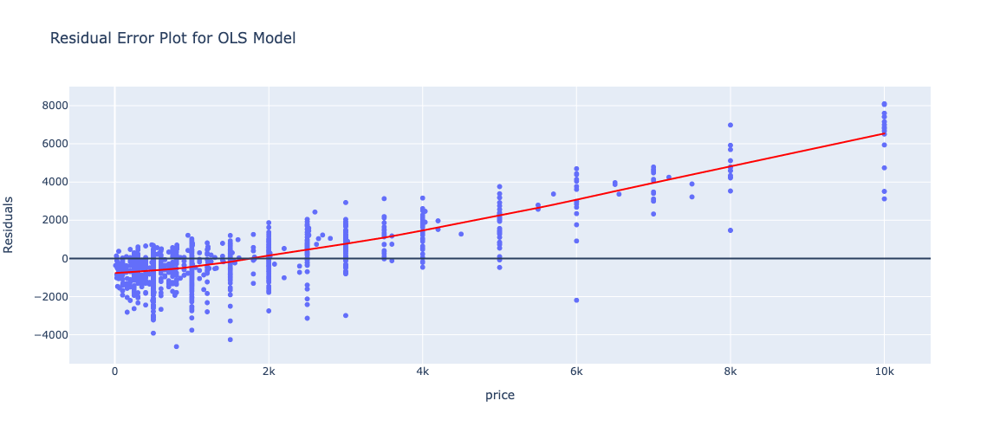

In [846]:
fig = px.scatter(x = y_b, y = y_b - y_pred, trendline = 'lowess', 
                 trendline_color_override='red', 
                 height = 500, labels = {'y':'Residuals', 'x':'price'}, 
                 title = 'Residual Error Plot for OLS Model')

fig.add_hline(y=0)

**Observations:**
- The residuals plot is approximately linear. The lowess line shows the typical residual value for different prices. Initially, it is below the y = 0 line, meaning the model is tending to over-estimate the price for low prices. At about £2000, the lowess goes above the y axis and steadily increases, meaning that for larger prices it tends to increasingly under-estimate the price. 
- As suggested by the large mean MAE during cross validation, the linear model does a poor job of predicting price. 
- The poor model fit could be due to the following: 
  - Some variables may have a quadratic or other non-linear relationship with price. Transforming them could allow the linear model to better predict price. 
  - The relationship with price may be unable to be captured by a linear model even with variable transformations. 
  - The data may be missing an essential variable which would capture the trend that is not currently explained by the model. 
  
#### Model Lower Prices Only
We wonder whether the price trend is different between large and small prices. To test this, we will create an OLS model using only prices below £2100 which captures most of the spaces but excludes the very large ones. 

Below, we define a new dataset **X_d** and **y_d** which contains these prices: 

In [672]:
train_min_low = train_min[train_min.total_price < 2100]
X_d = train_min_low.loc[:,train_min_low.columns != 'total_price']
y_d = train_min_low.total_price

We re-run the grid search on the new dataset to find the optimal parameters:

In [673]:
ols.fit(X_d, y_d, groups = X_d['venue_url'])
results_d = pd.DataFrame(ols.cv_results_)

Fitting 5 folds for each of 888 candidates, totalling 4440 fits


In [674]:
results_d.sort_values('rank_test_neg_mean_absolute_error').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__geo__log,param_preprocessor__num__select_cols__kw_args,param_preprocessor__num__simple_trans__kw_args,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
455,0.465214,0.021490,0.170794,0.017707,PCA(n_components=3),median,10,69,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.127711,0.141552,0.172383,0.035418,0.047054,0.104824,0.054022,7,-449.548015,-435.889132,-417.207357,-490.245486,-443.102276,-447.198453,24.094451,1
527,0.420797,0.045841,0.156889,0.010683,PCA(n_components=3),mean,10,69,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.133086,0.138546,0.168979,0.050397,0.015983,0.101398,0.058049,12,-446.905000,-436.033405,-417.481967,-484.649426,-451.191682,-447.252296,22.028712,2
523,0.448822,0.040949,0.176676,0.021424,PCA(n_components=3),mean,10,69,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.132467,0.134633,0.166787,0.048033,0.015205,0.099425,0.057625,16,-446.874888,-436.687045,-418.079238,-484.838762,-451.628369,-447.621660,21.881703,3
879,0.005918,0.000219,0.002939,0.000171,PCA(n_components=3),NaN,NaN,NaN,NaN,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,drop,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.134629,0.142375,0.192324,0.045118,0.046388,0.112167,0.057731,1,-446.066991,-436.698733,-413.249578,-496.438397,-445.822007,-447.655141,27.164220,4
451,0.441954,0.048365,0.173963,0.018802,PCA(n_components=3),median,10,69,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,{'preprocessor__cat__PCA': PCA(n_components=3)...,0.122506,0.137760,0.167566,0.034360,0.047188,0.101876,0.052111,10,-450.610268,-436.136476,-418.332842,-490.158016,-443.442444,-447.736009,23.771487,5


We now have a typical cross validation mean MAE of about **£447** with s standard deviation of about **£24**. Below we calculate the median price in **y_d** so we can compare this error to typical price values. The median price is **£750** and thus our typical error is now considerably lower than the typical price. This is an improvement, however it is still over 50% the size of the typical price and thus is still a poor model. We would hope to reduce the error below at least £100 to consider the model to be useful and accurate.  

In [851]:
y_d.median()

750.0

Next we will recreate the Residuals plot for our new dataset and model: 

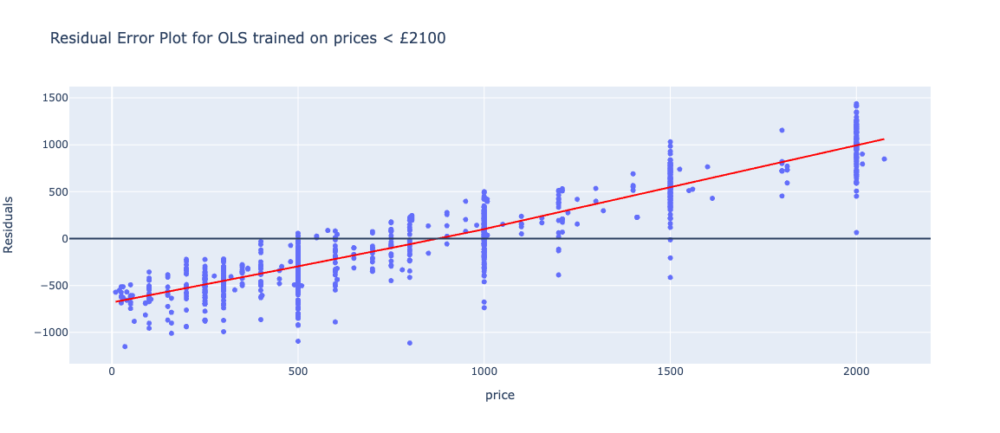

In [852]:
y_pred = ols.best_estimator_.predict(X_d)

fig = px.scatter(x = y_d, y = y_d - y_pred, trendline = 'lowess', trendline_color_override='red', 
           height = 500, labels = {'y':'Residuals', 'x':'price'}, 
          title = 'Residual Error Plot for OLS trained on prices < £2100')

fig.add_hline(y=0)

**Observations:**
- The plot is improved relative to our previous plot - The typical error as measured by the lowess line does not go as far away from the y = 0 line as previously. 
- The linear nature of the plot shows the model is still fundamentally failing to capture the price trends for large and small prices. 
- Since the model did improve, it may true that large prices do vary differently to smaller prices (<£2100) or perhaps there are fewer larger prices and thus they are more prone to over or under-fitting. It may be beneficial to only model the lower prices.
- Another interpretation of the linear trend is that it shows our model is similar to a model that predicts the mean target value every time. This is the most basic model possible. For such a model, we would expect to see a linear plot as shown above. When predicting prices which are around the mean price, the residual will be low. When predicting prices above the mean, the residual will become increasingly positive for larger prices, as they get further from the mean. And the opposite would be seen for predicting prices below the mean, the residual would become increasingly negative as the prices drop. This means our model is doing a poor job.  

### Polynomial Regression
Based on our Residuals analysis of our OLS model, we will introduce interaction and polynomial terms into the model to see if they capture some of the trends that the OLS model could not. 

We anticipate that there may be an interaction term between the geographic price and the capacity of a space. Our logic is that in more expensive areas, there may be a higher sensitivity to changes in capacity. In other words, a venue having a slightly lower or higher capacity may make a bigger difference to the price in more sought after locations. 

Below, we multiply the 'max_seated_or_standing' by the geographic price and plot this against 'total_price' to see if there is evidence of an interaction term:

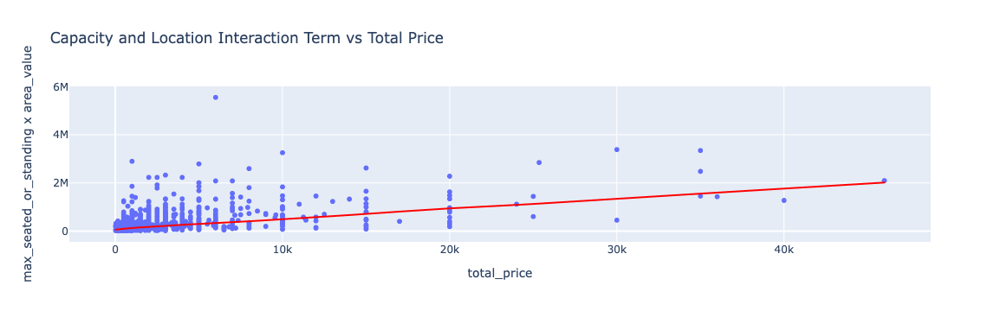

In [679]:
plot_data = min_spend.max_seated_or_standing * min_spend.area_value
px.scatter(x = min_spend.total_price, y = plot_data, 
           title = 'Capacity and Location Interaction Term vs Total Price',
           labels = {'x': 'total_price', 'y':'max_seated_or_standing x area_value'},
           trendline = 'lowess', trendline_color_override= 'red')

**Observations**: 
- The lowess line in red suggests a strongly linear relation, thus there may indeed be a real interaction term between maximum capacity (max_seated_or_standing) and geographic price (area_value). 
- We will experiment with adding this interaction term to our polynomial model.

#### Create Custom Transformers
To add the interaction and polynomial terms, we will create functions and use the FunctionTransformer Scikit Learn class to turn them into transformers that work within a pipeline and gridsearch. 

Below, we create a function to create an interaction term: 

In [680]:
def add_interaction_term(X, cols = []):
    """Add interaction between 2 columns.
    
    args: 
        X (dataframe): Training data. 
        cols (list): List of 2 columns you want to add interaction term for.
    
    Returns:
        (dataframe): Returns training data including the new interaction. 
    """
    
    if cols == []: 
        return X
    
    X[cols[0] + '_' + cols[1] + '_interaction'] = X[cols[0]] * X[cols[1]]
    return X

In [681]:
add_interaction_term(X_b[['latitude', 'max_seated_or_standing', 'area_in_m2']], 
                     ['max_seated_or_standing', 'area_in_m2'])

<ipython-input-680-fafb5e7ebe6b>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,latitude,max_seated_or_standing,area_in_m2,max_seated_or_standing_area_in_m2_interaction
0,51.510877,120,10000.0,1200000.0
6,51.373377,50,45.0,2250.0
8,51.373377,80,85.0,6800.0
9,51.373377,300,269.0,80700.0
20,51.518075,65,91.0,5915.0
...,...,...,...,...
5182,51.526490,85,74.0,6290.0
5185,51.522379,30,30.0,900.0
5186,51.526490,150,NaN,NaN
5187,51.530791,100,NaN,NaN


Below, we create a function that creates polynomial terms of a specified column: 

In [682]:
def create_poly_terms(X, col, max_power = 2):
    """Add polynomial terms for a specified column. 
    
    args:
        X (dataframe): Training data. 
        col (string): Name of column you want to create polynomial terms for.
        max_power (int): Maximum power of polynomial terms (if set to 1, there 
            will be no polynomial terms added, if 2 then a squared term is added, 
            if 3 then a squared and a cubed term is added etc.)
            
    Returns:
        (dataframe): Training data including new polynomial columns.
    """
    
    # Loop through from 2 to max_power, ensures that if max_power is 1 then nothing
    # is changed. 
    for power in range(2, max_power + 1):
            X[col + '_to_power_' + str(power)] = np.power(X[col], power)
    return X

In [683]:
create_poly_terms(X_b[['latitude', 'max_seated_or_standing', 'area_in_m2']], 
                 col = 'max_seated_or_standing', max_power = 3)

<ipython-input-682-4bb856b78455>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,latitude,max_seated_or_standing,area_in_m2,max_seated_or_standing_to_power_2,max_seated_or_standing_to_power_3
0,51.510877,120,10000.0,14400,1728000
6,51.373377,50,45.0,2500,125000
8,51.373377,80,85.0,6400,512000
9,51.373377,300,269.0,90000,27000000
20,51.518075,65,91.0,4225,274625
...,...,...,...,...,...
5182,51.526490,85,74.0,7225,614125
5185,51.522379,30,30.0,900,27000
5186,51.526490,150,NaN,22500,3375000
5187,51.530791,100,NaN,10000,1000000


#### Create Pipeline
Now we need to create a new pipeline that includes the polynomial and interaction steps. We will copy our old **pipe_ols** pipeline and then add in the interaction term and polynomial terms after the 'pre-processor' column transformer step: 

In [684]:
# Create transformer to create interaction term between 
# 'max_seated_or_standing' and 'agg_price'
add_geo_capacity_interaction = FunctionTransformer(
    add_interaction_term, kw_args = {'cols':['max_seated_or_standing',
                                             'agg_price']})
# Create tranformer to create polynomial terms of 'agg_price' to 3rd power 
poly_geo = FunctionTransformer(create_poly_terms, 
                               kw_args = {'col':'agg_price', 
                                          'max_power':3})
# Create tranformer to create polynomial terms of 'max_seated_or_standing'
# to 3rd power 
poly_capacity = FunctionTransformer(create_poly_terms, 
                                    kw_args = {'col':'max_seated_or_standing',
                                               'max_power':3})
# Copy old OLS pipe
pipe_poly = deepcopy(pipe_ols)

# insert the new trasformer steps into pipe_poly 
pipe_poly.steps.insert(-1,('interaction', add_geo_capacity_interaction))
pipe_poly.steps.insert(-1,('poly_geo', poly_geo))
pipe_poly.steps.insert(-1,('poly_capacity', poly_capacity))

pipe_poly

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated_or_standing',
                                                                                                            'area_in_m2']})),
                                                                  ('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_trans',
                                                                   FunctionTransformer(func=<function simple_trans at 0x17f827af0>,
                                                                                       kw...
                                     kw_args={'cols': ['max_seated_or_standing',
                                                       'agg_price']})),
                ('poly_geo',
                 FunctionTransformer(func=<function create_poly_terms at 0x297b3eb80>,
                                     kw_args={'col': 'agg_price',
                                              'max_power': 3})),
                ('poly_capacity',
                 FunctionTransformer(func=<function create_poly_terms at 0x297b3eb80>,
                                     kw_args={'col': 'max_seated_or_standing',
                                              'max_power': 3})),
                ('regressor', LinearRegression())])

In [685]:
pipe_poly[0:-1].fit_transform(X_b, y_b)

,max_seated_or_standing,area_in_m2,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,agg_price,max_seated_or_standing_agg_price_interaction,agg_price_to_power_2,agg_price_to_power_3,max_seated_or_standing_to_power_2,max_seated_or_standing_to_power_3
0,10.954451,10000.0,-0.665952,0.505660,-0.330767,1.032107,0.074510,-0.249364,-0.299709,0.147491,0.241817,6.907755,75.670668,47.717083,329.617932,120.0,1314.534138
6,7.071068,45.0,-0.985872,0.135024,-0.053165,-0.448196,-0.784932,0.006379,-0.130435,0.183155,-0.625510,6.907755,48.845206,47.717083,329.617932,50.0,353.553391
8,8.944272,85.0,-0.828919,0.201999,-0.167606,-0.250327,-0.771308,-0.355057,-0.359483,-0.134284,-0.111405,6.907755,61.784842,47.717083,329.617932,80.0,715.541753
9,17.320508,269.0,-0.444680,0.211998,-0.123461,-0.613278,-0.767934,-0.496426,-0.066776,-0.214500,-0.497557,6.907755,119.645831,47.717083,329.617932,300.0,5196.152423
20,8.062258,91.0,0.904742,-1.395331,-0.625800,-0.258031,0.056942,-0.103441,0.590990,-0.960082,-0.169057,6.907755,55.692104,47.717083,329.617932,65.0,524.046754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,9.219544,74.0,0.201057,0.552737,-0.860527,-0.654072,0.402274,0.011404,0.397582,-0.369704,0.395561,6.907755,63.686357,47.717083,329.617932,85.0,783.661279
5185,5.477226,30.0,0.185264,0.160394,0.068939,-0.314983,-0.217816,1.288194,-0.412702,0.784341,0.073773,6.907755,37.835334,47.717083,329.617932,30.0,164.316767
5186,12.247449,80.0,-0.413675,0.143292,-0.340013,-0.849846,-0.084432,0.152150,-0.551553,-0.477990,0.296769,6.907755,84.602379,47.717083,329.617932,150.0,1837.117307
5187,10.000000,80.0,0.134192,-0.513254,0.030509,-0.521174,-0.043373,-0.358255,-0.479266,0.559813,0.479016,7.919356,79.193562,62.716202,496.671946,100.0,1000.000000


#### Create Paramater Grid Search
We are now ready to create a new gridsearch that will search through the old paramater space and will also test variations in our new transformations, testing different polynomial degrees (between 1 i.e. no polynomial and 3 which is cubic) and testing whether to include the interaction term or not. 

Note that as before, we test dropping the geographic price variable altogether using a second dictionary in the **paramaters** list. We also need to specifically change the interaction term and geographic polynomial transformation into a 'passthrough' step because they cannot be used without the geographic price. 

In [686]:
# Convenience function to make it easier to pass kw_args
# dictionary to polynomial transformation classes: 
def poly_kwargs_dict(col, power):
    return {'col':col, 'max_power':power}

parameters = [{'preprocessor__num__select_cols__kw_args':[kw_args_B],
               'preprocessor__num__simple_trans__kw_args': [None, {'transforms':transforms_A}],
               'preprocessor__cat__PCA':[PCA(0), PCA(1),PCA(2),PCA(3), PCA(6)],
               'preprocessor__geo__geo_price__agg_func': ['median','mean'],
               'preprocessor__geo__geo_price__min_count': [10,11,12],
               'preprocessor__geo__geo_price__n_grids':[65, 67, 69],
               'preprocessor__geo__log':['passthrough', FunctionTransformer(np.log)],
               'interaction': [add_geo_capacity_interaction, 'passthrough'], 
               'poly_capacity__kw_args':[poly_kwargs_dict('max_seated_or_standing', 1),
                                         poly_kwargs_dict('max_seated_or_standing', 2),
                                         poly_kwargs_dict('max_seated_or_standing', 3)],
               'poly_geo__kw_args':[poly_kwargs_dict('agg_price', 1),
                                         poly_kwargs_dict('agg_price', 2),
                                         poly_kwargs_dict('agg_price', 3)]},
              {'preprocessor__num__select_cols__kw_args':[kw_args_B],
               'preprocessor__num__simple_trans__kw_args': [None, {'transforms':transforms_A}],
               'preprocessor__cat__PCA':[PCA(0), PCA(1),PCA(2),PCA(3), PCA(6)],
               'preprocessor__geo':['drop'],
               'interaction':['passthrough'],
               'poly_geo':['passthrough'],
               'poly_capacity__kw_args':[poly_kwargs_dict('max_seated_or_standing', 1),
                                         poly_kwargs_dict('max_seated_or_standing', 2),
                                         poly_kwargs_dict('max_seated_or_standing', 3)]}]

poly = GridSearchCV(pipe_poly, parameters, 
                   scoring = ['r2', 'neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Now we run the grid search to search through our parameter space:

In [687]:
poly.fit(X_b, y_b, groups=X_b['venue_url'])

Fitting 5 folds for each of 6510 candidates, totalling 32550 fits


GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('select_cols',
                                                                                          FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                              kw_args={'columns': ['max_seated_or_standing',
                                                                                                                                   'area_in_m2']})),
                                                                                         ('impute',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('simple_t...
                                                     PCA(n_components=2),
                                                     PCA(n_components=3),
                                                     PCA(n_components=6)],
                          'preprocessor__geo': ['drop'],
                          'preprocessor__num__select_cols__kw_args': [{'columns': ['max_seated_or_standing']}],
                          'preprocessor__num__simple_trans__kw_args': [None,
                                                                       {'transforms': {'sqrt': ['max_seated_or_standing']}}]}],
             refit='neg_mean_absolute_error',
             scoring=['r2', 'neg_mean_absolute_error'], verbose=3)

In [688]:
results_poly = pd.DataFrame(poly.cv_results_)
plot_data = results_poly.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_interaction,param_poly_capacity__kw_args,param_poly_geo__kw_args,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__geo__log,param_preprocessor__num__select_cols__kw_args,param_preprocessor__num__simple_trans__kw_args,param_poly_geo,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
259,0.500919,0.054018,0.164803,0.027077,FunctionTransformer(func=<function add_interac...,"{'col': 'max_seated_or_standing', 'max_power': 1}","{'col': 'agg_price', 'max_power': 1}",PCA(n_components=3),mean,10,67,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,NaN,{'interaction': FunctionTransformer(func=<func...,0.155754,0.276854,0.331143,0.357010,0.278029,0.279758,0.069277,147,-1037.077774,-1185.728710,-1103.021614,-1021.263703,-1070.128864,-1083.444133,58.376286,1
977,0.426409,0.039292,0.159236,0.014597,FunctionTransformer(func=<function add_interac...,"{'col': 'max_seated_or_standing', 'max_power': 1}","{'col': 'agg_price', 'max_power': 3}",PCA(n_components=3),mean,10,67,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,NaN,{'interaction': FunctionTransformer(func=<func...,0.168704,0.289555,0.312634,0.353443,0.276230,0.280113,0.061565,130,-1033.813142,-1180.233127,-1120.041249,-1018.382203,-1068.002931,-1084.094530,59.397077,2
945,0.452414,0.039897,0.167282,0.011512,FunctionTransformer(func=<function add_interac...,"{'col': 'max_seated_or_standing', 'max_power': 1}","{'col': 'agg_price', 'max_power': 3}",PCA(n_components=3),median,10,69,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,NaN,{'interaction': FunctionTransformer(func=<func...,0.197708,0.272592,0.301145,0.345386,0.281167,0.279600,0.048062,154,-1022.951277,-1199.073789,-1130.248686,-1027.344550,-1044.119178,-1084.747496,69.145340,3
271,0.449779,0.033767,0.172997,0.012906,FunctionTransformer(func=<function add_interac...,"{'col': 'max_seated_or_standing', 'max_power': 1}","{'col': 'agg_price', 'max_power': 1}",PCA(n_components=3),mean,11,67,FunctionTransformer(func=<ufunc 'log'>),{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,NaN,{'interaction': FunctionTransformer(func=<func...,0.153239,0.275287,0.331440,0.357727,0.279955,0.279530,0.070394,158,-1041.148250,-1188.758947,-1104.642095,-1021.472737,-1068.670910,-1084.938588,58.952592,4
4185,0.436278,0.025854,0.157733,0.007514,passthrough,"{'col': 'max_seated_or_standing', 'max_power': 1}","{'col': 'agg_price', 'max_power': 3}",PCA(n_components=3),median,10,69,passthrough,{'columns': ['max_seated_or_standing']},{'transforms': {'sqrt': ['max_seated_or_standi...,NaN,NaN,"{'interaction': 'passthrough', 'poly_capacity_...",0.208962,0.272392,0.311310,0.343795,0.284956,0.284283,0.044916,7,-1022.036908,-1199.423576,-1130.164036,-1029.775322,-1043.527802,-1084.985529,69.089222,5


**Observations:**
- The top 5 performing models tended to keep the interaction term and sometimes included the geographic price to a third degree polynomial. 
- The 'max_seated_or_standing' polynomial is always dropped by the top models (max_power = 1) 
- The top performing model is almost exactly the same as the top performing model in the pipe_ols gridsearch. The typical mean cross validation MAE is **£1084** which is worse than for our standard OLS model (**£1080**) thus the polynomial model approach does not improve the fit. 

### Ridge Regression
We will now try using Ridge regression on a wider sample of variables to see if we can improve upon the OLS model and whether adding more variables will improve the model fit. 

We will test using different combinations of more of the numerical columns. We define these different column selections below. The Ridge model can extract better trends from multicolinear columns. We will also try including latitude and longitude and other numerical columns to see how that impacts things.  

In [689]:
num_cols_1 = ['max_seated', 'max_standing', 'max_seated_or_standing',
              'Dining_max','Theatre_max','Boardroom_max','Classroom_max',
              'Cabaret_max','U-Shaped_max','min_area_per_person','area_in_m2', 
              'tube_distance']

num_cols_2 = ['max_seated', 'max_standing', 'max_seated_or_standing',
              'Dining_max','Theatre_max','Boardroom_max','Classroom_max',
              'Cabaret_max','U-Shaped_max']

num_cols_3 = ['max_seated_or_standing']

num_cols_4 = ['max_seated', 'max_standing', 'max_seated_or_standing',
              'Dining_max','Theatre_max','Boardroom_max','Classroom_max',
              'Cabaret_max','U-Shaped_max','min_area_per_person','area_in_m2', 
              'tube_distance', 'latitude', 'longitude']

#### Create Pipeline
Below, we create a new pipeline for our Ridge model. This is almost identical to our first OLS pipeline (pipe_ols) but we have tweaked the 'preprocessor' columnTransformer to include more numerical columns, we have added a standardisation scaler before the model and we are using a RidgeCV model. 

We are taking square root of max_seated_or_standing and log of the geographic price. 

Note that the benefit of the RidgeCV object is that it can use Leave One Out Cross Validation to optimise its hyperparamater in the same time it takes to run a single model testing a single parameter value. We will take advantage of this efficiency. 

In [690]:
num_transformer = Pipeline(
    steps=[('select_cols', FunctionTransformer(select_columns, 
                                               kw_args={'columns':num_cols_4})),
           ('impute', SimpleImputer(strategy='median')), 
           ('simple_trans', FunctionTransformer(simple_trans, 
                                                kw_args = {'transforms':transforms_A}))])

cat_transformer = Pipeline(steps=[('PCA', PCA(3))])

geo_transformer = Pipeline(steps=[('geo_price', geo_price()), 
                                  ('log', FunctionTransformer(np.log))])

preprocessor = ColumnTransformer(
    transformers=[('num', num_transformer, num_cols_4), 
                  ('cat', cat_transformer, cat_cols),
                  ('geo', geo_transformer, coord_cols)],
    verbose_feature_names_out = False)

pipe_ridge = Pipeline(steps=[('preprocessor', preprocessor), 
                             ('scaler', StandardScaler()),
                             ('regressor', RidgeCV(scoring= 'neg_mean_absolute_error'))])

pipe_ridge

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated',
                                                                                                            'max_standing',
                                                                                                            'max_seated_or_standing',
                                                                                                            'Dining_max',
                                                                                                            'Theatre_max',
                                                                                                            'Boardroom_max',
                                                                                                            'Classroom_max',
                                                                                                            'Cabaret_max',
                                                                                                            'U-Shaped_max',
                                                                                                            'min_area_per_person',
                                                                                                            'a...
                                                   'Temporary_event_notices_(TENs)_available',
                                                   'Disabled_access_toilets',
                                                   'Ground_level',
                                                   'Lift_to_all_floors']),
                                                 ('geo',
                                                  Pipeline(steps=[('geo_price',
                                                                   geo_price()),
                                                                  ('log',
                                                                   FunctionTransformer(func=<ufunc 'log'>))]),
                                                  ['latitude', 'longitude'])],
                                   verbose_feature_names_out=False)),
                ('scaler', StandardScaler()),
                ('regressor', RidgeCV(scoring='neg_mean_absolute_error'))])

In [691]:
pipe_ridge[0:-1].fit_transform(X_b, y_b)

,max_seated,max_standing,max_seated_or_standing,Dining_max,Theatre_max,Boardroom_max,Classroom_max,Cabaret_max,U-Shaped_max,min_area_per_person,area_in_m2,tube_distance,latitude,longitude,pca0,pca1,pca2,agg_price
0,-0.921827,0.064311,0.279274,-0.845782,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,11.157877,16.683368,-1.286356,0.021215,-1.338255,-0.785089,0.797956,-0.584566,-0.33296
6,-0.310851,-0.453202,-0.526323,-0.195804,-0.391529,-0.455185,-0.276499,-0.363668,1.445792,-0.169395,-0.243505,0.892319,-5.338929,0.290164,-1.161956,0.216361,-0.099017,-0.33296
8,0.300125,-0.231411,-0.137732,0.129184,0.848523,1.949411,1.851019,1.853942,-0.326892,-0.147066,-0.175492,0.892319,-5.338929,0.290164,-0.976937,0.322352,-0.301760,-0.33296
9,0.605613,1.395057,1.599894,0.779162,0.641848,-0.455185,3.269364,-0.363668,-0.326892,-0.169853,0.137371,0.892319,-5.338929,0.290164,-0.524176,0.336137,-0.229770,-0.33296
20,-0.234479,-0.342306,-0.320703,-0.358299,0.538510,1.348262,0.574508,0.467935,1.091255,-0.100690,-0.165290,0.892319,0.301828,-0.623416,1.066285,-2.209909,-1.109164,-0.33296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,-0.005363,-0.194446,-0.080628,0.129184,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.173437,-0.194195,1.860618,0.629863,0.164845,0.237001,0.874020,-1.528780,-0.33296
5185,-0.616339,-0.601063,-0.856961,-0.520793,-0.391529,0.747113,-0.276499,-0.363668,-0.326892,-0.155654,-0.269010,0.408169,0.469628,-0.039595,0.218319,0.253623,0.123116,-0.33296
5186,0.300125,0.286102,0.547502,0.454173,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.155654,-0.183993,1.860618,0.629863,0.164845,-0.487628,0.226917,-0.609093,-0.33296
5187,-0.158107,-0.083550,0.081276,-0.033310,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.155654,-0.183993,-0.802206,0.797551,-0.095212,0.158080,-0.813364,0.058619,-0.33296


#### Parameter Grid Search
Below we create a grid search object for our ridge model. We decided to focus on tuning the following parameters: 
- The numerical columns included in model
- The number of PCA components to include, including using the raw categorical variables or not including any. 
- Whether to use median or mean in geographic price aggregation
- What minimum count of spaces is required in geographic square to allow aggregation to be calculated. 
- The number of geographic squares defined. 
- Using a StandardScaler vs a RobustScaler to scale the variables before the regression. 
- The alphas used to optimise the Ridge regression. 
- Whether to include the geographic price. 

We tested several combinations of the PCA and alphas used in the gridsearch to try and find the optimal values and the older values tested have been commented out. 

In [857]:
#alphas = [1e-3, 1e-2, 1e-1, 1, 10, 100, 1000]
#alphas = [25, 50, 75]
#alphas = [18,19,20,21,22,23,24,25,26,27,28]

alphas = [0.5, 1, 4, 8, 10]

#pcas = ['passthrough', PCA(0), PCA(1),PCA(2),PCA(3), PCA(6), PCA(9), PCA(12), PCA()]
pcas = [PCA(9),  PCA(10), PCA(11), PCA(12), PCA(13)]

kw_args_1 = {'columns':num_cols_1}
kw_args_2 = {'columns':num_cols_2}
kw_args_3 = {'columns':num_cols_3}
kw_args_4 = {'columns':num_cols_4}

# Note, we use the list of dictionaries to remove the geo transformer 
# section using 'drop' whilst performing the same parameter search as before 
parameters = [{'preprocessor__num__select_cols__kw_args':[kw_args_1, kw_args_2, 
                                                          kw_args_3, kw_args_4],
               'preprocessor__cat__PCA':pcas,
               'preprocessor__geo__geo_price__agg_func': ['median','mean'],
               'preprocessor__geo__geo_price__min_count': [7, 8, 9],
               'preprocessor__geo__geo_price__n_grids':[65, 67, 69],
               'scaler': [RobustScaler(), StandardScaler()],
               'regressor__alphas':[alphas]},
              {'preprocessor__num__select_cols__kw_args':[kw_args_1, kw_args_2, 
                                                          kw_args_3, kw_args_4],
               'preprocessor__cat__PCA':pcas,
               'preprocessor__geo':['drop'],
               'scaler': [RobustScaler(), StandardScaler()], 
               'regressor__alphas':[alphas]}]

gkf=GroupKFold(n_splits=5)

ridge = GridSearchCV(pipe_ridge, parameters, 
                   scoring = ['r2', 'neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Below, we run the gridsearch: 

In [858]:
ridge.fit(X_b, y_b, groups=X_b['venue_url'])

Fitting 5 folds for each of 760 candidates, totalling 3800 fits


GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('select_cols',
                                                                                          FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                              kw_args={'columns': ['max_seated',
                                                                                                                                   'max_standing',
                                                                                                                                   'max_seated_or_standing',
                                                                                                                                   'Dining_max',
                                                                                                                                   'Theatre_max',
                                                                                                                                   'Boardroom_max',...
                                                                                   'max_seated_or_standing',
                                                                                   'Dining_max',
                                                                                   'Theatre_max',
                                                                                   'Boardroom_max',
                                                                                   'Classroom_max',
                                                                                   'Cabaret_max',
                                                                                   'U-Shaped_max',
                                                                                   'min_area_per_person',
                                                                                   'area_in_m2',
                                                                                   'tube_distance',
                                                                                   'latitude',
                                                                                   'longitude']}],
                          'regressor__alphas': [[0.5, 1, 4, 8, 10]],
                          'scaler': [RobustScaler(), StandardScaler()]}],
             refit='neg_mean_absolute_error',
             scoring=['r2', 'neg_mean_absolute_error'], verbose=3)

Top 10 gridsearch models are shown below: 

In [859]:
results_ridge = pd.DataFrame(ridge.cv_results_)
plot_data = results_ridge.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__num__select_cols__kw_args,param_regressor__alphas,param_scaler,param_preprocessor__geo,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
133,0.503081,0.027908,0.187079,0.009070,PCA(n_components=9),mean,9,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.177036,0.293129,0.331089,0.375772,0.302730,0.295951,0.066031,14,-1051.435197,-1176.021873,-1115.729335,-1009.312464,-1054.596682,-1081.419110,58.214638,1
565,0.426157,0.021322,0.155968,0.007231,PCA(n_components=12),mean,9,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=12...,0.180059,0.306146,0.331302,0.368181,0.302588,0.297655,0.063295,4,-1047.190337,-1170.351786,-1126.603995,-1012.826674,-1053.439175,-1082.082393,57.633155,2
469,0.459302,0.017995,0.176621,0.017006,PCA(n_components=12),median,8,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=12...,0.164312,0.319589,0.314096,0.361580,0.298339,0.291583,0.066984,44,-1061.412569,-1141.909131,-1133.947352,-1017.428415,-1061.506882,-1083.240870,47.525219,3
37,0.448285,0.042313,0.158231,0.008832,PCA(n_components=9),median,8,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.157069,0.315010,0.314062,0.375394,0.296097,0.291526,0.072378,47,-1067.435585,-1144.312451,-1139.929682,-1001.892605,-1064.070308,-1083.528126,53.249985,4
109,0.432312,0.032160,0.168541,0.020285,PCA(n_components=9),mean,8,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.162834,0.308365,0.328798,0.377070,0.308785,0.297170,0.071681,5,-1064.776204,-1165.282948,-1128.795610,-1005.902573,-1053.088003,-1083.569068,56.633824,5
53,0.418412,0.022131,0.165561,0.003570,PCA(n_components=9),median,9,65,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.210203,0.273315,0.308844,0.372057,0.263433,0.285571,0.053558,105,-1058.773217,-1189.760318,-1140.719960,-978.040989,-1051.542429,-1083.767383,73.917961,6
132,0.472815,0.023756,0.189790,0.014025,PCA(n_components=9),mean,9,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",RobustScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=9)...,0.175537,0.302472,0.327840,0.376637,0.302612,0.297020,0.066495,7,-1052.722114,-1175.653670,-1128.230120,-1007.724955,-1054.809056,-1083.827983,60.008084,7
541,0.510573,0.051725,0.175510,0.021547,PCA(n_components=12),mean,8,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",StandardScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=12...,0.168828,0.313811,0.330707,0.361535,0.305620,0.296100,0.066456,12,-1058.067091,-1159.405733,-1124.625898,-1020.983421,-1057.052136,-1084.026856,50.410866,8
324,0.449264,0.020232,0.180951,0.015339,PCA(n_components=11),median,8,67,{'columns': ['max_seated_or_standing']},"[0.5, 1, 4, 8, 10]",RobustScaler(),NaN,{'preprocessor__cat__PCA': PCA(n_components=11...,0.160534,0.315249,0.315751,0.376282,0.298920,0.293347,0.071457,27,-1069.841510,-1144.935210,-1137.525076,-1006.996620,-1061.058571,-1084.071397,51.447644,9
36,0.444429,0.040457,0.166964,0.011078,PCA(n

**Observations:**
- The optimal parameters are different than for our OLS model. The Ridge model prefers a higher PCA component of around 10 and prefers to use 'mean' to aggregation geographic prices. 
- The top 10 models exclusively use only 'max_seated_or_standing' as the numerical column, which is surprising. We expected it to use a combination of the other numerical values. 
- In this case, the Robust Scaler doesnt appear to be any better than the StandardScaler. 
- The typical mean cross validation MAE is about **£1082** and so again is worse than OLS.

Because we used the RidgeCV object rather than a Ridge object, the gridsearch results do not have access to the selected alpha values. Below we extract the alpha values for the best performing model:   

In [860]:
pipe_ridge_ = ridge.best_estimator_
pipe_ridge_.steps[-1][1].alpha_

10.0

### Lasso & Elastic Net Regression
We will now try using the Lasso and Elastic Net models on our data to see if they can improve upon our Ridge model. The benefit of Lasso and Elastic Net is that they can perform variable selection, and thus we can provide them with all the potentially useful variables and they will select only the useful ones.

#### Create Custom Transformer
We want to use the elastic net / lasso model to select the best variables. As such, we want to present as many variables as possible to the model and we'll let the model choose the best ones. Previously, we applied simple transforms to some variables like square root or log. We would like to provide both versions of a variable (e.g. the square root and original) so the model can select the best one. The below function will add a new column that is a simple transform of a specified column (and will also include the original column): 

In [697]:
def add_simple_transform(X, col, func):
    """Apply function to column and add to dataframe
    
    args:
        X (dataframe): Training data
        col (string): Column you wish to transform. 
        func (function): Function you wish to apply to column. 
        
    Returns: 
        (dataframe): Returns X with new column made by applying the 
            provided function to specified column.
    """
    
    func_name = func.__name__
    name = func_name + '_' + col
    X[name] = func(X[col])
    return X

In [698]:
add_simple_transform(X_b[['max_seated_or_standing', 'area_in_m2']], 
                     'max_seated_or_standing', np.sqrt)

<ipython-input-697-68a6589f93fc>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,max_seated_or_standing,area_in_m2,sqrt_max_seated_or_standing
0,120,10000.0,10.954451
6,50,45.0,7.071068
8,80,85.0,8.944272
9,300,269.0,17.320508
20,65,91.0,8.062258
...,...,...,...
5182,85,74.0,9.219544
5185,30,30.0,5.477226
5186,150,NaN,12.247449
5187,100,NaN,10.000000


#### Create Pipeline
Below we create the pipeline for the Elastic Net model. Note that we will only use the Elastic net model and will set its **l1_ratio** argument to 1 in a grid search to implement the lasso.

Notable changes to the pipeline include: 
- We are using the 'add_simple_transform' function to square root 'max_seated_or_standing' and to log 'agg_price' - this allows the elastic net to see both versions of the variable and select the best one. 
- We added an 'add_raw_cat' step to the ColumnTransformer (preprocessor) that adds all categorical columns in their raw state. Again, we want the model to see as many variables as possible to choose the best ones. 

In [699]:
kwargs_sqrt = dict(col = 'max_seated_or_standing', func = np.sqrt)
kwargs_log = dict(col = 'agg_price', func = np.log)

num_transformer = Pipeline(
    steps=[('select_cols', FunctionTransformer(select_columns, 
                                               kw_args={'columns':num_cols_4})),
           ('impute', SimpleImputer(strategy='median')), 
           ('add_trans', FunctionTransformer(add_simple_transform, 
                                             kw_args = kwargs_sqrt))])

cat_transformer = Pipeline(steps=[('PCA', PCA())])

geo_transformer = Pipeline(steps=[('geo_price', geo_price()), 
                                  ('add_trans', FunctionTransformer(add_simple_transform, 
                                             kw_args = kwargs_log))])

preprocessor = ColumnTransformer(
    transformers=[('num', num_transformer, num_cols_4), 
                  ('cat', cat_transformer, cat_cols),
                  ('add_raw_cat', 'passthrough', cat_cols),
                  ('geo', geo_transformer, coord_cols)],
    verbose_feature_names_out = False)

pipe_elas = Pipeline(steps=[('preprocessor', preprocessor),
                           ('scaler', StandardScaler()),
                           ('regressor', ElasticNet())])

pipe_elas

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated',
                                                                                                            'max_standing',
                                                                                                            'max_seated_or_standing',
                                                                                                            'Dining_max',
                                                                                                            'Theatre_max',
                                                                                                            'Boardroom_max',
                                                                                                            'Classroom_max',
                                                                                                            'Cabaret_max',
                                                                                                            'U-Shaped_max',
                                                                                                            'min_area_per_person',
                                                                                                            'a...
                                                   'Disabled_access_toilets',
                                                   'Ground_level',
                                                   'Lift_to_all_floors']),
                                                 ('geo',
                                                  Pipeline(steps=[('geo_price',
                                                                   geo_price()),
                                                                  ('add_trans',
                                                                   FunctionTransformer(func=<function add_simple_transform at 0x2a1031430>,
                                                                                       kw_args={'col': 'agg_price',
                                                                                                'func': <ufunc 'log'>}))]),
                                                  ['latitude', 'longitude'])],
                                   verbose_feature_names_out=False)),
                ('scaler', StandardScaler()), ('regressor', ElasticNet())])

In [700]:
pipe_elas[0:-1].fit_transform(X_b, y_b)

,max_seated,max_standing,max_seated_or_standing,Dining_max,Theatre_max,Boardroom_max,Classroom_max,Cabaret_max,U-Shaped_max,min_area_per_person,area_in_m2,tube_distance,latitude,longitude,sqrt_max_seated_or_standing,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,Wi-Fi,Projector,Flipchart,Natural_light,Flatscreen_TV,Whiteboard,Conference_call_facilities,Air_conditioning,Storage_space,Accommodation_available,Own_music_allowed,Bring_your_own_DJ,PA_system_or_music_speakers_available,Wheelchair_accessible,Promoted_or_ticketed_events,Loud_music_or_events,Wedding_licence,Temporary_event_notices_(TENs)_available,Disabled_access_toilets,Ground_level,Lift_to_all_floors,agg_price,log_agg_price
0,-0.921827,0.064311,0.033247,-0.845782,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,11.157877,16.683368,-1.286356,0.021215,-1.338255,0.279274,-0.784947,0.800261,-0.586987,2.054383,0.156030,-0.546689,-0.676307,0.347952,0.613641,1.295163,0.227311,-0.450064,-0.459718,0.439293,-0.682325,0.633896,0.686004,-0.092446,0.179145,-0.252939,-0.112591,0.252797,-0.796778,-0.667074,-1.334607,1.027449,-0.466156,-0.389932,0.548024,-0.540188,-0.408450,0.754799,-0.511344,-1.273123,-0.928126,-0.667074,1.041468,-0.375402,-0.989899,-0.448575,-0.360582,-0.343888,-0.397445,-0.33296
6,-0.310851,-0.453202,-0.490322,-0.195804,-0.391529,-0.455185,-0.276499,-0.363668,1.445792,-0.169395,-0.243505,0.892319,-5.338929,0.290164,-0.526323,-1.162034,0.213684,-0.094342,-0.892047,-1.639597,0.014002,-0.294483,0.432090,-1.587978,-0.147276,1.645445,2.077894,0.323573,1.176887,-1.008068,1.821030,-1.036058,0.095982,-0.292301,-0.329699,-0.381522,0.252797,-0.796778,-0.667074,0.749284,-0.973284,-0.466156,-0.389932,-1.824738,-0.540188,-0.408450,-1.324857,-0.511344,-1.273123,-0.928126,-0.667074,1.041468,2.663811,1.010204,-0.448575,-0.360582,-0.343888,-0.397445,-0.33296
8,0.300125,-0.231411,-0.265935,0.129184,0.848523,1.949411,1.851019,1.853942,-0.326892,-0.147066,-0.175492,0.892319,-5.338929,0.290164,-0.137732,-0.977038,0.319624,-0.297331,-0.498936,-1.611786,-0.779569,-0.811572,-0.316891,-0.282517,-1.429488,1.733647,1.324723,0.738793,1.010691,-1.233962,1.918497,-0.560445,-0.044834,-0.270587,0.223965,-0.194226,0.252797,-0.796778,-0.667074,0.749284,-0.973284,-0.466156,-0.389932,0.548024,-0.540188,-0.408450,-1.324857,-0.511344,-1.273123,-0.928126,-0.667074,1.041468,2.663811,1.010204,-0.448575,-0.360582,-0.343888,-0.397445,-0.33296
9,0.605613,1.395057,1.379566,0.779162,0.641848,-0.455185,3.269364,-0.363668,-0.326892,-0.169853,0.137371,0.892319,-5.338929,0.290164,1.599894,-0.524135,0.335519,-0.219110,-1.219475,-1.603885,-1.088749,-0.149846,-0.505242,-1.262718,-1.201730,1.189033,-0.310853,1.377579,2.136251,-0.532362,3.327494,1.689538,0.022332,0.303997,-0.481136,2.097939,0.252797,1.255055,-0.667074,0.749284,-0.973284,-0.466156,-0.389932,0.548024,-0.540188,-0.408450,-1.324857,-0.511344,-1.273123,-0.928126,-0.667074,1.041468,2.663811,1.010204,-0.448575,2.773297,-0.343888,-0.397445,-0.33296
20,-0.234479,-0.342306,-0.378129,-0.358299,0.538510,1.348262,0.574508,0.467935,1.091255,-0.100690,-0.165290,0.892319,0.301828,-0.623416,-0.320703,1.066410,-2.208108,-1.110550,-0.512878,0.119694,-0.226238,1.333825,-2.266065,-0.429625,-1.028028,0.421170,0.012645,-1.206347,0.450643,1.322678,-1.458404,-0.085665,2.057282,0.416947,-0.335916,-0.654320,0.252797,1.255055,1.499084,0.749284,-0.973284,2.145203,2.564551,0.548024,1.851207,2.448282,-1.324857,-0.511344,0.785470,1.077440,-0.667074,-0.960183,-0.375402,-0.989899,-0.448575,-0.360582,-0.343888,-0.397445,-0.33296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,-0.005363,-0.194446,-0.228538,0.129184,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.173437,-0.194195,1.860618,0.629863,0.164845,-0.080628,0.23

#### Parameter Grid Search
Below we create the grid search object and define the paramater search. We ran this several times and tweaked the parameter search area, this is why some lines or parts of code are commented out. 

Note that an l1_ratio of 1 is a lasso model i.e. no l2 penalty. 

What we found: 
- We tried showing all possible numerical variables to the model as well as subsets. We found that just providing 'max_seated_or_standing' was  the best approach. 
- We tried showing all PCA components as well as smaller subsets, the model preferred to keep around 11 PCA components. 
- We showed the model the PCA and the raw categorical variables and found the model performed better by dropping the raw categorical columns. 
- We tested a range of different alpha and l1_ratio values and found that the model performed best with a majority contribution from the lasso (l1) term meaning an l1_ratio of about 0.999. The best alpha was around 25.  

In [701]:
#alphas = [0.001, 0.01, 0.1, 1, 10, 50, 100, 150,500, 1000, 10000]
#alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]
alphas = [10, 15, 20, 25, 30, 35, 100,1]
#l1_ratios = [1, 0.9, 0.99, 0.999, 0.5, 0.1, 0.05, 0.02]
#l1_ratios = [1, 0.9, 0.99, 0.999, 0.5, 0.1, 0.05, 0.02]
l1_ratios = [1, 0.99, 0.999, 0.9999, 0.99999]

parameters = [{'preprocessor__num__select_cols__kw_args':[#kw_args_1, kw_args_2, 
                                                          kw_args_3],#, kw_args_4],
               'preprocessor__cat__PCA': [PCA(), PCA(11), PCA(10), PCA(12)],
               'preprocessor__add_raw_cat':['drop'],#'passthrough', ],
               'preprocessor__geo__geo_price__agg_func': ['median','mean'],
               'preprocessor__geo__geo_price__min_count': [8,9,10],
               'preprocessor__geo__geo_price__n_grids':[63,65, 67],
               'regressor__alpha': alphas,
               'regressor__l1_ratio': l1_ratios}]

gkf=GroupKFold(n_splits=5)

elas = GridSearchCV(pipe_elas, parameters, 
                   scoring = ['neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

In [702]:
elas.fit(X_b, y_b, groups = X_b['venue_url'])

Fitting 5 folds for each of 2880 candidates, totalling 14400 fits


GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('select_cols',
                                                                                          FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                              kw_args={'columns': ['max_seated',
                                                                                                                                   'max_standing',
                                                                                                                                   'max_seated_or_standing',
                                                                                                                                   'Dining_max',
                                                                                                                                   'Theatre_max',
                                                                                                                                   'Boardroom_max',...
                          'preprocessor__geo__geo_price__min_count': [8, 9, 10],
                          'preprocessor__geo__geo_price__n_grids': [63, 65, 67],
                          'preprocessor__num__select_cols__kw_args': [{'columns': ['max_seated_or_standing']}],
                          'regressor__alpha': [10, 15, 20, 25, 30, 35, 100, 1],
                          'regressor__l1_ratio': [1, 0.99, 0.999, 0.9999,
                                                  0.99999]}],
             refit='neg_mean_absolute_error',
             scoring=['neg_mean_absolute_error'], verbose=3)

In [703]:
results_elas = pd.DataFrame(elas.cv_results_)
plot_data = results_elas.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__add_raw_cat,param_preprocessor__cat__PCA,param_preprocessor__geo__geo_price__agg_func,param_preprocessor__geo__geo_price__min_count,param_preprocessor__geo__geo_price__n_grids,param_preprocessor__num__select_cols__kw_args,param_regressor__alpha,param_regressor__l1_ratio,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
2180,0.386694,0.021682,0.144615,0.015537,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},30,1,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1062.851797,-1155.990594,-1130.518946,-974.901545,-1022.109880,-1069.274552,66.996374,1
2184,0.379585,0.014010,0.144963,0.021188,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},30,0.99999,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1062.858889,-1156.012400,-1130.543667,-974.904115,-1022.103477,-1069.284510,67.006580,2
2183,0.393273,0.025286,0.145736,0.005312,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},30,0.9999,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1062.912784,-1156.207893,-1130.763929,-974.920892,-1022.054659,-1069.372031,67.098592,3
2185,0.383385,0.011569,0.135310,0.007852,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},35,1,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1062.329296,-1158.446360,-1130.901825,-973.080087,-1022.602843,-1069.472082,68.160395,4
2189,0.399432,0.024670,0.139083,0.012771,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},35,0.99999,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1062.343216,-1158.472932,-1130.930010,-973.093736,-1022.601113,-1069.488202,68.168499,5
2175,0.428027,0.030081,0.159157,0.028541,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},25,1,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1063.526642,-1153.745494,-1130.277649,-977.112734,-1022.909937,-1069.514491,65.624609,6
2179,0.387575,0.035221,0.138277,0.004962,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},25,0.99999,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1063.532559,-1153.764245,-1130.295720,-977.113013,-1022.891068,-1069.519321,65.635263,7
2178,0.386476,0.011559,0.133455,0.004033,drop,PCA(n_components=12),median,8,63,{'columns': ['max_seated_or_standing']},25,0.9999,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1063.579036,-1153.932391,-1130.482361,-977.112991,-1022.747475,-1069.570851,65.732591,8
735,0.390520,0.022663,0.137046,0.004652,drop,PCA(n_components=11),median,8,63,{'columns': ['max_seated_or_standing']},25,1,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1064.978179,-1155.943999,-1130.924163,-973.107004,-1022.909942,-1069.572657,67.421297,9
740,0.460100,0.034786,0.139713,0.012143,drop,PCA(n_components=11),median,8,63,{'columns': ['max_seated_or_standing']},30,1,"{'preprocessor__add_raw_cat': 'drop', 'preproc...",-1064.891144,-1157.914567,-1131.086156,-971.882746,-1022.109880,-1069.576899,68.419521,10


**Observations:**
- The top 10 models all use only 'max_seated_or_standing' as the numerical variable. 
- The top 10 models use either mainly the lasso l1 penalty component (l1_ratio almost 1 e.g. 0.999) or are the lasso (l1_ratio = 1).
- The top performing models tended to use an alpha of ~25.
- The mean cross validation MAE was about **£1069** which is lower than our previous best of about **$1080** for OLS. This is the best model so far but this is only an incremental improvement. The model is still poor.  

Finally, we would like to review the coefficients and variables selected by the best elastic net model. We show the variables selected and their corresponding coefficients below:

In [705]:
# set pipe_elas to best estimator from gridsearch
pipe_elas = elas.best_estimator_
# Get feature names after transforming the training data
features = pipe_elas[0:-1].fit_transform(X_b, y_b).columns
coefs = pipe_elas.named_steps['regressor'].coef_

coef_df = pd.DataFrame()
coef_df['feature'] = features
coef_df['coef'] = coefs
coef_df['coef_mag'] = coef_df.coef.abs()
coef_df.sort_values('coef_mag', ascending=False, inplace=True)
coef_df[coef_df.coef_mag > 0]

,feature,coef,coef_mag
1,sqrt_max_seated_or_standing,972.703915,972.703915
14,agg_price,267.734446,267.734446
3,pca1,-203.735169,203.735169
4,pca2,153.902166,153.902166
9,pca7,-139.285876,139.285876
6,pca4,80.452414,80.452414
10,pca8,72.218056,72.218056
5,pca3,58.549972,58.549972
11,pca9,-41.387676,41.387676
7,pca5,15.867526,15.867526


**Observations:**
- The square root of 'max_seated_or_standing' is the largest coefficient, suggesting it is the most important predictor of price. 
- Next is the geographic price 'agg_price'. In this case, the log of 'agg_price' has been dropped. 
- We are then left with the PCA components from 1 to 9, most of which have been selected. 
- The overall takeaway is that we only have a small number of useful price predictors - the capacity of a space ('max_seated_or_standing'), the geographic location ('agg_price') and some of the categorical variables. Most of the predictive power comes from 'max_seated_or_standing'. 

### KNN Regression
We will now try a KNN model. This could be promising for 2 reasons: 
1. It is a much more flexible model, so may be able to better capture the non-linear trends in the data. 
2. KNN may be able to extract better predictions from the latitude and longitude coordinates because it predicts based on the closest points to it. 

#### Create Custom Transformer
We will test KNN on the raw latitude and longitude coordinates and on the projected versions of these coordinates. We will project to an Equal Area Europe projected coordinate system **ESRI:102013**. Below we create a function to transform the lat long coordinates into projected coordinates that can then be used to transform the variables in the pipeline: 

In [706]:
def project_coord(X):
    """Project lat long coordinates to flat. 
    
    Args:
        X (dataframe): Training data, must include 'latitude' and 
            'longitude' columns
            
    Returns:
        (dataframe): Projected latitude and longitude coordinates, 
            labelled x and y. 
    """
    
    geometry = geopandas.points_from_xy(X.longitude,X.latitude)
    gdf = geopandas.GeoDataFrame(X, crs="EPSG:4326", 
                                 geometry= geometry)
    #Project to equal area projection for Europe
    gdf.to_crs('ESRI:102013', inplace=True)
    df = pd.DataFrame()
    df['x'] = gdf.geometry.x
    df['y'] = gdf.geometry.y
    return df

In [707]:
project_coord(X_b)

,x,y
0,-695670.606682,2.416416e+06
6,-691962.754215,2.400249e+06
8,-691962.754215,2.400249e+06
9,-691962.754215,2.400249e+06
20,-692995.177869,2.416862e+06
...,...,...
5182,-690038.298037,2.417408e+06
5185,-690835.043682,2.417051e+06
5186,-690038.298037,2.417408e+06
5187,-690903.760562,2.418018e+06


#### Create Pipeline
Below we create the KNN pipeline. For KNN we decided to drop the square root and log transforms. We assume that the non-linear nature of KNN will be able to fit the trends better than our transform. We significantly changed the geographic transformation - it uses the project_coord function we defined above to convert the lat long coordinates to flat x y coordinates:

In [708]:
num_transformer = Pipeline(
    steps=[('select_cols', FunctionTransformer(select_columns, 
                                               kw_args={'columns':num_cols_3})),
           ('impute', SimpleImputer(strategy='median'))])

cat_transformer = Pipeline(steps=[('PCA', PCA())])

geo_transformer = Pipeline(steps=[('project_coord', FunctionTransformer(project_coord))])

preprocessor = ColumnTransformer(
    transformers=[('num', num_transformer, num_cols_4), 
                  ('cat', cat_transformer, cat_cols),
                  ('geo', geo_transformer, coord_cols)],
    verbose_feature_names_out = False)

pipe_knn = Pipeline(steps=[('preprocessor', preprocessor),
                           ('scaler', StandardScaler()),
                           ('regressor', KNeighborsRegressor())])

pipe_knn

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated_or_standing']})),
                                                                  ('impute',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['max_seated', 'max_standing',
                                                   'max_seated_or_standing',
                                                   'Dining_max', 'Theatre_max',
                                                   'Boardroo...
                                                   'Wedding_licence',
                                                   'Temporary_event_notices_(TENs)_available',
                                                   'Disabled_access_toilets',
                                                   'Ground_level',
                                                   'Lift_to_all_floors']),
                                                 ('geo',
                                                  Pipeline(steps=[('project_coord',
                                                                   FunctionTransformer(func=<function project_coord at 0x2a1044d30>))]),
                                                  ['latitude', 'longitude'])],
                                   verbose_feature_names_out=False)),
                ('scaler', StandardScaler()),
                ('regressor', KNeighborsRegressor())])

In [709]:
pipe_knn[0:-1].fit_transform(X_b, y_b)

,max_seated_or_standing,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,x,y
0,0.033247,-0.784947,0.800261,-0.586987,2.054383,0.156030,-0.546689,-0.676307,0.347952,0.613641,1.295163,0.227311,-0.450064,-0.459718,0.439293,-0.682325,0.633896,0.686004,-0.092446,0.179145,-0.252939,-0.112591,-1.287693,0.263804
6,-0.490322,-1.162034,0.213684,-0.094342,-0.892047,-1.639597,0.014002,-0.294483,0.432090,-1.587978,-0.147276,1.645445,2.077894,0.323573,1.176887,-1.008068,1.821030,-1.036058,0.095982,-0.292301,-0.329699,-0.381522,-0.290923,-5.586063
8,-0.265935,-0.977038,0.319624,-0.297331,-0.498936,-1.611786,-0.779569,-0.811572,-0.316891,-0.282517,-1.429488,1.733647,1.324723,0.738793,1.010691,-1.233962,1.918497,-0.560445,-0.044834,-0.270587,0.223965,-0.194226,-0.290923,-5.586063
9,1.379566,-0.524135,0.335519,-0.219110,-1.219475,-1.603885,-1.088749,-0.149846,-0.505242,-1.262718,-1.201730,1.189033,-0.310853,1.377579,2.136251,-0.532362,3.327494,1.689538,0.022332,0.303997,-0.481136,2.097939,-0.290923,-5.586063
20,-0.378129,1.066410,-2.208108,-1.110550,-0.512878,0.119694,-0.226238,1.333825,-2.266065,-0.429625,-1.028028,0.421170,0.012645,-1.206347,0.450643,1.322678,-1.458404,-0.085665,2.057282,0.416947,-0.335916,-0.654320,-0.568466,0.424972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,-0.228538,0.236985,0.874762,-1.527021,-1.301258,0.840739,0.025419,0.897338,-0.872642,1.003931,0.494973,-0.445798,0.438830,1.060979,-0.366783,0.733896,-0.180815,1.184717,-2.222801,-0.048841,-0.329115,-0.162662,0.226422,0.622577
5185,-0.639913,0.218367,0.253813,0.122356,-0.627157,-0.455143,2.825961,-0.931612,1.850849,0.187297,-0.183053,-1.409385,0.608973,-1.773482,0.313322,-0.179192,-0.338589,-0.278965,-0.380869,-0.995168,-0.113227,-0.377067,0.012236,0.493371
5186,0.257633,-0.487592,0.226774,-0.603353,-1.691198,-0.176212,0.333921,-1.244833,-1.128146,0.753266,0.827775,-0.122571,-0.884094,1.416705,1.222532,-0.642287,0.138252,1.056652,-0.341014,-0.214561,-0.109421,-0.234773,0.226422,0.622577
5187,-0.116344,0.158168,-0.812286,0.054204,-1.037711,-0.091119,-0.786481,-1.081765,1.321235,1.216336,-1.613360,-1.045405,0.473777,-2.403945,0.429255,0.566086,-0.078402,-1.242550,0.108813,-0.358630,0.200871,0.070800,-0.006237,0.843274


#### Parameter Grid Search
Here we define our parameter search. The search tested the following:
- Scaling methods used on data (RobustScaler, StandardScaler, MaxAbsScaler and QuantileTransformer)
- The Number of PCA components to keep, including keeping none. 
- Whether to use raw lat long coordinates or the projected coordinates. 
- The number of nearest neighbors used by KNN
- Whether to weight the contributions from the neighbours by distance. 
- Whether to use Euclidean or Manhatten distance in KNN (set by the p paramater)

The grid search was run several times and different values were searched to optimise the parameters, this is why some code is commented out.

In [710]:
#k = [4,8,12,20,30,40]
k = [20,21,22,23,24,25,26,27,28,29,30]

parameters = [{'preprocessor__cat__PCA':[PCA(0), PCA(2),PCA(3), 
                                         PCA(4), PCA(5), PCA(6)],
               'preprocessor__geo': [FunctionTransformer(project_coord), 
                                     'passthrough'],
               'scaler': [RobustScaler()], #StandardScaler(), 
               #MaxAbsScaler(), QuantileTransformer()],
               'regressor__n_neighbors':k,
               'regressor__weights':['uniform', 'distance'],
               'regressor__p':[1,2]}]

gkf=GroupKFold(n_splits=5)

knn = GridSearchCV(pipe_knn, parameters, 
                   scoring = ['r2', 'neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Here we run the KNN grid search:

In [711]:
knn.fit(X_b, y_b, groups = X_b['venue_url'])

Fitting 5 folds for each of 528 candidates, totalling 2640 fits


GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('select_cols',
                                                                                          FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                              kw_args={'columns': ['max_seated_or_standing']})),
                                                                                         ('impute',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['max_seated',
                                                                          'max_st...
                                                     PCA(n_components=6)],
                          'preprocessor__geo': [FunctionTransformer(func=<function project_coord at 0x2a1044d30>),
                                                'passthrough'],
                          'regressor__n_neighbors': [20, 21, 22, 23, 24, 25, 26,
                                                     27, 28, 29, 30],
                          'regressor__p': [1, 2],
                          'regressor__weights': ['uniform', 'distance'],
                          'scaler': [RobustScaler()]}],
             refit='neg_mean_absolute_error',
             scoring=['r2', 'neg_mean_absolute_error'], verbose=3)

In [712]:
results_knn = pd.DataFrame(knn.cv_results_)
plot_data = results_knn.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo,param_regressor__n_neighbors,param_regressor__p,param_regressor__weights,param_scaler,params,split0_test_r2,split1_test_r2,split2_test_r2,split3_test_r2,split4_test_r2,mean_test_r2,std_test_r2,rank_test_r2,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
194,0.226882,0.023563,0.181624,0.007625,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,24,2,uniform,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.224583,0.224663,0.351651,0.346618,0.241999,0.277903,0.058527,1,-1063.082806,-1203.356188,-1075.650424,-1033.346928,-1101.620410,-1095.411351,58.272227,1
195,0.233598,0.016140,0.185062,0.013758,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,24,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.230752,0.218254,0.330754,0.352053,0.249148,0.276192,0.054562,4,-1060.252464,-1203.083575,-1089.687007,-1031.055967,-1097.027084,-1096.221220,58.314955,2
191,0.218611,0.007900,0.186439,0.010534,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,23,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.229912,0.215771,0.331501,0.347791,0.254003,0.275796,0.053795,6,-1061.962920,-1207.304555,-1089.145477,-1030.439297,-1094.419305,-1096.654311,59.821025,3
115,0.226699,0.009297,0.188762,0.026795,PCA(n_components=2),FunctionTransformer(func=<function project_coo...,26,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=2)...,0.210494,0.184494,0.332740,0.348315,0.241986,0.263606,0.065578,66,-1063.254947,-1219.668446,-1069.534059,-1009.118200,-1121.892460,-1096.693623,71.109817,4
190,0.222199,0.005732,0.182132,0.005891,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,23,2,uniform,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.223873,0.220715,0.350008,0.351582,0.241146,0.277465,0.060278,2,-1064.253531,-1207.090259,-1080.972734,-1025.997605,-1106.619381,-1096.986702,60.963827,5
198,0.227840,0.021766,0.185486,0.012113,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,25,2,uniform,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.222872,0.222580,0.347735,0.349005,0.237367,0.275912,0.059404,5,-1068.793755,-1201.801013,-1079.896949,-1032.642712,-1101.983729,-1097.023632,56.987813,6
203,0.234757,0.016014,0.179371,0.015347,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,26,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.227394,0.214579,0.330223,0.348695,0.242678,0.272714,0.055527,11,-1065.748465,-1203.295635,-1093.420877,-1030.624151,-1094.946361,-1097.607098,57.786432,7
199,0.219618,0.004336,0.178888,0.005566,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,25,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.231452,0.214394,0.328512,0.347506,0.244881,0.273349,0.054007,9,-1061.092628,-1205.532161,-1090.232093,-1033.596125,-1097.947467,-1097.680095,58.537185,8
202,0.236831,0.027450,0.176205,0.008120,PCA(n_components=3),FunctionTransformer(func=<function project_coo...,26,2,uniform,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,0.221697,0.221619,0.346764,0.343383,0.235410,0.273775,0.058441,7,-1069.021746,-1201.126420,-1079.998370,-1035.274935,-1105.724576,-1098.229210,56.200884,9
167,0.006819,0.000149,0.005512,0.001308,PCA(n_components=2),passthrough,28,2,distance,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=2)...,0.215398,0.202411,0.330619,0.338047,0.242037,0.265702,0.057523,53,-1050.959296,-1211.750881,-1073.543845,-1022.208384,-1134.663463,-1098.625174,67.582274,10

**Observations:**
- The optimised number of PCA components was 3
- The top 9 best performing models used the projected coordinates, suggesting the proper flat projection is preferred to raw lat long. 
- The top 10 models all used the Euclidean distance (p = 2) 
- The Robust Scaler was also used by all top 10 models. 
- The mean cross validation MAE was about **£1095** making this the worst model so far. We suspect this means KNN is overfitting and too flexible compared with the other models. 

### Gradient Boosted Tree Regression
The final model we will try is a gradient boosted decision tree. 

#### Create Pipeline
Below we create the boosted tree pipeline. We decided to make this pipeline similar to the KNN pipeline, including projecting the latitude longitude coordinates:

In [759]:
num_transformer = Pipeline(
    steps=[('select_cols', FunctionTransformer(select_columns, 
                                               kw_args={'columns':num_cols_4})),
           ('impute', SimpleImputer(strategy='median'))])

cat_transformer = Pipeline(steps=[('PCA', PCA())])

geo_transformer = Pipeline(steps=[('project_coord', FunctionTransformer(project_coord))])

preprocessor = ColumnTransformer(
    transformers=[('num', num_transformer, num_cols_4), 
                  ('cat', cat_transformer, cat_cols),
                  ('geo', geo_transformer, coord_cols)],
    verbose_feature_names_out = False)

pipe_tree = Pipeline(steps=[('preprocessor', preprocessor),
                           ('scaler', StandardScaler()),
                           ('regressor', GradientBoostingRegressor(random_state=0))])

pipe_tree

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('select_cols',
                                                                   FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                       kw_args={'columns': ['max_seated',
                                                                                                            'max_standing',
                                                                                                            'max_seated_or_standing',
                                                                                                            'Dining_max',
                                                                                                            'Theatre_max',
                                                                                                            'Boardroom_max',
                                                                                                            'Classroom_max',
                                                                                                            'Cabaret_max',
                                                                                                            'U-Shaped_max',
                                                                                                            'min_area_per_person',
                                                                                                            'a...
                                                   'Temporary_event_notices_(TENs)_available',
                                                   'Disabled_access_toilets',
                                                   'Ground_level',
                                                   'Lift_to_all_floors']),
                                                 ('geo',
                                                  Pipeline(steps=[('project_coord',
                                                                   FunctionTransformer(func=<function project_coord at 0x2a1044d30>))]),
                                                  ['latitude', 'longitude'])],
                                   verbose_feature_names_out=False)),
                ('scaler', StandardScaler()),
                ('regressor', GradientBoostingRegressor(random_state=0))])

In [760]:
pipe_tree[0:-1].fit_transform(X_b, y_b)

,max_seated,max_standing,max_seated_or_standing,Dining_max,Theatre_max,Boardroom_max,Classroom_max,Cabaret_max,U-Shaped_max,min_area_per_person,area_in_m2,tube_distance,latitude,longitude,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,x,y
0,-0.921827,0.064311,0.033247,-0.845782,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,11.157877,16.683368,-1.286356,0.021215,-1.338255,-0.784947,0.800261,-0.586987,2.054383,0.156030,-0.546689,-0.676307,0.347952,0.613641,1.295163,0.227311,-0.450064,-0.459718,0.439293,-0.682325,0.633896,0.686004,-0.092446,0.179145,-0.252939,-0.112591,-1.287693,0.263804
6,-0.310851,-0.453202,-0.490322,-0.195804,-0.391529,-0.455185,-0.276499,-0.363668,1.445792,-0.169395,-0.243505,0.892319,-5.338929,0.290164,-1.162034,0.213684,-0.094342,-0.892047,-1.639597,0.014002,-0.294483,0.432090,-1.587978,-0.147276,1.645445,2.077894,0.323573,1.176887,-1.008068,1.821030,-1.036058,0.095982,-0.292301,-0.329699,-0.381522,-0.290923,-5.586063
8,0.300125,-0.231411,-0.265935,0.129184,0.848523,1.949411,1.851019,1.853942,-0.326892,-0.147066,-0.175492,0.892319,-5.338929,0.290164,-0.977038,0.319624,-0.297331,-0.498936,-1.611786,-0.779569,-0.811572,-0.316891,-0.282517,-1.429488,1.733647,1.324723,0.738793,1.010691,-1.233962,1.918497,-0.560445,-0.044834,-0.270587,0.223965,-0.194226,-0.290923,-5.586063
9,0.605613,1.395057,1.379566,0.779162,0.641848,-0.455185,3.269364,-0.363668,-0.326892,-0.169853,0.137371,0.892319,-5.338929,0.290164,-0.524135,0.335519,-0.219110,-1.219475,-1.603885,-1.088749,-0.149846,-0.505242,-1.262718,-1.201730,1.189033,-0.310853,1.377579,2.136251,-0.532362,3.327494,1.689538,0.022332,0.303997,-0.481136,2.097939,-0.290923,-5.586063
20,-0.234479,-0.342306,-0.378129,-0.358299,0.538510,1.348262,0.574508,0.467935,1.091255,-0.100690,-0.165290,0.892319,0.301828,-0.623416,1.066410,-2.208108,-1.110550,-0.512878,0.119694,-0.226238,1.333825,-2.266065,-0.429625,-1.028028,0.421170,0.012645,-1.206347,0.450643,1.322678,-1.458404,-0.085665,2.057282,0.416947,-0.335916,-0.654320,-0.568466,0.424972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,-0.005363,-0.194446,-0.228538,0.129184,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.173437,-0.194195,1.860618,0.629863,0.164845,0.236985,0.874762,-1.527021,-1.301258,0.840739,0.025419,0.897338,-0.872642,1.003931,0.494973,-0.445798,0.438830,1.060979,-0.366783,0.733896,-0.180815,1.184717,-2.222801,-0.048841,-0.329115,-0.162662,0.226422,0.622577
5185,-0.616339,-0.601063,-0.639913,-0.520793,-0.391529,0.747113,-0.276499,-0.363668,-0.326892,-0.155654,-0.269010,0.408169,0.469628,-0.039595,0.218367,0.253813,0.122356,-0.627157,-0.455143,2.825961,-0.931612,1.850849,0.187297,-0.183053,-1.409385,0.608973,-1.773482,0.313322,-0.179192,-0.338589,-0.278965,-0.380869,-0.995168,-0.113227,-0.377067,0.012236,0.493371
5186,0.300125,0.286102,0.257633,0.454173,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.155654,-0.183993,1.860618,0.629863,0.164845,-0.487592,0.226774,-0.603353,-1.691198,-0.176212,0.333921,-1.244833,-1.128146,0.753266,0.827775,-0.122571,-0.884094,1.416705,1.222532,-0.642287,0.138252,1.056652,-0.341014,-0.214561,-0.109421,-0.234773,0.226422,0.622577
5187,-0.158107,-0.083550,-0.116344,-0.033310,-0.391529,-0.455185,-0.276499,-0.363668,-0.326892,-0.155654,-0.183993,-0.802206,0.797551,-0.095212,0.158168,-0.812286,0.054204,-1.037711,-0.091119,-0.786481,-1.081765,1.321235,1.216336,-1.613360,-1.045405,0.473777,-2.403945,0.429255,0.566086,-0.078402,-1.242550,0.108813,-0.358630,0.200871,0.070800,-0.006237,0.843274


#### Parameter Grid Search
Here we define our parameter search. The search tested the following:
- Scaling methods used on data (RobustScaler, StandardScaler, MaxAbsScaler and QuantileTransformer)
- The Number of PCA components to keep, including keeping none. 
- Whether to use raw lat long coordinates or the projected coordinates. 
- Which loss function to use (absolute_error', 'squared_error', 'huber' or 'quantile)
- The learning rate, number of trees, max depth of trees and max features considered in each split.   

The grid search was run several times and different values were searched to optimise the parameters, this is why some code is commented out.

In [793]:
#pca = [PCA(0), PCA(2),PCA(3), PCA(4), PCA(5), PCA(6)]
pca = [PCA(3), PCA(4), PCA(5), PCA(6)]

parameters = [{'preprocessor__cat__PCA':pca,
               'preprocessor__geo': ['passthrough'],#FunctionTransformer(project_coord)],
               'scaler': [RobustScaler()], #StandardScaler(), 
               #MaxAbsScaler(), QuantileTransformer()],
               'regressor__loss':['absolute_error'],#'squared_error', , 
                                 # 'huber', 'quantile'],
               'regressor__learning_rate':[0.08, 0.09, 0.07, 0.06],#, 0.01, 0.001],
              'regressor__n_estimators':[200, 225, 250, 275, 300],#50, 100, 200,400, 600, 1000],
              'regressor__max_depth':[3, 4, 5],#1,],
              'regressor__max_features': ['sqrt']}]#, None]}]

gkf=GroupKFold(n_splits=5)

tree = GridSearchCV(pipe_tree, parameters, 
                   scoring = ['neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Here we run the KNN grid search:

In [794]:
tree.fit(X_b, y_b, groups = X_b['venue_url'])

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('select_cols',
                                                                                          FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                              kw_args={'columns': ['max_seated',
                                                                                                                                   'max_standing',
                                                                                                                                   'max_seated_or_standing',
                                                                                                                                   'Dining_max',
                                                                                                                                   'Theatre_max',
                                                                                                                                   'Boardroom_max',...
                                                     PCA(n_components=6)],
                          'preprocessor__geo': ['passthrough'],
                          'regressor__learning_rate': [0.08, 0.09, 0.07, 0.06],
                          'regressor__loss': ['absolute_error'],
                          'regressor__max_depth': [3, 4, 5],
                          'regressor__max_features': ['sqrt'],
                          'regressor__n_estimators': [200, 225, 250, 275, 300],
                          'scaler': [RobustScaler()]}],
             refit='neg_mean_absolute_error',
             scoring=['neg_mean_absolute_error'], verbose=3)

In [795]:
results_tree = pd.DataFrame(tree.cv_results_)
plot_data = results_tree.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__cat__PCA,param_preprocessor__geo,param_regressor__learning_rate,param_regressor__loss,param_regressor__max_depth,param_regressor__max_features,param_regressor__n_estimators,param_scaler,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
5,0.411416,0.046534,0.005520,0.002495,PCA(n_components=3),passthrough,0.08,absolute_error,4,sqrt,200,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,-1003.073010,-1119.031476,-1018.822418,-929.329970,-1000.129234,-1014.077222,60.886202,1
64,0.404777,0.015036,0.007110,0.002746,PCA(n_components=4),passthrough,0.08,absolute_error,3,sqrt,300,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=4)...,-987.913136,-1107.057757,-1039.386216,-935.647369,-1013.652857,-1016.731467,56.721568,2
34,0.416703,0.014608,0.004704,0.001283,PCA(n_components=3),passthrough,0.07,absolute_error,3,sqrt,300,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,-1012.470799,-1120.559697,-1029.179602,-939.251548,-995.208589,-1019.334047,58.967645,3
136,0.305001,0.013555,0.006969,0.006082,PCA(n_components=5),passthrough,0.09,absolute_error,3,sqrt,225,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=5)...,-991.715692,-1114.169319,-1026.348354,-968.527155,-997.188789,-1019.589862,50.748652,4
152,0.358402,0.012385,0.003972,0.000041,PCA(n_components=5),passthrough,0.07,absolute_error,3,sqrt,250,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=5)...,-995.489091,-1118.752827,-1038.103473,-951.406704,-994.733201,-1019.697059,56.610306,5
109,0.404656,0.017891,0.004447,0.000720,PCA(n_components=4),passthrough,0.06,absolute_error,3,sqrt,300,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=4)...,-1002.058313,-1105.683110,-1052.060156,-933.863365,-1008.743443,-1020.481677,56.984951,6
117,0.613477,0.027621,0.005053,0.001354,PCA(n_components=4),passthrough,0.06,absolute_error,5,sqrt,250,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=4)...,-971.406131,-1112.573039,-1033.212661,-958.930832,-1026.440456,-1020.512624,54.544138,7
215,0.417471,0.026565,0.004117,0.000066,PCA(n_components=6),passthrough,0.07,absolute_error,4,sqrt,200,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=6)...,-1016.783448,-1115.790618,-1015.112938,-951.033513,-1004.014842,-1020.547072,53.330061,8
31,0.323571,0.036239,0.005087,0.001964,PCA(n_components=3),passthrough,0.07,absolute_error,3,sqrt,225,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=3)...,-1008.336951,-1115.984387,-1050.429431,-939.046762,-990.819355,-1020.923377,59.456965,9
236,0.603639,0.029130,0.005485,0.001328,PCA(n_components=6),passthrough,0.06,absolute_error,5,sqrt,225,RobustScaler(),{'preprocessor__cat__PCA': PCA(n_components=6)...,-984.700863,-1110.692468,-1042.393648,-978.525899,-988.358154,-1020.934207,50.377717,10


**Observations:**
- The mean cross validation error is around **£1014** which is a big improvement over our previous best, the elastic net (**$1069**). This is our best model so far. 

### Modelling with Target Transformation
We suspect that our models are struggling to predict the larger prices. We would like to try transforming the price distribution to see if that makes the model better at fitting larger prices. Below we visualise the distribution of total price for our data (**y_b**):    

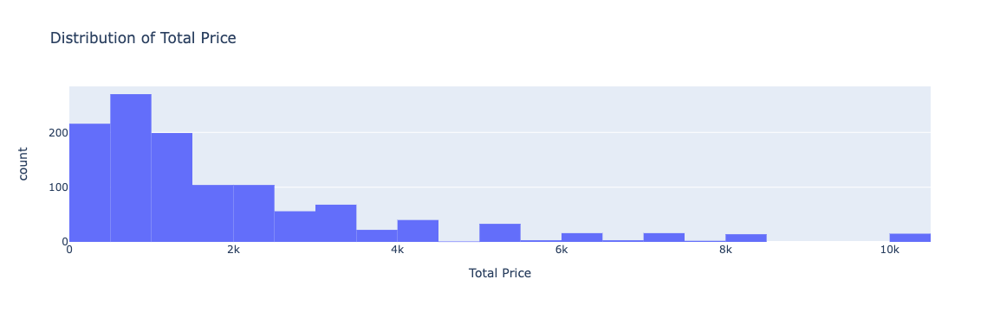

In [862]:
px.histogram(x = y_b, title = 'Distribution of Total Price',
             labels = {'x':'Total Price'})

**Observations:**
- The distribution is roughly bell shaped but squished towards 0 and with a long tail of outliers. 
- If we normalise the distribution, it might improve predictions for the outlying prices.

We can use the QuantileTransformer class from Scikit-learn to transform our target into a normal distribution. Below we visualise how the transformed data looks:  

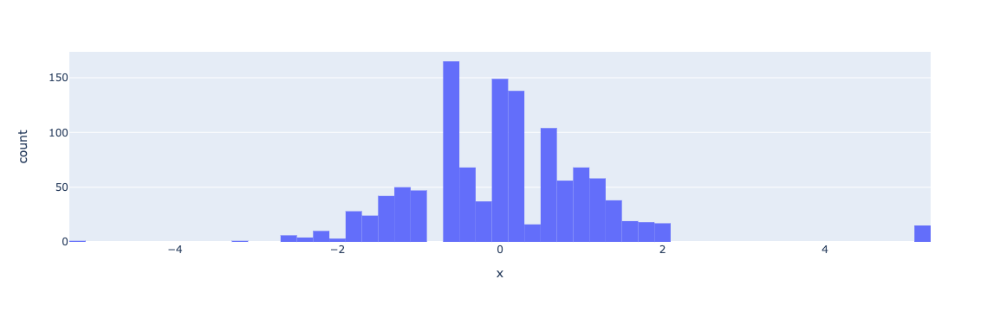

In [863]:
qt = QuantileTransformer(output_distribution='normal', random_state=0)
norm_y_b = qt.fit_transform(np.array(y_b).reshape(-1, 1))
px.histogram(x = norm_y_b['x0'])

**Observations:**
- The data is now much less spread out - this may improve our modelling. 
#### Create Pipeline
We will create a boosted tree model using a transformed target. Below we use the TransformedTargetRegressor class to perform the QuantileTransformer transformation on our target variable ('total_price') before regressing. Note that this class will return inverse-transformed data via its *.predict* method (so we never see transformed price predictions). 

In [801]:
pipe_tree_trans = TransformedTargetRegressor(
    regressor = pipe_tree, 
    transformer=QuantileTransformer(output_distribution='normal', 
                                    random_state=0))

#### Parameter Grid Search
Below we define a parameter gridsearch which is almost identical to our previous boosted tree gridsearch:

In [815]:
pca = [PCA(3), PCA(4), PCA(5), PCA(6)]

parameters = [{'regressor__preprocessor__cat__PCA':pca,
               'regressor__preprocessor__geo': ['passthrough'],#FunctionTransformer(project_coord)],
               'regressor__scaler': [RobustScaler()], #StandardScaler(), 
               #MaxAbsScaler(), QuantileTransformer()],
               'regressor__regressor__loss':['absolute_error'],#'squared_error', , 
                                 # 'huber', 'quantile'],
               'regressor__regressor__learning_rate':[0.08, 0.07, 0.06, 0.05,0.04],#, 0.01, 0.001],
              'regressor__regressor__n_estimators':[350, 400, 450, 500, 550],#50, 100, 200,400, 600, 1000],
              'regressor__regressor__max_depth':[2,3, 4, 5, 6],#1,],
              'regressor__regressor__max_features': ['sqrt']}]#, None]}]

gkf=GroupKFold(n_splits=5)

tree_trans = GridSearchCV(pipe_tree_trans, parameters, 
                   scoring = ['neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Now we fit our Target Transformed Boosted Tree grid search: 

In [816]:
tree_trans.fit(X_b, y_b, groups = X_b['venue_url'])

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but QuantileTransformer was fitted without feature names



GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('preprocessor',
                                                                             ColumnTransformer(transformers=[('num',
                                                                                                              Pipeline(steps=[('select_cols',
                                                                                                                               FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                                                                   kw_args={'columns': ['max_seated',
                                                                                                                                                                        'max_standing',
                                                                                                                                                                        'max_seated_or_standing',
                                                                                                                                                                        'Dinin...
                          'regressor__regressor__learning_rate': [0.08, 0.07,
                                                                  0.06, 0.05,
                                                                  0.04],
                          'regressor__regressor__loss': ['absolute_error'],
                          'regressor__regressor__max_depth': [2, 3, 4, 5, 6],
                          'regressor__regressor__max_features': ['sqrt'],
                          'regressor__regressor__n_estimators': [350, 400, 450,
                                                                 500, 550],
                          'regressor__scaler': [RobustScaler()]}],
             refit='neg_mean_absolute_error',
             scoring=['neg_mean_absolute_error'], verbose=3)

In [817]:
results_tree_trans = pd.DataFrame(tree_trans.cv_results_)
plot_data = results_tree_trans.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_regressor__preprocessor__cat__PCA,param_regressor__preprocessor__geo,param_regressor__regressor__learning_rate,param_regressor__regressor__loss,param_regressor__regressor__max_depth,param_regressor__regressor__max_features,param_regressor__regressor__n_estimators,param_regressor__scaler,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
281,0.578371,0.030033,0.005590,0.001452,PCA(n_components=5),passthrough,0.07,absolute_error,3,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-944.663878,-1093.760949,-1028.783587,-951.774555,-952.064358,-994.209465,58.544965,1
30,0.520799,0.057816,0.005735,0.001872,PCA(n_components=3),passthrough,0.07,absolute_error,3,sqrt,350,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-935.849434,-1127.645860,-1035.542730,-896.841151,-975.768833,-994.329602,80.919932,2
305,0.502209,0.038747,0.005333,0.001975,PCA(n_components=5),passthrough,0.06,absolute_error,3,sqrt,350,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-952.414415,-1095.232856,-1027.536896,-932.004983,-965.466035,-994.531037,59.595864,3
463,0.949052,0.020700,0.005442,0.000787,PCA(n_components=6),passthrough,0.05,absolute_error,4,sqrt,500,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-961.708816,-1074.048582,-1018.770954,-944.778365,-975.591264,-994.979596,46.520854,4
132,0.611263,0.047936,0.006130,0.002907,PCA(n_components=4),passthrough,0.08,absolute_error,3,sqrt,450,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-941.423910,-1108.344589,-1021.553790,-910.887102,-994.852602,-995.412399,68.551656,5
339,1.036716,0.048596,0.008182,0.006074,PCA(n_components=5),passthrough,0.05,absolute_error,4,sqrt,550,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-945.456493,-1088.167129,-1021.634031,-942.904181,-981.244603,-995.881287,54.301651,6
422,1.425213,0.037362,0.005936,0.000067,PCA(n_components=6),passthrough,0.07,absolute_error,6,sqrt,450,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-957.278604,-1094.782178,-1036.234641,-900.457863,-992.988802,-996.348418,66.351868,7
465,0.906518,0.071750,0.005041,0.000171,PCA(n_components=6),passthrough,0.05,absolute_error,5,sqrt,350,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-945.178377,-1094.007027,-1021.311913,-932.909913,-988.530783,-996.387602,58.076337,8
275,0.336823,0.014375,0.008092,0.004566,PCA(n_components=5),passthrough,0.07,absolute_error,2,sqrt,350,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-945.664425,-1109.298463,-1031.708974,-931.113142,-964.557117,-996.468424,66.095695,9
334,0.737053,0.026828,0.004742,0.000098,PCA(n_components=5),passthrough,0.05,absolute_error,3,sqrt,550,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-933.957078,-1085.720678,-1044.297981,-964.892651,-959.254141,-997.624506,57.509215,10


**Observations:**
- The mean cross validation MAE has dropped to **£994** which is even better than our previous boosted tree model (**£1014**). This is our best model now. 
- The typical error is now lower than the median price (**£1000**) - this is an improvement but as before is only incremental.
- Transforming our target has had a bigger effect than anticipated. 

In [823]:
pipe_tree_trans = tree_trans.best_estimator_

#### Model Lower Prices Only
Our OLS model was improved by modelling using only prices below £2100. We believe this improved the model by removing outliers. We would like to try training our best model (transformed target boosted tree) on the lower price dataset **X_d** to see if the same improvements occur. Below we define a grid search for our parameter search:

In [819]:
pca = [PCA(3), PCA(4), PCA(5), PCA(6)]

parameters = [{'regressor__preprocessor__cat__PCA':pca,
               'regressor__preprocessor__geo': ['passthrough'],#FunctionTransformer(project_coord)],
               'regressor__scaler': [RobustScaler()], #StandardScaler(), 
               #MaxAbsScaler(), QuantileTransformer()],
               'regressor__regressor__loss':['absolute_error'],#'squared_error', , 
                                 # 'huber', 'quantile'],
               'regressor__regressor__learning_rate':[0.1, 0.01, 0.05],#, 0.01, 0.001],
              'regressor__regressor__n_estimators':[200, 300, 400, 500, 600],#50, 100, 200,400, 600, 1000],
              'regressor__regressor__max_depth':[2,3, 4, 5, 6],#1,],
              'regressor__regressor__max_features': ['sqrt']}]#, None]}]

gkf=GroupKFold(n_splits=5)

tree_trans_low = GridSearchCV(pipe_tree_trans, parameters, 
                   scoring = ['neg_mean_absolute_error'], 
                   refit = 'neg_mean_absolute_error', 
                   cv = gkf, 
                   n_jobs = -1,
                   error_score='raise', 
                   verbose=3)

Now we train the model on the lower prices **X_d** dataset:

In [820]:
tree_trans_low.fit(X_d, y_d, groups = X_d['venue_url'])

Fitting 5 folds for each of 300 candidates, totalling 1500 fits


/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:2627: UserWarning:

n_quantiles (1000) is greater than the total number of samples (888). n_quantiles is set to n_samples.

/opt/homebrew/Caskroom/miniforge/base/envs/geo/lib/python3.8/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but QuantileTransformer was fitted without feature names



GridSearchCV(cv=GroupKFold(n_splits=5), error_score='raise',
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('preprocessor',
                                                                             ColumnTransformer(transformers=[('num',
                                                                                                              Pipeline(steps=[('select_cols',
                                                                                                                               FunctionTransformer(func=<function select_columns at 0x283352ca0>,
                                                                                                                                                   kw_args={'columns': ['max_seated',
                                                                                                                                                                        'max_standing',
                                                                                                                                                                        'max_seated_or_standing',
                                                                                                                                                                        'Dinin...
                          'regressor__regressor__learning_rate': [0.1, 0.01,
                                                                  0.05],
                          'regressor__regressor__loss': ['absolute_error'],
                          'regressor__regressor__max_depth': [2, 3, 4, 5, 6],
                          'regressor__regressor__max_features': ['sqrt'],
                          'regressor__regressor__n_estimators': [200, 300, 400,
                                                                 500, 600],
                          'regressor__scaler': [RobustScaler()]}],
             refit='neg_mean_absolute_error',
             scoring=['neg_mean_absolute_error'], verbose=3)

In [821]:
results_tree_trans_low = pd.DataFrame(tree_trans_low.cv_results_)
plot_data = results_tree_trans_low.sort_values('rank_test_neg_mean_absolute_error')
plot_data.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_regressor__preprocessor__cat__PCA,param_regressor__preprocessor__geo,param_regressor__regressor__learning_rate,param_regressor__regressor__loss,param_regressor__regressor__max_depth,param_regressor__regressor__max_features,param_regressor__regressor__n_estimators,param_regressor__scaler,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
47,1.215273,0.016657,0.008069,0.002712,PCA(n_components=3),passthrough,0.01,absolute_error,6,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-426.520638,-391.806123,-405.032208,-426.963241,-398.949307,-409.854303,14.411043,1
49,1.786419,0.049964,0.007340,0.001393,PCA(n_components=3),passthrough,0.01,absolute_error,6,sqrt,600,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-427.573971,-389.803009,-402.002491,-417.684305,-413.874391,-410.187633,13.073687,2
16,0.619363,0.026686,0.007161,0.004610,PCA(n_components=3),passthrough,0.1,absolute_error,5,sqrt,300,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-402.059854,-394.950472,-407.968520,-426.791383,-419.236567,-410.201359,11.495417,3
147,1.084287,0.024539,0.005245,0.000230,PCA(n_components=4),passthrough,0.05,absolute_error,6,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-421.188471,-384.724714,-389.895090,-425.578393,-430.318786,-410.341091,19.095482,4
46,0.943224,0.023966,0.005183,0.000115,PCA(n_components=3),passthrough,0.01,absolute_error,6,sqrt,300,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-424.588249,-391.360818,-408.671994,-430.042486,-397.297227,-410.392155,14.995283,5
48,1.465023,0.042983,0.006001,0.000212,PCA(n_components=3),passthrough,0.01,absolute_error,6,sqrt,500,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-427.667881,-387.420653,-399.122912,-429.534519,-408.691549,-410.487503,16.262922,6
197,1.261840,0.059304,0.005571,0.000046,PCA(n_components=5),passthrough,0.01,absolute_error,6,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-420.261333,-395.694044,-412.459289,-426.809774,-399.660940,-410.977076,11.838030,7
42,0.933197,0.036903,0.005059,0.000047,PCA(n_components=3),passthrough,0.01,absolute_error,5,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-426.731723,-395.719483,-407.298420,-428.623751,-397.867635,-411.248203,13.981635,8
122,1.267303,0.035269,0.008416,0.005730,PCA(n_components=4),passthrough,0.01,absolute_error,6,sqrt,400,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-428.845590,-392.105629,-407.114873,-427.582073,-402.496334,-411.628900,14.393446,9
124,1.750046,0.062044,0.006775,0.000723,PCA(n_components=4),passthrough,0.01,absolute_error,6,sqrt,600,RobustScaler(),{'regressor__preprocessor__cat__PCA': PCA(n_co...,-423.539721,-395.781837,-406.318666,-423.198445,-409.799518,-411.727637,10.567383,10


**Observations:**
- The mean cross validation MAE is about **£410** which is an improvement over the OLS model trained on the same data (**£447**). 
- The median price for the **X_d** data is **£750** and so we still have a relatively poor model. 

In [824]:
pipe_tree_trans_low = tree_trans_low.best_estimator_

### Model Evaluation
#### Test Error
The best performing model during training was the **target transformed boosted tree** model. We trained 2 of these models:
- One was trained on training data (from the train_min dataset) with a price under £10,000. We will call this **Tree_10k**. 
- The other was trained on training data (from the train_min dataset) with a price under £2,100. We will call this **Tree_2k**.

The test set was defined without any restriction on the price and thus has prices above £10,000. We think it doesn't make sense to test our model using prices that are higher than those available in training. However, this may not be best practice and could bias our test, so we will test each model on 3 different test sets (all made from the test_min dataset):
- The test set with all prices, **including over £10,000**
- The test set with only prices **below £10,000**
- The test set with only prices **below £2100**

Below we will calculate the training errors and report everything via a table: 

In [876]:
# Create the 2 new test sets
test_min_10k = test_min[test_min.total_price < 10000]
test_min_2k = test_min[test_min.total_price < 2100]

test_sets = [test_min, test_min_10k, test_min_2k]
test_set_name = ['full test set', 'Less than 10k', 'Less than 2.1k']

results = []
# Create model dictionaries to loop through to make table
Tree_10k = dict(model = pipe_tree_trans, name = 'Tree_10k',  
                train_data = (X_b, y_b))
Tree_2k = dict(model = pipe_tree_trans_low, name = 'Tree_2k', 
               train_data = (X_d, y_d))

# Loop through model dictionaries
for model in [Tree_10k, Tree_2k]:
    train_X, train_y = model['train_data']
    n_train_rows = train_X.shape[0]
    # Loop through the 3 different test sets and calculate training errors
    for test_data, test_data_name in zip(test_sets, test_set_name):
        y_pred_test = model['model'].predict(test_data)
        test_med_price = test_data.total_price.median()

        test_error_mae = mean_absolute_error(test_data['total_price'], 
                                   y_pred_test)
        n_test_rows = test_data.shape[0]
        
        results.append([model['name'], test_data_name, test_med_price,
                         test_error_mae, n_train_rows, n_test_rows])

# Create Dataframe 
test_results = pd.DataFrame(results, 
                            columns = ['model', 'Test Set', 'Test Median Price',
                                       'Test MAE', 'Number of Training Samples',
                                       'number of test samples'])
# Calculate proprotion of data used in training
test_results['training_prop'] = test_results['Number of Training Samples'] / (test_results['Number of Training Samples'] 
                                                                              + test_results['number of test samples'])
# Calculate proprotion of data used in testing
test_results['test_prop'] = test_results['number of test samples'] / (test_results['Number of Training Samples'] 
                                                                              + test_results['number of test samples'] )
test_results

,model,Test Set,Test Median Price,Test MAE,Number of Training Samples,number of test samples,training_prop,test_prop
0,Tree_10k,full test set,1000.0,1296.196779,1182,535,0.688410,0.311590
1,Tree_10k,Less than 10k,1000.0,977.576713,1182,520,0.694477,0.305523
2,Tree_10k,Less than 2.1k,675.0,494.183795,1182,368,0.762581,0.237419
3,Tree_2k,full test set,1000.0,1587.660526,888,535,0.624034,0.375966
4,Tree_2k,Less than 10k,1000.0,1217.328342,888,520,0.630682,0.369318
5,Tree_2k,Less than 2.1k,675.0,400.651436,888,368,0.707006,0.292994


**Observations:**
- When we compare the **Tree_10k** and **Tree_2k** models on the different test sets we see:
  - **Tree_10k** gets a lower test error for the **full test set** and the **less than 10k** test set. It performs substantially better than the **Test_2k** model, getting a test error at least £200 smaller each time. This is what we might expect given that the model was trained on the larger price data. 
  - For the **Less than 2.1k** data, **Tree_2k** has a test error of **£400** compared to **Tree_10k**s error of **£494**. **Tree_2k** performs better as expected but trades off its ability to predict prices above £2100.
- We think the **Test_2k** model is our best model, with a test error just above 50% of the test data median price. This model performs best if the price predicted is below £2100 otherwise the **Test_10k** model would be preferred.
- Overall, we have unfortunately not succeeded in making an accurate or useful model and will discuss possible reasons why in our conclusion. 
- Looking at the **training_prop** and **test_prop** columns we can see that for all training / test dataset combinations, we have approximately a 70/30 split, and thus we think our test errors are statistically reliable. 
- Dropping the prices over 10k from the test set only lost about 15 observations (from 535 in full test set to 520 in less than 10k test set) and significantly improved the test error for **Test_10k**  (from **£1296** to **£977**). This shows how the small number of massive outliers seriously distorts the results. 


## Conclusion
### Project Summary
We aimed to create a model to predict hire prices for venue spaces in London. This model could help venues price their event spaces competitively, ensuring they are not under or over priced to maximise their potential revenues. 

We performed the following tasks: 
- Scraped data for over 4000 venue spaces from the [Tagvenue](https://www.tagvenue.com/) website. We collected 2 datasets, one had the venue space characteristics (capacity, location etc.) and the other had price information for each space (price, type of price, day of week etc.). 
- Cleaned both scraped datasets. 
- Explored the prices dataset to understand what price information we had, what types of prices we could model and how we could model them. At the end of this process we merged the pricing and venue space characteristics data.  
- Explored the new combined dataset to identify useful predictors and to engineer new geographic and interaction features.
- Modelled prices using the following algorithms: 
  - OLS
  - Ridge, Lasso, Elastic Net
  - KNN
  - Boosted Decision Tree
  - Boosted Decision Tree with a transformed target
- The modelling included cross validation to optimise hyperparameters and select the best features and data transformations. Custom scikit-learn transformers were built, including calculating the average price in different geographic areas.
- The **Boosted Tree with transformed target** model was identified as the best during training. We built 2 versions of this model, one was trained on prices below £10,000 and the other on prices below £2,100. This was done to test whether large price outliers were impacting model quality. 
- The models above were tested on a hold out set and had the following mean absolute test error scores:
  - Trained on less than £10,000 prices -> MAE of **£977** on a test set with median price **£1000**
  - Trained on less than £2,100 prices -> MAE of **£400** on a test set with median price **£675**
  
### Project Outcomes:
- The model we created was not accurate enough to be useful and so unfortunately we did not succeed in creating a useful venue space pricing model.
- The project provided a wealth of experience in seeing a project through from data collection to modelling, including key steps like data scraping, data cleaning and exploration, feature selection, data transformation and hyperparameter tuning.  
- The poor performance of the model highlights the importance of good quality data. As the saying goes, bad data in means bad data out.  

### Why did the model perform poorly:
We think the poor performance of the model is mainly due to the poor quality of the venue space data we collected. During exploration, we only found a single highly correlated variable ('max_seated_or_standing') and neither the engineering of geographical based pricing features or the use of different models ever dramatically changed the performance. We think that either the pricing data is unreliable (perhaps because venues rarely update the prices or provided misleading or inaccurate pricing) or the key variables that set venue space pricing are absent from the Tagvenue website. 

### How Could The Model Be Improved?
There are a number of possible ways to improve our model: 
- Incorporate venue space pictures into the model. We did not use the venue pictures in our model. They may significantly determine the price and could be included using a neural network. 
- Use a more powerful geographic based model - we suspect that there are geographic specific models and approaches which could have extracted more predictive power from the latitude longitude information. 
- Source better data - perhaps by directly gathering venue pricing quotes from venues. It might be possible to conduct an automated poll asking venues directly for quotes. 
